# Introduction

The National Basketball Association, more commonly known as the NBA, is a professional basketball league in North America that comprises of 30 teams that represent different cities in the United States and Canada. For every regular season, which spans from months October to April, each team plays 82 games with the purpose of developing a ranking for who will get the chance to compete for that season's championship during the months May and June. The ultimate metric for success in this sport is 'points scored' as it is required to have more points than the opposing team to win. The catch is that there are an enormous amount of other variables that come into play that can make predicting which team will win any given game a great challenge. The purpose of this analysis is to investigate the abilities to predict the winners and losers of each game during the regular season based on historical team and player attributes with machine learning. Before any predictions can be made, data must first be explored and wrangled to develop data sets that can be used to train and test machine learning models. The approach will be to use a few different team and player data sets that will be combined is various ways to make an optimal data set for model training. 

In regards to machine learning, since this analysis will be looking at game outcomes from a win or lose perspective, the models that will be chosen will be models that are designed for binary classification purposes. 

# Strategy Breakdown

Since there are a few different pieces that make up the big picture of this analysis, things will be broken into a few different segments. 

The first segment will be to import and introduce the `Game Schedule Data Set`. This data set contains information about when each game was played, which teams played against each other, and most importantly, the outcome of each game, which will be the target variable for this analysis. 

The second segment will be to import and analyze data regarding `Team Statisitics`. These statistics describe overall team performance and a method for trying to predict the outcomes of games using machine learning will then be made using data sets regarding team data. 

The third segment will be to try and take things a level deeper and analyze individual `Player Statistics`. This approach could potentially allow for a more granular approach to studying and modeling game outcomes since it takes individual players to make up a whole team. So the assumption is that if individual player performances can be aggregated appropriately, it can better model team performance, and in term allow for better game to game predictions. The validity in this approach also comes from the fact the it is known before each game which players are expected to play and which players are not. So the hope in this approach is to see if there is a level of variance that can be captured by analyzing individual player data that overall team statistics will not catch on a game to game basis.

The final segment will be to test various models with an objective to optimize the modeling task to try and get the best results possible.


# Game Schedule Data Set

The first thing to establish is the data set that contains the scheduling for game match up with the resulting outcome of each game. This data set was initially found on Kaggle and requires a bit of manipulation. The process for cleaning and wrangling the data set is done below.

In [1]:
# Library import 
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import statsmodels.api as sm

import plotly.express as px
import plotly.graph_objects as go

from selenium import webdriver
from matplotlib import figure

import seaborn as sns

import requests

from bs4 import BeautifulSoup as bsoup
import random
import time 

from sklearn.pipeline import Pipeline


import math

from IPython.display import display

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.metrics import accuracy_score


from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import BorderlineSMOTE

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
# Import game boxscore data
games = pd.read_csv("data/game.csv") 

# Get first look at the data
games.head()

,season_id,team_id_home,team_abbreviation_home,team_name_home,game_id,game_date,matchup_home,wl_home,min,fgm_home,...,dreb_away,reb_away,ast_away,stl_away,blk_away,tov_away,pf_away,pts_away,plus_minus_away,video_available_away
0,21946,1610610035,HUS,Toronto Huskies,24600001,1946-11-01 00:00:00,HUS vs. NYK,L,0,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68,2,0
1,21946,1610610034,BOM,St. Louis Bombers,24600003,1946-11-02 00:00:00,BOM vs. PIT,W,0,20.0,...,NaN,NaN,NaN,NaN,NaN,NaN,25.0,51,-5,0
2,21946,1610610032,PRO,Providence Steamrollers,24600002,1946-11-02 00:00:00,PRO vs. BOS,W,0,21.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53,-6,0
3,21946,1610610025,CHS,Chicago Stags,24600004,1946-11-02 00:00:00,CHS vs. NYK,W,0,21.0,...,NaN,NaN,NaN,NaN,NaN,NaN,22.0,47,-16,0
4,21946,1610610028,DEF,Detroit Falcons,24600005,1946-11-02 00:00:00,DEF vs. WAS,L,0,10.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50,17,0


In [3]:
games.shape

(62367, 54)

With the first look at the data, it can be seen that the data dates back to the year 1946, containing over 62000 games, with quite a few missing values in many of the columns. The missing values can be due to unreliable statistical tracking back during that time. To condense the focus of the analysis, the years between 2012-2018 will be what will be focused on for this analysis.

In [4]:
# Convert 'game-date' to pandas 'datetime' 
games["game_date"] = pd.to_datetime(games["game_date"])

In [5]:
# Condense to seasons 2012-2018
games = games[(games["game_date"].dt.year >= 2012)  & (games["game_date"].dt.year <= 2018)]

# Only consider games played after August in 2012
games = games[(games["game_date"] >= "2012-08-01")]

# Reset Index
games = games.reset_index(drop=True)


The team names will now be double checked to ensure that their location and team names have been entered correctly.

In [6]:
# Get unique output for teams
games["team_name_home"].unique()

array(['Cleveland Cavaliers', 'Los Angeles Lakers', 'Miami Heat',
       'Phoenix Suns', 'Philadelphia 76ers', 'Los Angeles Clippers',
       'New Orleans Hornets', 'Portland Trail Blazers', 'Detroit Pistons',
       'Chicago Bulls', 'Toronto Raptors', 'Utah Jazz',
       'San Antonio Spurs', 'Golden State Warriors', 'Boston Celtics',
       'New York Knicks', 'Orlando Magic', 'Atlanta Hawks',
       'Minnesota Timberwolves', 'Charlotte Bobcats',
       'Oklahoma City Thunder', 'Washington Wizards', 'Brooklyn Nets',
       'Dallas Mavericks', 'Houston Rockets', 'Indiana Pacers',
       'Milwaukee Bucks', 'Sacramento Kings', 'Memphis Grizzlies',
       'Denver Nuggets', 'New Orleans Pelicans', 'Charlotte Hornets',
       'LA Clippers'], dtype=object)

In [7]:
# Change city location discrepancy 
games["team_name_home"] = games["team_name_home"].str.replace("LA Clippers", "Los Angeles Clippers")
games["team_name_away"] = games["team_name_away"].str.replace("LA Clippers", "Los Angeles Clippers")

In [8]:
games.tail()

,season_id,team_id_home,team_abbreviation_home,team_name_home,game_id,game_date,matchup_home,wl_home,min,fgm_home,...,dreb_away,reb_away,ast_away,stl_away,blk_away,tov_away,pf_away,pts_away,plus_minus_away,video_available_away
6693,22018,1610612754,IND,Indiana Pacers,21800542,2018-12-31,IND vs. ATL,W,240,42.0,...,32.0,53.0,24.0,8.0,5.0,17.0,23.0,108,-8,1
6694,22018,1610612745,HOU,Houston Rockets,21800544,2018-12-31,HOU vs. MEM,W,240,31.0,...,33.0,39.0,24.0,11.0,4.0,10.0,31.0,101,-12,1
6695,22018,1610612766,CHA,Charlotte Hornets,21800543,2018-12-31,CHA vs. ORL,W,240,42.0,...,35.0,48.0,22.0,6.0,5.0,12.0,21.0,100,-25,1
6696,22018,1610612759,SAS,San Antonio Spurs,21800545,2018-12-31,SAS vs. BOS,W,240,45.0,...,31.0,40.0,30.0,5.0,8.0,12.0,17.0,111,-9,1
6697,22018,1610612760,OKC,Oklahoma City Thunder,21800547,2018-12-31,OKC vs. DAL,W,240,46.0,...,44.0,49.0,21.0,7.0,3.0,29.0,29.0,102,-20,1


In [9]:
games.shape

(6698, 54)

Condensing the game schedule data set, now to 6697 games, initially shows improvement in statistical tracking in more recent years. Another motivation for using a smaller time frame in the data set is because the playing styles and rules of the game tend to change with each new era the game is played in. So focusing between the years 2012-2018 allows for an analysis where league wide playing standards will be similar. This new data set will now be cleaned and investigated to achieve the goals of this analaysis.

Since the goal is to focus on game outcome predictions based on overall team and player attributes, the exact statistical details of each individual game are not relevant. Looking at the columns of the game schedule data set, it can be seen that most of the columns are made to present information related to each game. This allows for most of the columns to be removed and only the details containing the team match up and outcomes can remain. Before doing this, the data set will be cleaned and wrangled to provide conveniences related to the purposes of this analysis.

In [10]:
# Check column data types
games.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6698 entries, 0 to 6697
Data columns (total 54 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   season_id               6698 non-null   int64         
 1   team_id_home            6698 non-null   int64         
 2   team_abbreviation_home  6698 non-null   object        
 3   team_name_home          6698 non-null   object        
 4   game_id                 6698 non-null   int64         
 5   game_date               6698 non-null   datetime64[ns]
 6   matchup_home            6698 non-null   object        
 7   wl_home                 6697 non-null   object        
 8   min                     6698 non-null   int64         
 9   fgm_home                6698 non-null   float64       
 10  fga_home                6698 non-null   float64       
 11  fg_pct_home             6697 non-null   float64       
 12  fg3m_home               6698 non-null   float64 

An NBA season starts in October and concludes in April of the following year. For referencing convenience, each season will be labeled by the year that it concludes in in April. For example, the 2012-2013 season will be labeled as season 2013.

In [11]:
# Label each season by the year the season concludes in
for i in range(0, games.shape[0]):
    
    if games["game_date"].dt.month[i] >= 9:
        games["season_id"][i] = (games["game_date"].dt.year[i] + 1)
        
    else:
        games["season_id"][i] = games["game_date"].dt.year[i]

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/1022570959.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  games["season_id"][i] = (games["game_date"].dt.year[i] + 1)
/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/1022570959.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  games["season_id"][i] = games["game_date"].dt.year[i]


One null was found, and after investigation it was found to be due to a game that was cancelled.

In [12]:
# Check for nulls
games.isna().sum()

season_id                 0
team_id_home              0
team_abbreviation_home    0
team_name_home            0
game_id                   0
game_date                 0
matchup_home              0
wl_home                   1
min                       0
fgm_home                  0
fga_home                  0
fg_pct_home               1
fg3m_home                 0
fg3a_home                 0
fg3_pct_home              1
ftm_home                  0
fta_home                  0
ft_pct_home               1
oreb_home                 0
dreb_home                 0
reb_home                  0
ast_home                  0
stl_home                  0
blk_home                  0
tov_home                  0
pf_home                   0
pts_home                  0
plus_minus_home           0
video_available_home      0
team_id_away              0
team_abbreviation_away    0
team_name_away            0
matchup_away              0
wl_away                   1
fgm_away                  0
fga_away            

In [13]:
# Check null row 
games[games["wl_home"].isna()]

,season_id,team_id_home,team_abbreviation_home,team_name_home,game_id,game_date,matchup_home,wl_home,min,fgm_home,...,dreb_away,reb_away,ast_away,stl_away,blk_away,tov_away,pf_away,pts_away,plus_minus_away,video_available_away
1213,2013,1610612738,BOS,Boston Celtics,21201214,2013-04-16,BOS vs. IND,NaN,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0


In [14]:
# Boston marathon game .. cancelled .. Remove Row
games = games.drop(games[games.isna().any(axis=1)].index)

games = games.reset_index(drop = True)

The abbreviation for team names was found to have inconsistencies, so it was important to unify these differences

In [15]:
# Modify abbreviated team names to be consistent  
games["team_abbreviation_home"] = games["team_abbreviation_home"].replace("BKN", "BRK")
games["team_abbreviation_away"] = games["team_abbreviation_away"].replace("BKN", "BRK")
games["team_abbreviation_home"] = games["team_abbreviation_home"].replace("PHX", "PHO")
games["team_abbreviation_away"] = games["team_abbreviation_away"].replace("PHX", "PHO")
games["team_abbreviation_home"] = games["team_abbreviation_home"].replace("CHA", "CHO")
games["team_abbreviation_away"] = games["team_abbreviation_away"].replace("CHA", "CHO")

In [16]:
# Break date into separate columns
games["year"] = 0
games["month"] = 0
games["day"] = 0
      
for i in range(0, games.shape[0]):
      
    games["day"][i] = games["game_date"].dt.day[i]
    games["month"][i] = games["game_date"].dt.month[i]
    games["year"][i] = games["game_date"].dt.year[i]
      

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/3951485267.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  games["day"][i] = games["game_date"].dt.day[i]
/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/3951485267.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  games["month"][i] = games["game_date"].dt.month[i]
/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/3951485267.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/ind

Now that the data has been cleaned and appropriately wrangled, it will now be condensed to only contain information regarding matchup scheduling and game outcomes. For increasing convenience in the future for referencing a specific team in a specific year, the `home_team_id` and `away_team_id` keys were created. 

In [17]:
games = games[["season_id", "team_abbreviation_home", "team_name_home", "team_abbreviation_away", "team_name_away", "game_date", "wl_home"]]

In [18]:
games["home_team_id"] = games["team_name_home"] + "-" + games["season_id"].astype(str)

games["away_team_id"] = games["team_name_away"] + "-" + games["season_id"].astype(str)

This will be the final version of the game schedule data set. An important thing to notice here is that the column that contains the game outcomes `wl_home` is always in reference to wins or loses of the home `team_name_home`.

In [19]:
# One-hot encode wins and loses 
#games["wl_home"] = games["wl_home"].map({"W": 1,
#                                         "L": 0}).astype(int)

In [20]:
games.head()

,season_id,team_abbreviation_home,team_name_home,team_abbreviation_away,team_name_away,game_date,wl_home,home_team_id,away_team_id
0,2013,CLE,Cleveland Cavaliers,WAS,Washington Wizards,2012-10-30,W,Cleveland Cavaliers-2013,Washington Wizards-2013
1,2013,LAL,Los Angeles Lakers,DAL,Dallas Mavericks,2012-10-30,L,Los Angeles Lakers-2013,Dallas Mavericks-2013
2,2013,MIA,Miami Heat,BOS,Boston Celtics,2012-10-30,W,Miami Heat-2013,Boston Celtics-2013
3,2013,PHO,Phoenix Suns,GSW,Golden State Warriors,2012-10-31,L,Phoenix Suns-2013,Golden State Warriors-2013
4,2013,PHI,Philadelphia 76ers,DEN,Denver Nuggets,2012-10-31,W,Philadelphia 76ers-2013,Denver Nuggets-2013


In [21]:
# Save for later
games_players = games.copy()

Now that the final version of the game schedule data set has been made, it will be beneficial to investigate the target variable `wl_home`. The distributions of this variable is important to understand because it can influence different precautions that may be necessary to take when it comes to processing training data for models. The graph below depicts a cumulative sum of wins and loses for each team between the years of 2012-2018. Something to note are the relative low values for some teams. This is due to the fact that those teams either relocated or changed their team name. So the cumulative wins and loses for the teams are divided between the new and old versions of the team. This is exemplified by the teams representing Charlotte.

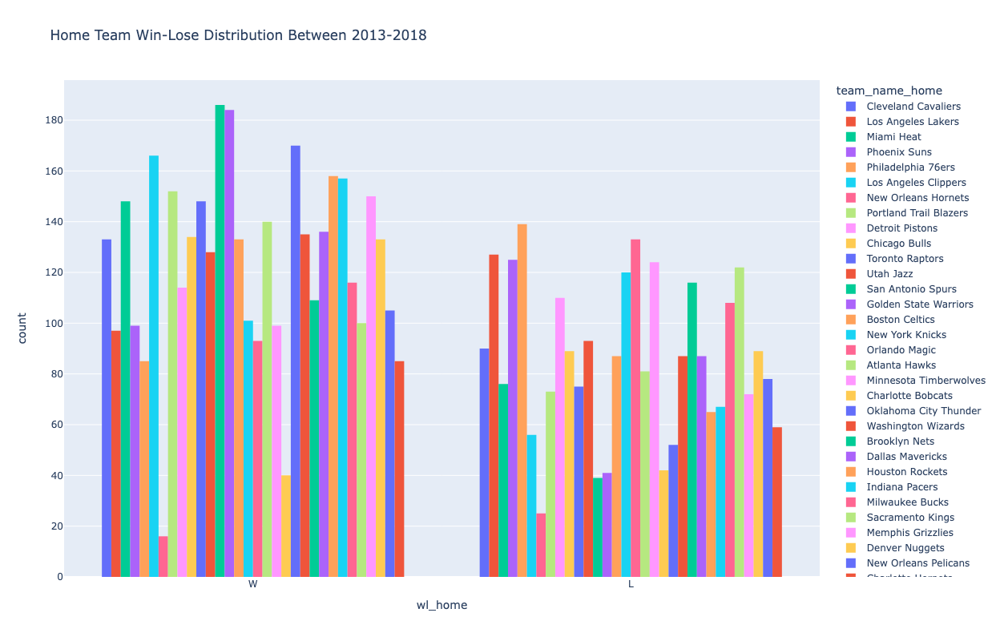

In [22]:
# Plot 'Win-Lose' Class distribution
fig = px.histogram(games, x = "wl_home", height = 800, width = 1500, title="Home Team Win-Lose Distribution Between 2013-2018", color = "team_name_home", barmode='group')

fig.show()

### Class Balance

Since the ultimate goal is to predict the classes wins and loses, it is important to check how these two classes are balanced in the data set. If there is an imbalance in the classes, then there will have to be strategies deployed to deal with this when it comes time to develop a model around the data. 

Plotting a histogram of the win-lose column in the data set shows that the win class `W` outweighs the lose `L` column 59% to 41%, implying that home teams win more than teams that are playing away from their home.

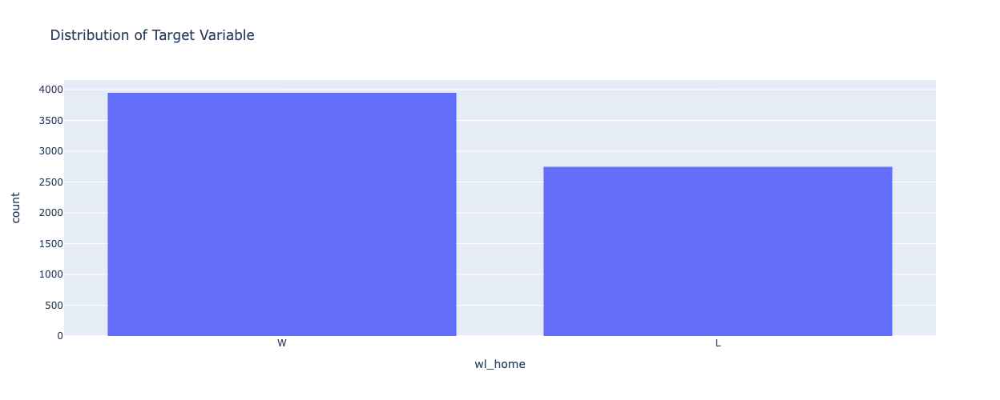

In [23]:
# Plot 'Win-Lose' Class distribution
fig = px.histogram(games, x = "wl_home", height = 500, width = 500, title="Distribution of Target Variable")

fig.show()

In [24]:
# 'Win-Lose' Class distribution percentage 
games["wl_home"].value_counts(normalize = True).mul(100).round(1).astype(str) + '%'

W    59.0%
L    41.0%
Name: wl_home, dtype: object

# Team Statistics

There are three data sets containing team data that will be used in this analysis. The three data sets are `Advanced Team Stats`, `Per 100 Possessions Stats`, and `Team Shooting Stats`. Each one will be introduced and the features that contain information that is not relevant for the purposes of this analysis will be removed. Once this is completed, all three data sets will be joined together to provide a detailed statistical breakdown for each team.

## Advanced Team Stats

Advanced team statistics data provide a more in-depth look into team performance than just looking at game by game stat totals. Some of the stats provided in the this data set are comprehensive stats that are a direct combination of other stats. As part of processing this data set, this columns will be removed as they are made through a combination of other stats already present in the data set. to better understand the data set, a definition breakdown of each column will be defined after importing the data set.

In [25]:
# Read in the advanced team data
team_adv_stats = pd.read_csv("data/advanced_team_2012-2018.csv")

team_adv_stats.rename( columns = {"eFG%.1": "eFG%_of_opp",
                                  "TOV%.1": "TOV%_of_opp",
                                  "FT/FGA.1": "FT/FGA_of_opp"
                                 }, inplace = True)

# Get first look at data 
team_adv_stats.head()

,Team,Rk,Age,W,L,PW,PL,MOV,SOS,SRS,...,ORB%,FT/FGA,eFG%_of_opp,TOV%_of_opp,DRB%,FT/FGA_of_opp,Arena,Attend.,Attend./G,Season
0,Miami Heat,1.0,29.0,58.0,24.0,61,21,7.46,-0.71,6.76,...,25.2,0.279,0.475,12.6,75.5,0.223,AmericanAirlines Arena,810930,19779,2011
1,Chicago Bulls,2.0,26.4,62.0,20.0,61,21,7.32,-0.79,6.53,...,29.4,0.227,0.463,13.6,76.2,0.222,United Center,893462,21792,2011
2,Los Angeles Lakers,3.0,30.2,57.0,25.0,58,24,6.11,-0.10,6.01,...,29.2,0.228,0.477,12.8,72.3,0.181,STAPLES Center,778877,18997,2011
3,San Antonio Spurs,4.0,28.8,61.0,21.0,56,26,5.71,0.16,5.86,...,24.9,0.229,0.491,12.6,74.6,0.190,AT&T Center,750879,18314,2011
4,Boston Celtics,5.0,29.5,56.0,26.0,57,25,5.37,-0.54,4.83,...,21.1,0.235,0.469,14.8,74.7,0.235,TD Garden,763584,18624,2011


Rk -- Rank
<br>
Age -- Player's age on February 1 of the season
<br>
W -- Wins
<br>
L -- Losses
<br>
PW -- Pythagorean wins, i.e., expected wins based on points scored and allowed
<br>
PL -- Pythagorean losses, i.e., expected losses based on points scored and allowed
<br>
MOV -- Margin of Victory
<br>
SOS -- Strength of Schedule; a rating of strength of schedule. The rating is denominated in points above/below average, where zero is average.
<br>
SRS -- Simple Rating System; a team rating that takes into account average point differential and strength of schedule. The rating is denominated in points above/below average, where zero is average.
<br>
ORtg -- Offensive Rating
An estimate of points produced (players) or scored (teams) per 100 possessions
<br>
DRtg -- Defensive Rating
An estimate of points allowed per 100 possessions
<br>
NRtg -- Net Rating; an estimate of point differential per 100 possessions.
<br>
Pace -- Pace Factor: An estimate of possessions per 48 minutes
<br>
FTr -- Free Throw Attempt Rate
Number of FT Attempts Per FG Attempt
<br>
3PAr -- 3-Point Attempt Rate
Percentage of FG Attempts from 3-Point Range
<br>
TS% -- True Shooting Percentage
A measure of shooting efficiency that takes into account 2-point field goals, 3-point field goals, and free throws.
<br>
<br>
Offense Four Factors:
<br>
eFG% -- Effective Field Goal Percentage
This statistic adjusts for the fact that a 3-point field goal is worth one more point than a 2-point field goal.
<br>
TOV% -- Turnover Percentage
An estimate of turnovers committed per 100 plays.
<br>
ORB% -- Offensive Rebound Percentage
An estimate of the percentage of available offensive rebounds a player grabbed while they were on the floor.
<br>
FT/FGA -- Free Throws Per Field Goal Attempt
<br>
<br>
Defense Four Factors:
<br>
eFG% -- Opponent Effective Field Goal Percentage
<br>
TOV% -- Opponent Turnover Percentage
<br>
DRB% -- Defensive Rebound Percentage
An estimate of the percentage of available defensive rebounds a player grabbed while they were on the floor.
<br>
FT/FGA -- Opponent Free Throws Per Field Goal Attempt

In [26]:
# Get shape of the data set
team_adv_stats.shape

(248, 29)

In [27]:
#team_adv_stats.drop(columns = ["Rk", "W", "L", "PW", "PL", "MOV", "SOS", "NRtg", "Arena", "Attend.", "Attend./G"], inplace = True)



team_adv_stats.set_index("Team", inplace = True)
team_adv_stats.drop("League Average", inplace = True)
team_adv_stats = team_adv_stats[team_adv_stats["Season"] > 2011]



team_adv_stats["team_id"] = team_adv_stats.index + "-" + team_adv_stats["Season"].astype(str)

In [28]:
team_adv_stats.head()

,Rk,Age,W,L,PW,PL,MOV,SOS,SRS,ORtg,...,FT/FGA,eFG%_of_opp,TOV%_of_opp,DRB%,FT/FGA_of_opp,Arena,Attend.,Attend./G,Season,team_id
Team,,,,,,,,,,,,,,,,,,,,,
Chicago Bulls,1.0,27.1,50.0,16.0,51,15,8.18,-0.76,7.43,107.4,...,0.184,0.450,12.8,74.3,0.175,United Center,731326,22161,2012,Chicago Bulls-2012
San Antonio Spurs,2.0,27.5,50.0,16.0,48,18,7.17,0.11,7.28,110.9,...,0.195,0.489,12.9,76.0,0.168,AT&T Center,607095,18397,2012,San Antonio Spurs-2012
Oklahoma City Thunder,3.0,25.1,47.0,19.0,46,20,6.12,0.32,6.44,109.8,...,0.269,0.465,13.0,72.1,0.207,Chesapeake Energy Arena,600699,18203,2012,Oklahoma City Thunder-2012
Miami Heat,4.0,28.3,46.0,20.0,47,19,5.98,-0.27,5.72,106.6,...,0.238,0.479,15.8,73.9,0.200,AmericanAirlines Arena,657855,19935,2012,Miami Heat-2012
Philadelphia 76ers,5.0,24.9,35.0,31.0,43,23,4.24,-0.65,3.59,103.9,...,0.161,0.460,13.5,75.2,0.192,Wells Fargo Center,577597,17503,2012,Philadelphia 76ers-2012


Looking at this data set, a starting point would be to try to get an idea for what makes a team win more games than another team then tends to lose more games. Since this data set contains information regarding how many wins each team accumulated season by season, it would serve as a benefit to generate some visual plots to see how winning could correlate to other statistics. 

The first comparison that was chosen was to see how true shooting percentage correlates to winning as seen below. The plot suggests that teams that win more games tend to shooting better percentages overall regardless of the volume of shots they take. These teams also tend to hold their opponents to lower shooting percentages as shown by the second graph.

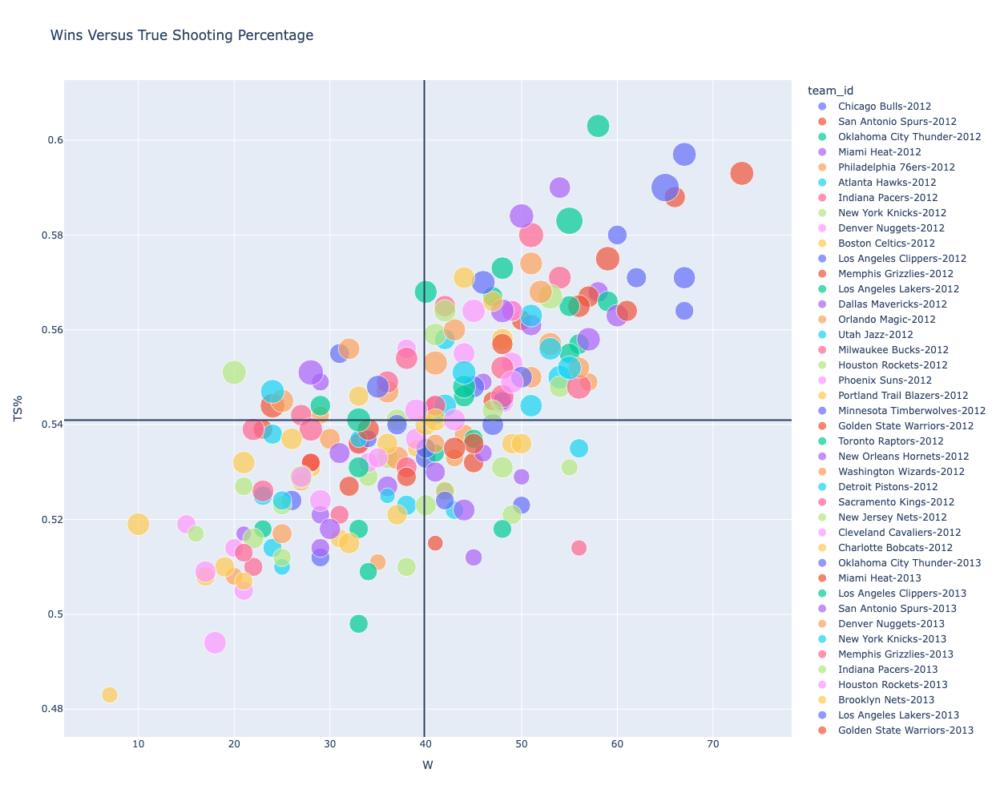

In [29]:
fig = px.scatter(team_adv_stats, x = "W", y = "TS%", height = 1000, width = 1500, color = "team_id", size = "3PAr", size_max = 25, title="Wins Versus True Shooting Percentage")
fig.add_hline(y = team_adv_stats["TS%"].mean())
fig.add_vline(x = team_adv_stats["W"].mean())
fig.show()

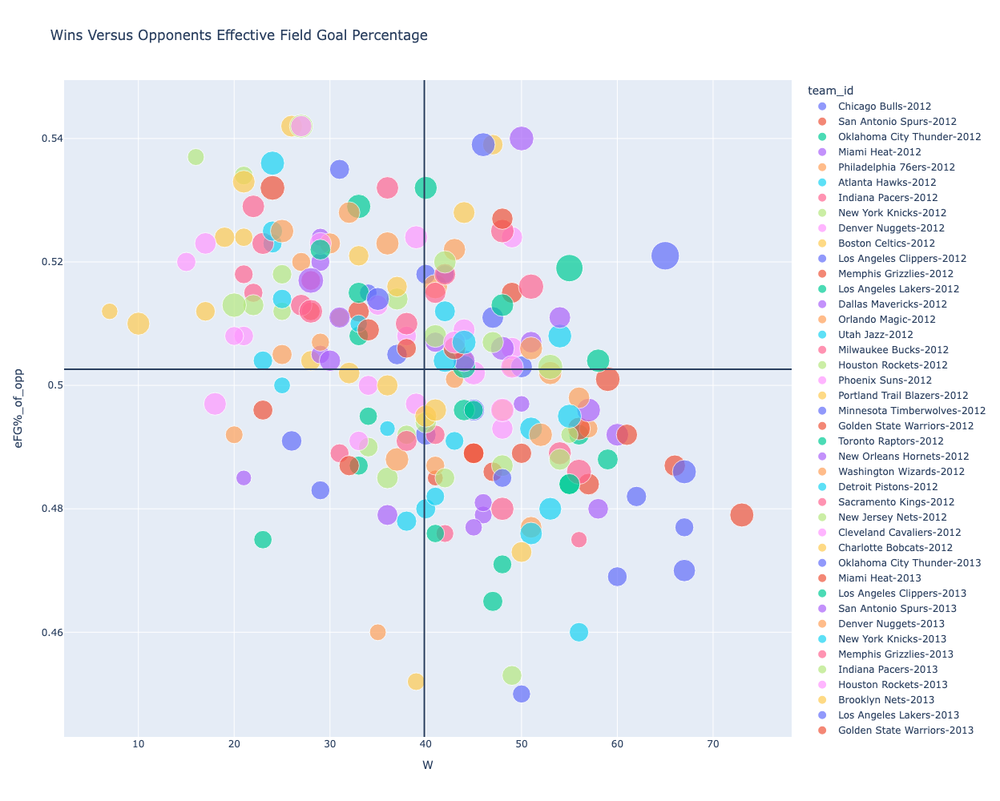

In [30]:
fig = px.scatter(team_adv_stats, x = "W", y = "eFG%_of_opp", height = 1000, width = 1500, color = "team_id", size = "3PAr", size_max = 25, title="Wins Versus Opponents Effective Field Goal Percentage")
fig.add_hline(y = team_adv_stats["eFG%_of_opp"].mean())
fig.add_vline(x = team_adv_stats["W"].mean())
fig.show()

There tends to be no trend in regard to pace and teams winning games. This means that success can be found whether a team's pace is low or high.

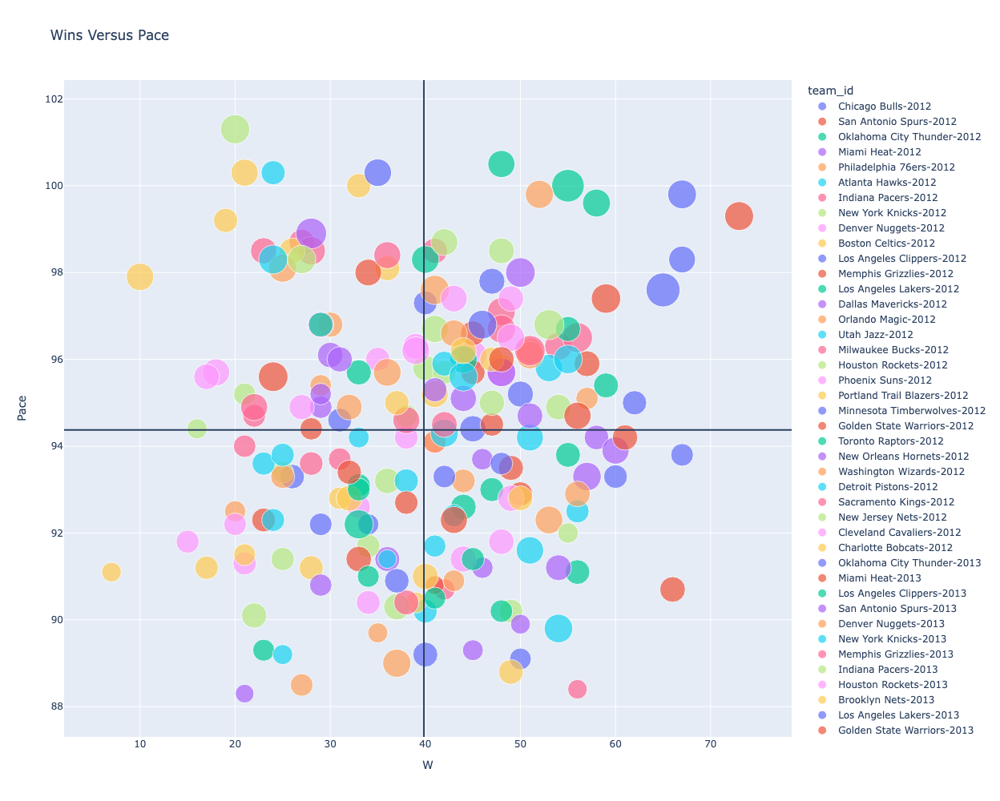

In [31]:
fig = px.scatter(team_adv_stats, x = "W", y = "Pace", height = 1000, width = 1500, color = "team_id", size = "3PAr", size_max = 30, title="Wins Versus Pace")
fig.add_hline(y = team_adv_stats["Pace"].mean())
fig.add_vline(x = team_adv_stats["W"].mean())
fig.show()

### Feature Correlation

Investigating this further, a correlation heatmap can provide a numerical metric for how all the statistics are correlated. To give context to what a heatmap is, a heatmap is a graphical representation of a correlation matrix. Correlation maps the strength of a linear relationship to a correlation coefficient that ranges between -1 and 1, with -1 implying a strong negative relationship, and 1 implying a strong positive relationship. If a correlation of 0 is found between two features, it can be concluded that no correlation exists between the two features. For our purposes here, if two features are found to be correlated with a correlation coefficient greater than .80 or less than -.80, then one of the features can be removed. This is due to the fact that removing one of the highly correlated features does not cause much information to be lost since the two features behave in accordance with one another. Features that are highly correlated can lead to a phenomenon called multi-collinearity. The consequences of multi-collinearity make it difficult to determine the individual effect of each independent feature on the target variable. Even though there are ways to alleviate these effects in the modeling phase, it is advantageous to be able to control which features are removed beforehand because we can leverage our domain knowledge to allow for a better selection of features to be removed for optimal interpretability in the modeling phase. The rule that will be followed here for removing correlated features will be to keep the feature that is more granular. So in other words, if a simple statistic are highly correlated with a more complex statistic that may made through some combination of other statistics, the more simple statistic will be kept and the complex one will be removed.

Below is a correlation heatmap displaying the correlations between each feature in the data set.


/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/2273946394.py:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/2273946394.py:6: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



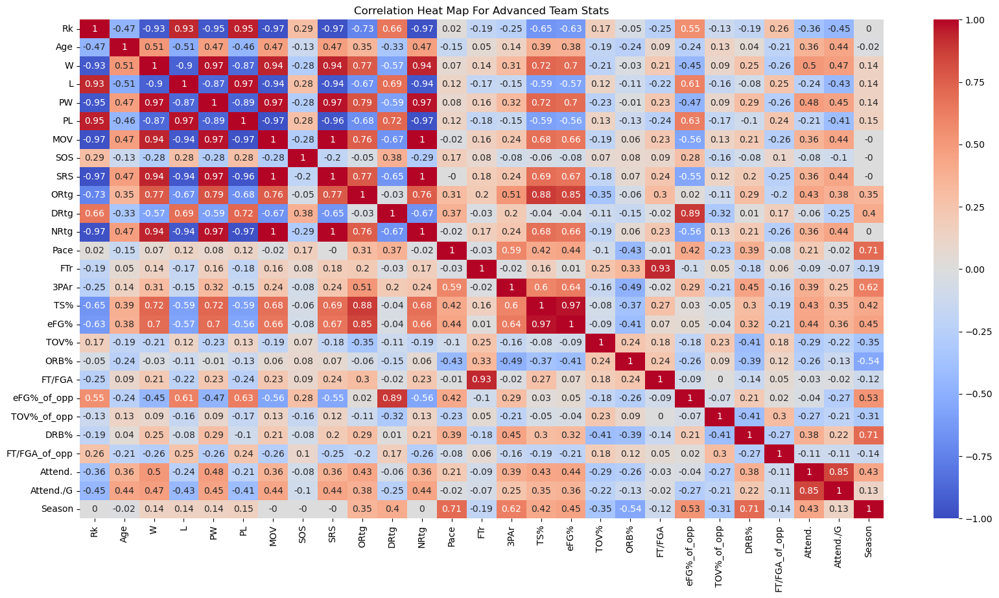

In [32]:
# Plot correlation heatmap
plt.figure(figsize = (20,10))

mask = np.triu(np.ones_like(team_adv_stats.corr(), dtype=bool))

sns.heatmap(team_adv_stats.corr().round(2), vmin = -1, cmap = "coolwarm", annot = True)

plt.title("Correlation Heat Map For Advanced Team Stats")
plt.show()

Besides removing highly correlated features, it is also important to remove features that do not serve well for the problem space. For example, the columns `W` and `L` provide context to a teams historical success when the problem that is trying to be solved here is to predict game outcomes strictly based on in game team performance attributes. Therefore, keeping these columns can lead to training models using information that wont actually be available beforehand in reality.

In [33]:
# Remove highly correlated and engineered features
#team_adv_stats = team_adv_stats.drop(columns = [ "FTr", "ORtg", "DRtg", "eFG%", "SRS"])

team_adv_stats = team_adv_stats.drop(columns = [ "FTr", "ORtg", "DRtg", "eFG%", "SRS", "MOV"])


team_adv_stats.drop(columns = ["Rk", "W", "L", "PW", "PL", "NRtg", "Arena", "Attend.", "Attend./G"], inplace = True)

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/3011226446.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



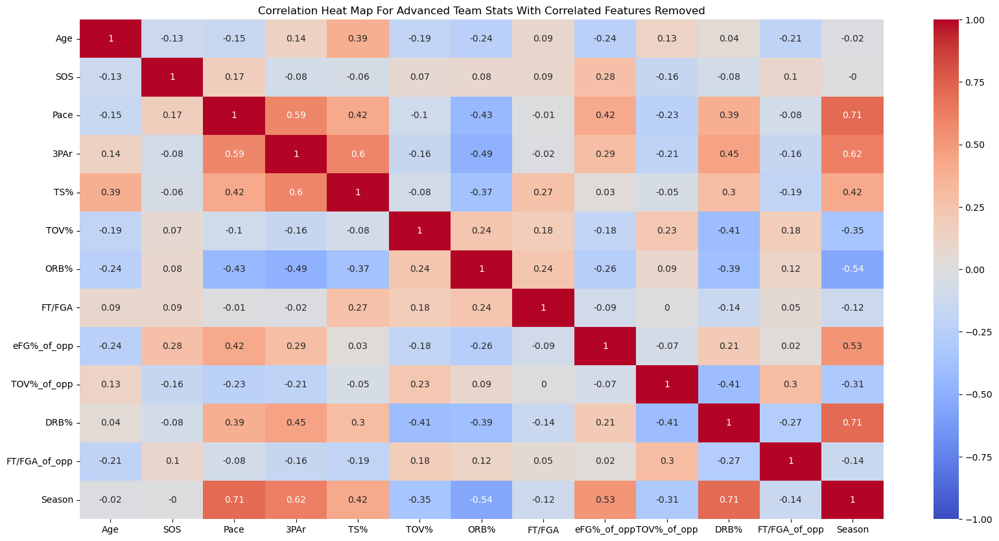

In [34]:
plt.figure(figsize = (20,10))

sns.heatmap(team_adv_stats.corr().round(2), vmin = -1, cmap = "coolwarm", annot = True)

plt.title("Correlation Heat Map For Advanced Team Stats With Correlated Features Removed")
plt.show()

In [35]:
#per_100_poss.groupby(["Team"]).get_group("Toronto Raptors")

The methodology that was used to process the `Advanced Team Stats` data will now be extended when importing and exploring data sets going forward in this analysis. 

In [36]:
pd.set_option("display.max_columns", None)
#pd.reset_option('display.max_rows')

## Per 100 Possession Stats

Per 100 stats in the NBA refer to statistical measures that estimate a player's performance per 100 possessions. These statistics are used to normalize team performances, accounting for differences in pace and playing time. In a fashion similar to how the `Advanced Team Stats`data set was processed, the `Per 100 Possession Stats` data set will be treated the same way with an effect to remove highly correlated features.

In [37]:
# Import 'Per 100 Possessions Data'
per_100_poss = pd.read_csv("data/per_100_poss_2012-2018.csv")

per_100_poss.set_index("Team", inplace = True)

per_100_poss.head()

,Rk,G,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Season
Team,,,,,,,,,,,,,,,,,,,,,,,,,
Denver Nuggets,1,82,19705,40.1,84.3,0.476,8.4,21.7,0.388,31.6,62.6,0.506,23.7,31.0,0.765,10.1,33.8,43.9,23.1,7.7,4.5,14.7,21.9,112.3,2011
San Antonio Spurs,2,82,19780,41.4,87.1,0.475,9.0,22.7,0.397,32.4,64.4,0.503,20.0,26.1,0.767,10.9,34.2,45.1,24.1,7.9,4.9,14.5,20.5,111.8,2011
Miami Heat,3,82,19780,40.5,84.1,0.481,7.3,19.7,0.370,33.2,64.4,0.515,23.5,30.5,0.769,10.5,35.6,46.1,21.9,7.3,5.7,15.2,22.3,111.7,2011
Houston Rockets,4,82,19880,40.6,89.4,0.454,8.7,23.6,0.367,31.9,65.8,0.486,21.4,26.7,0.801,12.3,32.7,45.0,25.1,7.4,4.8,14.2,21.0,111.3,2011
Oklahoma City Thunder,5,82,20005,39.7,85.5,0.464,6.3,18.2,0.347,33.4,67.4,0.495,25.6,31.1,0.823,11.7,33.7,45.4,21.6,8.5,6.3,15.0,23.8,111.2,2011


Rk -- Rank
<br>
G -- Games
<br>
MP -- Minutes Played
<br>
FG -- Field Goals
<br>
FGA -- Field Goal Attempts
<br>
FG% -- Field Goal Percentage
<br>
3P -- 3-Point Field Goals
<br>
3PA -- 3-Point Field Goal Attempts
<br>
3P% -- 3-Point Field Goal Percentage
<br>
2P -- 2-Point Field Goals
<br>
2PA -- 2-point Field Goal Attempts
<br>
2P% -- 2-Point Field Goal Percentage
<br>
FT -- Free Throws
<br>
FTA -- Free Throw Attempts
<br>
FT% -- Free Throw Percentage
<br>
ORB -- Offensive Rebounds
<br>
DRB -- Defensive Rebounds
<br>
TRB -- Total Rebounds
<br>
AST -- Assists
<br>
STL -- Steals
<br>
BLK -- Blocks
<br>
TOV -- Turnovers
<br>
PF -- Personal Fouls
<br>
PTS -- Points


In [38]:
# Drop columns that do not provide any analytical value
per_100_poss.drop(columns = ["Rk", "G", "MP"], inplace = True)

# Ensure data only contains sesons 2012-2018
per_100_poss = per_100_poss[per_100_poss["Season"] > 2011]

# Create a team id 
per_100_poss["team_id"] = per_100_poss.index + "-" + per_100_poss["Season"].astype(str)

per_100_poss = per_100_poss.add_suffix("_per100")

In [39]:
# First look at data
per_100_poss.head()

,FG_per100,FGA_per100,FG%_per100,3P_per100,3PA_per100,3P%_per100,2P_per100,2PA_per100,2P%_per100,FT_per100,FTA_per100,FT%_per100,ORB_per100,DRB_per100,TRB_per100,AST_per100,STL_per100,BLK_per100,TOV_per100,PF_per100,PTS_per100,Season_per100,team_id_per100
Team,,,,,,,,,,,,,,,,,,,,,,,
San Antonio Spurs,42.3,88.5,0.478,8.9,22.8,0.393,33.4,65.8,0.507,17.3,23.1,0.748,11.1,34.9,46.0,24.8,7.9,4.7,14.5,18.5,110.9,2012,San Antonio Spurs-2012
Oklahoma City Thunder,39.7,84.4,0.471,7.6,21.3,0.358,32.1,63.1,0.509,22.7,28.1,0.806,11.7,34.8,46.5,19.8,8.0,8.7,17.4,21.8,109.8,2012,Oklahoma City Thunder-2012
Denver Nuggets,40.9,85.9,0.476,6.9,20.8,0.332,33.9,65.0,0.522,20.5,28.0,0.735,11.7,33.4,45.2,25.1,8.6,5.2,16.1,20.6,109.2,2012,Denver Nuggets-2012
Los Angeles Clippers,41.1,90.5,0.455,8.7,24.3,0.357,32.5,66.2,0.490,17.6,25.9,0.680,13.5,32.8,46.2,23.3,9.4,5.3,14.8,23.6,108.5,2012,Los Angeles Clippers-2012
Chicago Bulls,41.7,92.3,0.452,7.1,18.9,0.375,34.6,73.4,0.471,17.0,23.5,0.722,15.5,36.6,52.0,25.8,7.7,6.6,15.6,19.2,107.4,2012,Chicago Bulls-2012


/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/3504944324.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



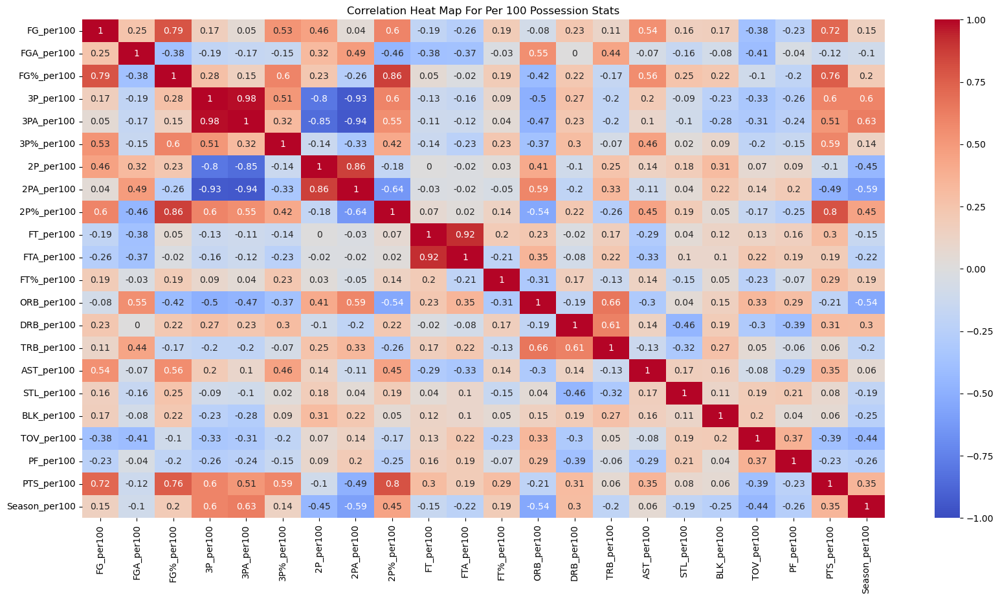

In [40]:
per_100_poss_correlation = per_100_poss.corr()

# Plot correlations between the columns
plt.figure(figsize = (20,10))
               
sns.heatmap(per_100_poss_correlation.round(2), vmin = -1, vmax = 1, cmap = "coolwarm", annot = True)

plt.title("Correlation Heat Map For Per 100 Possession Stats")

plt.show()

In [41]:

per_100_poss = per_100_poss.drop(columns = [ "FG%_per100", "PTS_per100", "3PA_per100", "2PA_per100", "FTA_per100"])


/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/1449875101.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

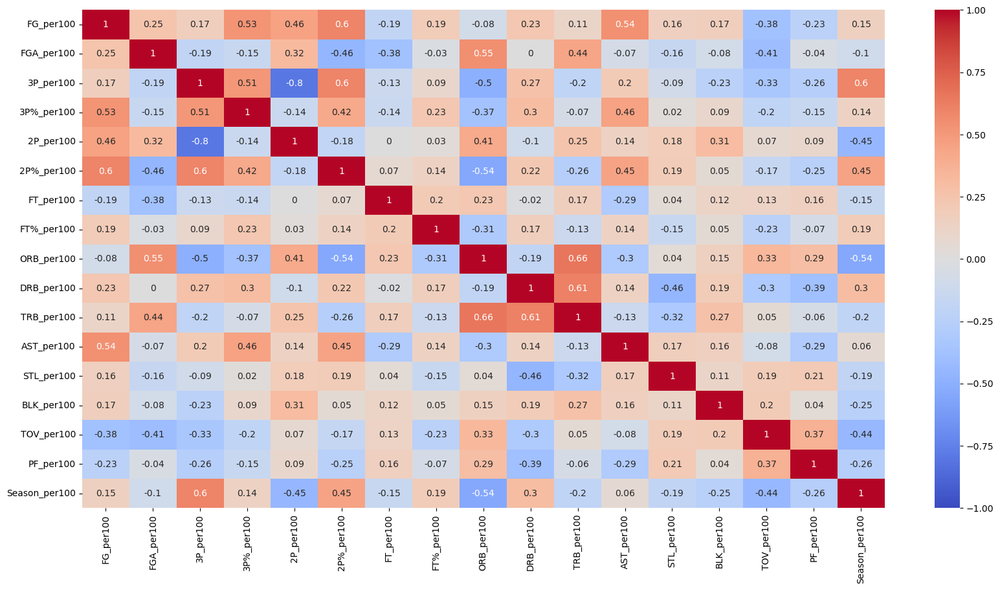

In [42]:
plt.figure(figsize = (20,10))
sns.heatmap(per_100_poss.corr().round(2), vmin = -1, vmax = 1, cmap = "coolwarm", annot = True) 

## Team Shooting Stats

In [43]:
team_shooting = pd.read_csv("data/shooting_team_2012-2018.csv")

team_shooting = team_shooting[team_shooting["Season"] >= 2012]
team_shooting.set_index("Team", inplace = True)
team_shooting.drop("League Average", inplace = True)

In [44]:
team_shooting.head()

,Rk,G,MP,FG%,Dist.,2P,0-3,3-10,10-16,16-3P,3P,2P.1,0-3.1,3-10.1,10-16.1,16-3P.1,3P.1,2P.2,3P.2,%FGA,Md.,%FGA.1,Md..1,%3PA,3P%,Att.,Md..2,Season
Team,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Atlanta Hawks,1.0,66,16165,0.454,13.2,0.751,0.277,0.153,0.074,0.247,0.249,0.482,0.630,0.430,0.397,0.373,0.370,0.532,0.915,0.048,233,0.225,699,0.340,0.398,8.0,1.0,2012
Boston Celtics,2.0,66,15940,0.460,12.9,0.806,0.280,0.116,0.145,0.266,0.194,0.483,0.637,0.333,0.418,0.420,0.367,0.620,0.909,0.049,223,0.228,670,0.309,0.439,4.0,0.0,2012
Charlotte Bobcats,3.0,66,15890,0.414,12.8,0.831,0.290,0.125,0.108,0.309,0.169,0.439,0.592,0.322,0.377,0.363,0.295,0.584,0.757,0.049,229,0.231,647,0.158,0.340,12.0,0.0,2012
Chicago Bulls,4.0,66,15940,0.452,12.6,0.795,0.297,0.142,0.116,0.241,0.205,0.471,0.605,0.415,0.405,0.372,0.375,0.581,0.807,0.046,231,0.235,717,0.261,0.375,13.0,0.0,2012
Cleveland Cavaliers,5.0,66,15965,0.422,11.7,0.763,0.326,0.188,0.081,0.167,0.238,0.446,0.599,0.322,0.326,0.343,0.346,0.516,0.836,0.044,211,0.263,799,0.236,0.359,6.0,0.0,2012


Rk -- Rank
<br>
G -- Games
<br>
MP -- Minutes Played
<br>
FG% -- Field Goal Percentage
<br>
Dist. -- Average distance (ft.) of FGA
<br>
<br>
% of FGA by Distance
<br>
2P -- % of FGAs that are 2-Pt FGAs.
<br>
0-3 -- % of FGAs that are 0-3 feet from the basket.
<br>
3-10 -- % of FGAs that are 3-10 feet from the basket.
<br>
10-16 -- % of FGAs that are 10-16 feet from the basket.
<br>
16-3P -- % of FGAs that are 2-Pt shots and 16+ feet from the basket.
<br>
3P -- % of FGAs that are 3-Pt FGAs.
<br>
<br>
FG% by Distance
<br>
0-3 -- FG% on FGAs that are 0-3 feet from the basket.
<br>
3-10 -- FG% on FGAs that are 3-10 feet from the basket.
<br>
10-16 -- FG% on FGAs that are 10-16 feet from the basket.
<br>
16-3P -- FG% on 2-Pt FGAs that are 16+ feet from the basket.
<br>
<br>
% of FG Ast'd
<br>
2P -- % of 2-Pt FGs that were assisted.
<br>
3P -- % of 3-Pt FGs that were assisted.
<br>
<br>
Dunks
<br>
%FGA -- % of FGAs that are dunk attempts.
<br>
Md. -- # of made dunk attempts.
<br>
<br>
Layups
<br>
%FGA -- % of FGAs that are layup attempts.
<br>
Md. -- # of made layup attempts.
<br>
<br>
Corner
<br>
%3PA -- % of 3PAs from the corner.
<br>
3P% -- 3P% on 3PAs from the corner.
<br>
<br>
Heaves
<br>
Att. -- Heave attempts (beyond half-court)
<br>
Md. -- Heaves made (beyond half-court)

In [45]:
team_shooting.shape

(210, 28)

In [46]:
team_shooting = team_shooting.drop(columns = ["Rk", "G", "MP"])

team_shooting = team_shooting[team_shooting["Season"] > 2012]

team_shooting["team_id"] = team_shooting.index + "-" + team_shooting["Season"].astype(str) 

In [47]:
team_shooting.info()

<class 'pandas.core.frame.DataFrame'>
Index: 180 entries, Atlanta Hawks to Washington Wizards
Data columns (total 26 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   FG%      180 non-null    float64
 1   Dist.    180 non-null    float64
 2   2P       180 non-null    float64
 3   0-3      180 non-null    float64
 4   3-10     180 non-null    float64
 5   10-16    180 non-null    float64
 6   16-3P    180 non-null    float64
 7   3P       180 non-null    float64
 8   2P.1     180 non-null    float64
 9   0-3.1    180 non-null    float64
 10  3-10.1   180 non-null    float64
 11  10-16.1  180 non-null    float64
 12  16-3P.1  180 non-null    float64
 13  3P.1     180 non-null    float64
 14  2P.2     180 non-null    float64
 15  3P.2     180 non-null    float64
 16  %FGA     180 non-null    float64
 17  Md.      180 non-null    int64  
 18  %FGA.1   180 non-null    float64
 19  Md..1    180 non-null    int64  
 20  %3PA     180 non-null    float64

In [48]:


team_shooting = team_shooting.rename(columns={"FG%": "FG%_Team",
                                              '2P': '2P_%_FGA_by_distance', 
                                              '0-3': '0-3_%_FGA_by_distance',
                                              "3-10": "3-10_%_FGA_by_distance",
                                              "10-16": "10-16_%_FGA_by_distance",
                                              "16-3P": "16-3P_%_FGA_by_distance",
                                              "3P": "3P_%_FGA_by_distance",
                                              '2P.1': '2P_%_FG_by_distance', 
                                              '0-3.1': '0-3_%_FG_by_distance',
                                              "3-10.1": "3-10_%_FG_by_distance",
                                              "10-16.1": "10-16_%_FG_by_distance",
                                              "16-3P.1": "16-3P_%_FG_by_distance",
                                              "3P.1": "3P_%_FG_by_distance",
                                              "2P.2": "2P_%_FG_Ast'd",
                                              "3P.2": "3P_%_FG_Ast'd",
                                              "%FGA": "%FGA_Dunks",
                                              "Md.": "Md_Dunks",
                                              "%FGA.1": "%FGA_Layups",
                                              "Md..1": "Md_Layups",
                                              "%3PA": "%3PA_Corner",
                                              "3P%": "3P%_ Corner",
                                              "Att.": "Att_Heaves",
                                              "Md..2": "Md_Heaves"
                                             
                                             })

In [49]:
team_shooting.head()

,FG%_Team,Dist.,2P_%_FGA_by_distance,0-3_%_FGA_by_distance,3-10_%_FGA_by_distance,10-16_%_FGA_by_distance,16-3P_%_FGA_by_distance,3P_%_FGA_by_distance,2P_%_FG_by_distance,0-3_%_FG_by_distance,3-10_%_FG_by_distance,10-16_%_FG_by_distance,16-3P_%_FG_by_distance,3P_%_FG_by_distance,2P_%_FG_Ast'd,3P_%_FG_Ast'd,%FGA_Dunks,Md_Dunks,%FGA_Layups,Md_Layups,%3PA_Corner,3P%_ Corner,Att_Heaves,Md_Heaves,Season,team_id
Team,,,,,,,,,,,,,,,,,,,,,,,,,,
Atlanta Hawks,0.464,13.4,0.714,0.281,0.152,0.073,0.208,0.286,0.501,0.678,0.382,0.387,0.389,0.371,0.585,0.874,0.052,323,0.222,924,0.264,0.426,12.0,0.0,2013,Atlanta Hawks-2013
Boston Celtics,0.465,12.9,0.785,0.287,0.130,0.128,0.239,0.215,0.494,0.623,0.357,0.446,0.439,0.358,0.555,0.914,0.043,258,0.237,880,0.339,0.399,22.0,0.0,2013,Boston Celtics-2013
Brooklyn Nets,0.450,12.6,0.731,0.272,0.203,0.102,0.154,0.269,0.484,0.623,0.405,0.397,0.400,0.357,0.484,0.871,0.041,249,0.231,873,0.349,0.395,12.0,0.0,2013,Brooklyn Nets-2013
Charlotte Bobcats,0.425,12.2,0.790,0.319,0.147,0.111,0.212,0.210,0.448,0.577,0.323,0.373,0.380,0.335,0.507,0.838,0.051,298,0.260,904,0.208,0.402,15.0,0.0,2013,Charlotte Bobcats-2013
Chicago Bulls,0.437,12.2,0.811,0.306,0.139,0.140,0.226,0.189,0.456,0.615,0.333,0.376,0.367,0.353,0.610,0.839,0.039,240,0.247,967,0.229,0.359,11.0,0.0,2013,Chicago Bulls-2013


/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/1952914222.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

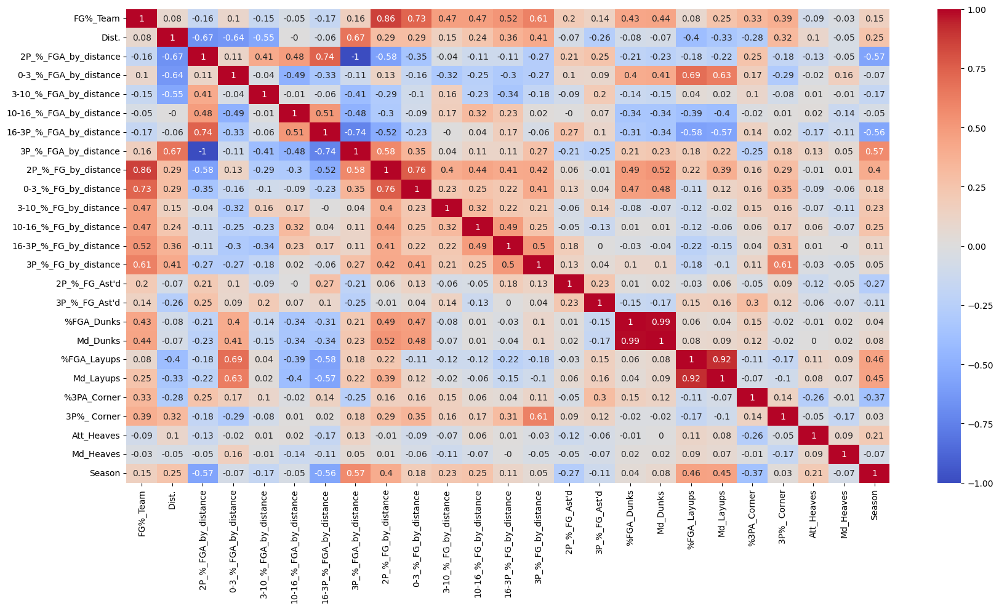

In [50]:
plt.figure(figsize = (20,10))
sns.heatmap(team_shooting.corr().round(2), vmin = -1, vmax = 1, cmap = "coolwarm", annot = True) 

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/3339820953.py:6: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

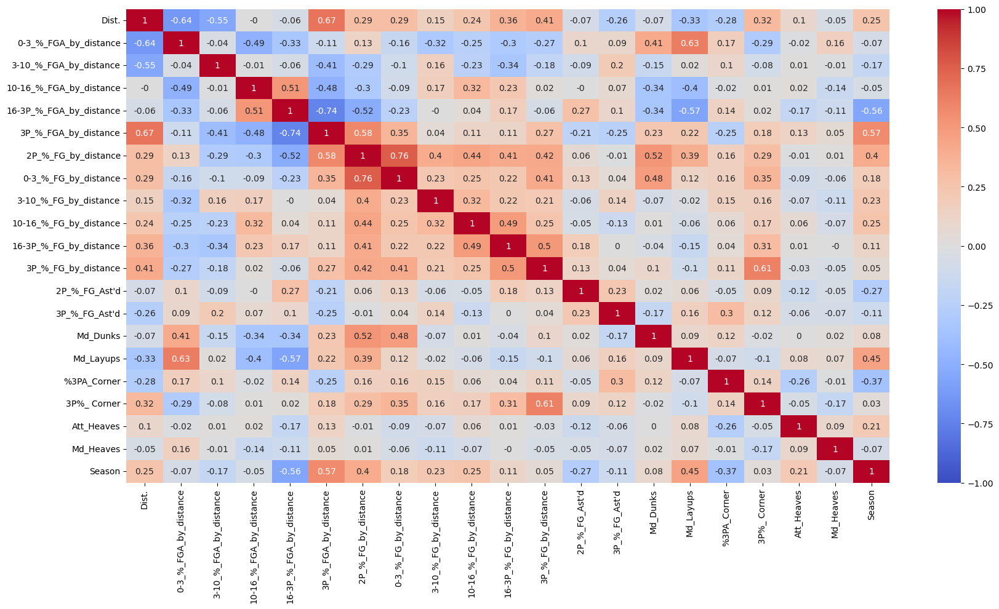

In [51]:

team_shooting = team_shooting.drop(columns = [ "%FGA_Dunks", "%FGA_Layups", "2P_%_FGA_by_distance", "FG%_Team"])



plt.figure(figsize = (20,10))
sns.heatmap(team_shooting.corr().round(2), vmin = -1, vmax = 1, cmap = "coolwarm", annot = True) 

## Team Stats Model

Now that the data sets have been separately analyzed, they can be combined and this bigger data set can be used for modeling team data with the goal of being able to predict the outcomes of games. The initial model that will be used is a logistic regression model to classify wins and loses. 

### Team Data Concatenation

Using the `Game Schedule` data set as a base, the `Advanced Team`, `Per 100 Possessions`, and `Team Shooting` data sets will be concatenated together by rows.

In [52]:
# Merge Advance Stats Table data set to schedule data set 
home_adv_stats = team_adv_stats.copy()
home_adv_stats = home_adv_stats.add_suffix("_home")

away_adv_stats = team_adv_stats.copy()
away_adv_stats = away_adv_stats.add_suffix("_away")

baseline_df = games.merge(home_adv_stats, left_on = "home_team_id", right_on = "team_id_home").sort_values("game_date")

baseline_df = baseline_df.merge(away_adv_stats, left_on = "away_team_id", right_on = "team_id_away").sort_values("game_date").reset_index(drop = True)


baseline_df.drop(columns = ["team_id_home", "team_id_away", "Season_home", "Season_away"], inplace = True)

baseline_df

,season_id,team_abbreviation_home,team_name_home,team_abbreviation_away,team_name_away,game_date,wl_home,home_team_id,away_team_id,Age_home,SOS_home,Pace_home,3PAr_home,TS%_home,TOV%_home,ORB%_home,FT/FGA_home,eFG%_of_opp_home,TOV%_of_opp_home,DRB%_home,FT/FGA_of_opp_home,Age_away,SOS_away,Pace_away,3PAr_away,TS%_away,TOV%_away,ORB%_away,FT/FGA_away,eFG%_of_opp_away,TOV%_of_opp_away,DRB%_away,FT/FGA_of_opp_away
0,2013,CLE,Cleveland Cavaliers,WAS,Washington Wizards,2012-10-30,W,Cleveland Cavaliers-2013,Washington Wizards-2013,24.1,-0.19,92.3,0.229,0.514,13.0,28.1,0.200,0.523,14.4,72.6,0.225,25.4,-0.25,92.2,0.223,0.512,14.2,24.6,0.191,0.483,13.7,74.6,0.206
1,2013,LAL,Los Angeles Lakers,DAL,Dallas Mavericks,2012-10-30,L,Los Angeles Lakers-2013,Dallas Mavericks-2013,30.7,0.32,94.4,0.303,0.548,13.9,27.0,0.239,0.496,11.9,74.3,0.163,29.5,0.36,94.1,0.236,0.544,13.0,21.8,0.192,0.492,13.3,73.1,0.227
2,2013,MIA,Miami Heat,BOS,Boston Celtics,2012-10-30,W,Miami Heat-2013,Boston Celtics-2013,30.3,-0.84,90.7,0.285,0.588,13.7,22.2,0.224,0.487,14.8,73.0,0.200,29.1,-0.40,91.7,0.215,0.542,14.1,20.1,0.204,0.482,14.2,73.3,0.216
3,2013,LAC,Los Angeles Clippers,MEM,Memphis Grizzlies,2012-10-31,W,Los Angeles Clippers-2013,Memphis Grizzlies-2013,28.8,-0.02,91.1,0.265,0.557,13.9,28.8,0.203,0.492,15.4,73.5,0.229,27.0,0.18,88.4,0.166,0.514,13.3,31.0,0.202,0.475,15.2,74.3,0.209
4,2013,NOH,New Orleans Hornets,SAS,San Antonio Spurs,2012-10-31,L,New Orleans Hornets-2013,San Antonio Spurs-2013,24.0,0.75,88.5,0.224,0.528,14.0,29.2,0.193,0.520,13.1,74.4,0.208,28.6,0.27,94.2,0.264,0.568,14.0,20.5,0.204,0.480,13.7,74.9,0.179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6144,2017,CLE,Cleveland Cavaliers,TOR,Toronto Raptors,2017-04-12,L,Cleveland Cavaliers-2017,Toronto Raptors-2017,29.2,-0.31,96.2,0.399,0.580,12.6,21.9,0.206,0.516,11.4,75.8,0.174,26.1,-0.56,94.7,0.289,0.561,11.8,25.0,0.233,0.507,13.5,76.3,0.223
6145,2017,HOU,Houston Rockets,MIN,Minnesota Timberwolves,2017-04-12,W,Houston Rockets-2017,Minnesota Timberwolves-2017,27.4,0.08,100.0,0.462,0.583,13.3,24.6,0.233,0.519,13.2,75.8,0.194,24.0,0.47,94.6,0.249,0.555,12.9,27.2,0.229,0.535,13.2,75.9,0.212
6146,2017,POR,Portland Trail Blazers,NOP,New Orleans Pelicans,2017-04-12,L,Portland Trail Blazers-2017,New Orleans Pelicans-2017,24.8,0.30,96.7,0.322,0.559,12.5,23.0,0.214,0.508,11.6,76.8,0.241,25.7,0.41,98.0,0.308,0.539,11.7,18.5,0.192,0.509,12.4,76.8,0.177
6147,2017,IND,Indiana Pacers,ATL,Atlanta Hawks,2017-04-12,W,Indiana Pacers-2017,Atlanta Hawks-2017,27.0,-0.42,95.9,0.272,0.558,12.8,21.2,0.212,0.512,13.6,75.5,0.225,27.9,-0.38,97.4,0.309,0.541,14.2,23.6,0.215,0.507,13.8,76.1,0.179


In [53]:
# Merge 100 possession data set to Advance Stats Table data set and schedule data set 
home_per_100 = per_100_poss.copy()
home_per_100 = home_per_100.add_suffix("_home")

away_per_100 = per_100_poss.copy()
away_per_100 = away_per_100.add_suffix("_away")

baseline_df = baseline_df.merge(home_per_100, left_on = "home_team_id", right_on = "team_id_per100_home")
baseline_df = baseline_df.merge(away_per_100, left_on = "away_team_id", right_on = "team_id_per100_away")

baseline_df.drop(columns = ["team_id_per100_home", "team_id_per100_away", "Season_per100_away", "Season_per100_home"], inplace = True)

baseline_df

,season_id,team_abbreviation_home,team_name_home,team_abbreviation_away,team_name_away,game_date,wl_home,home_team_id,away_team_id,Age_home,SOS_home,Pace_home,3PAr_home,TS%_home,TOV%_home,ORB%_home,FT/FGA_home,eFG%_of_opp_home,TOV%_of_opp_home,DRB%_home,FT/FGA_of_opp_home,Age_away,SOS_away,Pace_away,3PAr_away,TS%_away,TOV%_away,ORB%_away,FT/FGA_away,eFG%_of_opp_away,TOV%_of_opp_away,DRB%_away,FT/FGA_of_opp_away,FG_per100_home,FGA_per100_home,3P_per100_home,3P%_per100_home,2P_per100_home,2P%_per100_home,FT_per100_home,FT%_per100_home,ORB_per100_home,DRB_per100_home,TRB_per100_home,AST_per100_home,STL_per100_home,BLK_per100_home,TOV_per100_home,PF_per100_home,FG_per100_away,FGA_per100_away,3P_per100_away,3P%_per100_away,2P_per100_away,2P%_per100_away,FT_per100_away,FT%_per100_away,ORB_per100_away,DRB_per100_away,TRB_per100_away,AST_per100_away,STL_per100_away,BLK_per100_away,TOV_per100_away,PF_per100_away
0,2013,CLE,Cleveland Cavaliers,WAS,Washington Wizards,2012-10-30,W,Cleveland Cavaliers-2013,Washington Wizards-2013,24.1,-0.19,92.3,0.229,0.514,13.0,28.1,0.200,0.523,14.4,72.6,0.225,25.4,-0.25,92.2,0.223,0.512,14.2,24.6,0.191,0.483,13.7,74.6,0.206,39.5,91.0,7.2,0.346,32.2,0.460,18.2,0.756,13.2,31.1,44.3,22.3,8.5,4.4,15.1,22.9,38.2,87.8,7.1,0.365,31.0,0.455,16.8,0.733,11.6,34.8,46.4,23.3,7.8,4.9,16.2,22.0
1,2013,CLE,Cleveland Cavaliers,WAS,Washington Wizards,2013-03-12,W,Cleveland Cavaliers-2013,Washington Wizards-2013,24.1,-0.19,92.3,0.229,0.514,13.0,28.1,0.200,0.523,14.4,72.6,0.225,25.4,-0.25,92.2,0.223,0.512,14.2,24.6,0.191,0.483,13.7,74.6,0.206,39.5,91.0,7.2,0.346,32.2,0.460,18.2,0.756,13.2,31.1,44.3,22.3,8.5,4.4,15.1,22.9,38.2,87.8,7.1,0.365,31.0,0.455,16.8,0.733,11.6,34.8,46.4,23.3,7.8,4.9,16.2,22.0
2,2013,LAL,Los Angeles Lakers,WAS,Washington Wizards,2013-03-22,L,Los Angeles Lakers-2013,Washington Wizards-2013,30.7,0.32,94.4,0.303,0.548,13.9,27.0,0.239,0.496,11.9,74.3,0.163,25.4,-0.25,92.2,0.223,0.512,14.2,24.6,0.191,0.483,13.7,74.6,0.206,39.1,85.4,9.2,0.355,29.9,0.503,20.4,0.692,12.1,35.1,47.3,23.4,7.4,5.5,15.8,18.9,38.2,87.8,7.1,0.365,31.0,0.455,16.8,0.733,11.6,34.8,46.4,23.3,7.8,4.9,16.2,22.0
3,2013,MIA,Miami Heat,WAS,Washington Wizards,2012-12-15,W,Miami Heat-2013,Washington Wizards-2013,30.3,-0.84,90.7,0.285,0.588,13.7,22.2,0.224,0.487,14.8,73.0,0.200,25.4,-0.25,92.2,0.223,0.512,14.2,24.6,0.191,0.483,13.7,74.6,0.206,41.9,84.5,9.5,0.396,32.4,0.536,18.9,0.754,9.0,33.2,42.2,25.2,9.5,5.9,15.2,20.4,38.2,87.8,7.1,0.365,31.0,0.455,16.8,0.733,11.6,34.8,46.4,23.3,7.8,4.9,16.2,22.0
4,2013,MIA,Miami Heat,WAS,Washington Wizards,2013-01-06,W,Miami Heat-2013,Washington Wizards-2013,30.3,-0.84,90.7,0.285,0.588,13.7,22.2,0.224,0.487,14.8,73.0,0.200,25.4,-0.25,92.2,0.223,0.512,14.2,24.6,0.191,0.483,13.7,74.6,0.206,41.9,84.5,9.5,0.396,32.4,0.536,18.9,0.754,9.0,33.2,42.2,25.2,9.5,5.9,15.2,20.4,38.2,87.8,7.1,0.365,31.0,0.455,16.8,0.733,11.6,34.8,46.4,23.3,7.8,4.9,16.2,22.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6144,2017,LAC,Los Angeles Clippers,POR,Portland Trail Blazers,2016-12-12,W,Los Angeles Clippers-2017,Portland Trail Blazers-2017,30.0,0.13,96.1,0.329,0.574,12.0,21.5,0.233,0.506,12.1,76.9,0.211,24.8,0.30,96.7,0.322,0.559,12.5,23.0,0.214,0.508,11.6,76.8,0.241,41.0,86.3,10.6,0.375,30.4,0.525,20.1,0.745,9.3,35.3,44.6,23.4,7.7,4.4,13.4,20.6,40.4,87.9,10.6,0.375,29.8,0.499,18.8,0.780,10.3,34.3,44.6,21.6,7.2,5.1,14.0,21.6
6145,2017,HOU,Houston Rockets,POR,Portland Trail Blazers,2016-11-17,W,Houston Rockets-2017,Portland Trail Blazers-2017,27.4,0.08,100.0,0.462,0.583,13.3,24.6,0.233,0.519,13.2,75.8,0.194,24.8,0.30,96.7,0.322,0.559,12.5,23.0,0.214,0.508,11.6,76.8,0.241,40.1,86.8,14.3,0.357,25.8,0.552,20.2,0.766,10.8,33.3,44.1,25.1,8.1,4.3,15.0,19.8,40.4,87.9,10.6,0.375,29.8,0.499,18.8,0.780,10.3,34.3,44.6,21.6,7.2,5.

In [54]:
# Merge Team Shooting data set to Advance Stats Table data set and schedule data set 
home_team_shooting = team_shooting.copy()
home_team_shooting = home_team_shooting.add_suffix("_home")

away_team_shooting = team_shooting.copy()
away_team_shooting = away_team_shooting.add_suffix("_away")

baseline_df = baseline_df.merge(home_team_shooting, left_on = "home_team_id", right_on = "team_id_home")
baseline_df = baseline_df.merge(away_team_shooting, left_on = "away_team_id", right_on = "team_id_away").sort_values("game_date").reset_index(drop = True)

baseline_df.drop(columns = ["team_id_home", "team_id_away", "Season_away", "Season_home"], inplace = True)

#One-hot encode wins and loses 
baseline_df["wl_home"] = baseline_df["wl_home"].map({"W": 1,
                                         "L": 0}).astype(int)

baseline_df

,season_id,team_abbreviation_home,team_name_home,team_abbreviation_away,team_name_away,game_date,wl_home,home_team_id,away_team_id,Age_home,SOS_home,Pace_home,3PAr_home,TS%_home,TOV%_home,ORB%_home,FT/FGA_home,eFG%_of_opp_home,TOV%_of_opp_home,DRB%_home,FT/FGA_of_opp_home,Age_away,SOS_away,Pace_away,3PAr_away,TS%_away,TOV%_away,ORB%_away,FT/FGA_away,eFG%_of_opp_away,TOV%_of_opp_away,DRB%_away,FT/FGA_of_opp_away,FG_per100_home,FGA_per100_home,3P_per100_home,3P%_per100_home,2P_per100_home,2P%_per100_home,FT_per100_home,FT%_per100_home,ORB_per100_home,DRB_per100_home,TRB_per100_home,AST_per100_home,STL_per100_home,BLK_per100_home,TOV_per100_home,PF_per100_home,FG_per100_away,FGA_per100_away,3P_per100_away,3P%_per100_away,2P_per100_away,2P%_per100_away,FT_per100_away,FT%_per100_away,ORB_per100_away,DRB_per100_away,TRB_per100_away,AST_per100_away,STL_per100_away,BLK_per100_away,TOV_per100_away,PF_per100_away,Dist._home,0-3_%_FGA_by_distance_home,3-10_%_FGA_by_distance_home,10-16_%_FGA_by_distance_home,16-3P_%_FGA_by_distance_home,3P_%_FGA_by_distance_home,2P_%_FG_by_distance_home,0-3_%_FG_by_distance_home,3-10_%_FG_by_distance_home,10-16_%_FG_by_distance_home,16-3P_%_FG_by_distance_home,3P_%_FG_by_distance_home,2P_%_FG_Ast'd_home,3P_%_FG_Ast'd_home,Md_Dunks_home,Md_Layups_home,%3PA_Corner_home,3P%_ Corner_home,Att_Heaves_home,Md_Heaves_home,Dist._away,0-3_%_FGA_by_distance_away,3-10_%_FGA_by_distance_away,10-16_%_FGA_by_distance_away,16-3P_%_FGA_by_distance_away,3P_%_FGA_by_distance_away,2P_%_FG_by_distance_away,0-3_%_FG_by_distance_away,3-10_%_FG_by_distance_away,10-16_%_FG_by_distance_away,16-3P_%_FG_by_distance_away,3P_%_FG_by_distance_away,2P_%_FG_Ast'd_away,3P_%_FG_Ast'd_away,Md_Dunks_away,Md_Layups_away,%3PA_Corner_away,3P%_ Corner_away,Att_Heaves_away,Md_Heaves_away
0,2013,CLE,Cleveland Cavaliers,WAS,Washington Wizards,2012-10-30,1,Cleveland Cavaliers-2013,Washington Wizards-2013,24.1,-0.19,92.3,0.229,0.514,13.0,28.1,0.200,0.523,14.4,72.6,0.225,25.4,-0.25,92.2,0.223,0.512,14.2,24.6,0.191,0.483,13.7,74.6,0.206,39.5,91.0,7.2,0.346,32.2,0.460,18.2,0.756,13.2,31.1,44.3,22.3,8.5,4.4,15.1,22.9,38.2,87.8,7.1,0.365,31.0,0.455,16.8,0.733,11.6,34.8,46.4,23.3,7.8,4.9,16.2,22.0,12.4,0.294,0.174,0.116,0.188,0.229,0.460,0.584,0.352,0.385,0.411,0.346,0.509,0.821,338,804,0.211,0.338,12.0,1.0,13.1,0.238,0.177,0.145,0.216,0.223,0.455,0.623,0.393,0.371,0.377,0.365,0.543,0.901,296,675,0.330,0.457,8.0,0.0
1,2013,LAL,Los Angeles Lakers,DAL,Dallas Mavericks,2012-10-30,0,Los Angeles Lakers-2013,Dallas Mavericks-2013,30.7,0.32,94.4,0.303,0.548,13.9,27.0,0.239,0.496,11.9,74.3,0.163,29.5,0.36,94.1,0.236,0.544,13.0,21.8,0.192,0.492,13.3,73.1,0.227,39.1,85.4,9.2,0.355,29.9,0.503,20.4,0.692,12.1,35.1,47.3,23.4,7.4,5.5,15.8,18.9,40.6,88.0,7.7,0.372,32.9,0.489,16.9,0.793,9.8,34.1,43.9,24.3,8.3,5.8,14.6,21.7,13.3,0.281,0.170,0.089,0.158,0.303,0.503,0.649,0.396,0.424,0.402,0.355,0.518,0.859,356,853,0.257,0.375,19.0,0.0,13.0,0.242,0.179,0.160,0.182,0.236,0.489,0.627,0.432,0.412,0.431,0.372,0.538,0.860,196,813,0.232,0.363,18.0,0.0
2,2013,MIA,Miami Heat,BOS,Boston Celtics,2012-10-30,1,Miami Heat-2013,Boston Celtics-2013,30.3,-0.84,90.7,0.285,0.588,13.7,22.2,0.224,0.487,14.8,73.0,0.200,29.1,-0.40,91.7,0.215,0.542,14.1,20.1,0.204,0.482,14.2,73.3,0.216,41.9,84.5,9.5,0.396,32.4,0.536,18.9,0.754,9.0,33.2,42.2,25.2,9.5,5.9,15.2,20.4,39.6,85.2,6.6,0.358,33.0,0.494,17.4,0.776,8.6,33.4,42.0,24.3,8.8,4.8,15.6,22.6,13.2,0.297,0.127,0.099,0.192,0.285,0.536,0.704,0.401,0.387,0.441,0.396,0.522,0.866,392,910,0.384,0.433,6.0,0.0,12.9,0.287,0.130,0.128,0.239,0.215,0.494,0.623,0.357,0.446,0.439,0.358,0.555,0.914,258,880,0.339,0.399,22.0,0.0
3,2013,UTA,Utah Jazz,DAL,Dallas Mavericks,2012-10-31,1,Utah Jazz-2013,Dallas Mavericks-2013,26.3,0.38,90.9,0.206,0.533,13.8,28.8,0.214,0.501,14.0,73.2,0.226,29.5,0.36,94.1,0.236,0.544,13.0,21.8,0.192,0.492,13.3,73.1,0.227,40.4,89.1,6.7,0.366,33.7,0.477,19.1,0.764,13.1,32.6,45.8,24.7,9.2,6.8,16.1,23.2,40.6,88.0,7.7,0.372,32.9,0.489,16.9,0.793,

In [55]:
# Initial look at final concatenated data set
baseline_df

,season_id,team_abbreviation_home,team_name_home,team_abbreviation_away,team_name_away,game_date,wl_home,home_team_id,away_team_id,Age_home,SOS_home,Pace_home,3PAr_home,TS%_home,TOV%_home,ORB%_home,FT/FGA_home,eFG%_of_opp_home,TOV%_of_opp_home,DRB%_home,FT/FGA_of_opp_home,Age_away,SOS_away,Pace_away,3PAr_away,TS%_away,TOV%_away,ORB%_away,FT/FGA_away,eFG%_of_opp_away,TOV%_of_opp_away,DRB%_away,FT/FGA_of_opp_away,FG_per100_home,FGA_per100_home,3P_per100_home,3P%_per100_home,2P_per100_home,2P%_per100_home,FT_per100_home,FT%_per100_home,ORB_per100_home,DRB_per100_home,TRB_per100_home,AST_per100_home,STL_per100_home,BLK_per100_home,TOV_per100_home,PF_per100_home,FG_per100_away,FGA_per100_away,3P_per100_away,3P%_per100_away,2P_per100_away,2P%_per100_away,FT_per100_away,FT%_per100_away,ORB_per100_away,DRB_per100_away,TRB_per100_away,AST_per100_away,STL_per100_away,BLK_per100_away,TOV_per100_away,PF_per100_away,Dist._home,0-3_%_FGA_by_distance_home,3-10_%_FGA_by_distance_home,10-16_%_FGA_by_distance_home,16-3P_%_FGA_by_distance_home,3P_%_FGA_by_distance_home,2P_%_FG_by_distance_home,0-3_%_FG_by_distance_home,3-10_%_FG_by_distance_home,10-16_%_FG_by_distance_home,16-3P_%_FG_by_distance_home,3P_%_FG_by_distance_home,2P_%_FG_Ast'd_home,3P_%_FG_Ast'd_home,Md_Dunks_home,Md_Layups_home,%3PA_Corner_home,3P%_ Corner_home,Att_Heaves_home,Md_Heaves_home,Dist._away,0-3_%_FGA_by_distance_away,3-10_%_FGA_by_distance_away,10-16_%_FGA_by_distance_away,16-3P_%_FGA_by_distance_away,3P_%_FGA_by_distance_away,2P_%_FG_by_distance_away,0-3_%_FG_by_distance_away,3-10_%_FG_by_distance_away,10-16_%_FG_by_distance_away,16-3P_%_FG_by_distance_away,3P_%_FG_by_distance_away,2P_%_FG_Ast'd_away,3P_%_FG_Ast'd_away,Md_Dunks_away,Md_Layups_away,%3PA_Corner_away,3P%_ Corner_away,Att_Heaves_away,Md_Heaves_away
0,2013,CLE,Cleveland Cavaliers,WAS,Washington Wizards,2012-10-30,1,Cleveland Cavaliers-2013,Washington Wizards-2013,24.1,-0.19,92.3,0.229,0.514,13.0,28.1,0.200,0.523,14.4,72.6,0.225,25.4,-0.25,92.2,0.223,0.512,14.2,24.6,0.191,0.483,13.7,74.6,0.206,39.5,91.0,7.2,0.346,32.2,0.460,18.2,0.756,13.2,31.1,44.3,22.3,8.5,4.4,15.1,22.9,38.2,87.8,7.1,0.365,31.0,0.455,16.8,0.733,11.6,34.8,46.4,23.3,7.8,4.9,16.2,22.0,12.4,0.294,0.174,0.116,0.188,0.229,0.460,0.584,0.352,0.385,0.411,0.346,0.509,0.821,338,804,0.211,0.338,12.0,1.0,13.1,0.238,0.177,0.145,0.216,0.223,0.455,0.623,0.393,0.371,0.377,0.365,0.543,0.901,296,675,0.330,0.457,8.0,0.0
1,2013,LAL,Los Angeles Lakers,DAL,Dallas Mavericks,2012-10-30,0,Los Angeles Lakers-2013,Dallas Mavericks-2013,30.7,0.32,94.4,0.303,0.548,13.9,27.0,0.239,0.496,11.9,74.3,0.163,29.5,0.36,94.1,0.236,0.544,13.0,21.8,0.192,0.492,13.3,73.1,0.227,39.1,85.4,9.2,0.355,29.9,0.503,20.4,0.692,12.1,35.1,47.3,23.4,7.4,5.5,15.8,18.9,40.6,88.0,7.7,0.372,32.9,0.489,16.9,0.793,9.8,34.1,43.9,24.3,8.3,5.8,14.6,21.7,13.3,0.281,0.170,0.089,0.158,0.303,0.503,0.649,0.396,0.424,0.402,0.355,0.518,0.859,356,853,0.257,0.375,19.0,0.0,13.0,0.242,0.179,0.160,0.182,0.236,0.489,0.627,0.432,0.412,0.431,0.372,0.538,0.860,196,813,0.232,0.363,18.0,0.0
2,2013,MIA,Miami Heat,BOS,Boston Celtics,2012-10-30,1,Miami Heat-2013,Boston Celtics-2013,30.3,-0.84,90.7,0.285,0.588,13.7,22.2,0.224,0.487,14.8,73.0,0.200,29.1,-0.40,91.7,0.215,0.542,14.1,20.1,0.204,0.482,14.2,73.3,0.216,41.9,84.5,9.5,0.396,32.4,0.536,18.9,0.754,9.0,33.2,42.2,25.2,9.5,5.9,15.2,20.4,39.6,85.2,6.6,0.358,33.0,0.494,17.4,0.776,8.6,33.4,42.0,24.3,8.8,4.8,15.6,22.6,13.2,0.297,0.127,0.099,0.192,0.285,0.536,0.704,0.401,0.387,0.441,0.396,0.522,0.866,392,910,0.384,0.433,6.0,0.0,12.9,0.287,0.130,0.128,0.239,0.215,0.494,0.623,0.357,0.446,0.439,0.358,0.555,0.914,258,880,0.339,0.399,22.0,0.0
3,2013,UTA,Utah Jazz,DAL,Dallas Mavericks,2012-10-31,1,Utah Jazz-2013,Dallas Mavericks-2013,26.3,0.38,90.9,0.206,0.533,13.8,28.8,0.214,0.501,14.0,73.2,0.226,29.5,0.36,94.1,0.236,0.544,13.0,21.8,0.192,0.492,13.3,73.1,0.227,40.4,89.1,6.7,0.366,33.7,0.477,19.1,0.764,13.1,32.6,45.8,24.7,9.2,6.8,16.1,23.2,40.6,88.0,7.7,0.372,32.9,0.489,16.9,0.793,

After concatenating all the data sets together, we can see that we now have 105 columns with most of them being statistics regarding the two teams matching up for each game. We checked how each feature correlated with each other when looking at each individual data set, but combining the data sets together provides another opportunity for multi-collinearity to occur once again. Now that this data set is much bigger, checking using a heatmap can prove to be a cumbersome approach to removing multi-collinearity as the heatmap below displays. Based on the colors in the heatmap it only takes a quick glace to see that there are highly correlated features, but dealing with each pair manually can be avoided by using Lasso regression to try and treat the effects of multi-collinearity as well as reduce the dimensionality of the data set. This will be demonstrated when we try to engineer feature selection later in the analysis.

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/1177486526.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



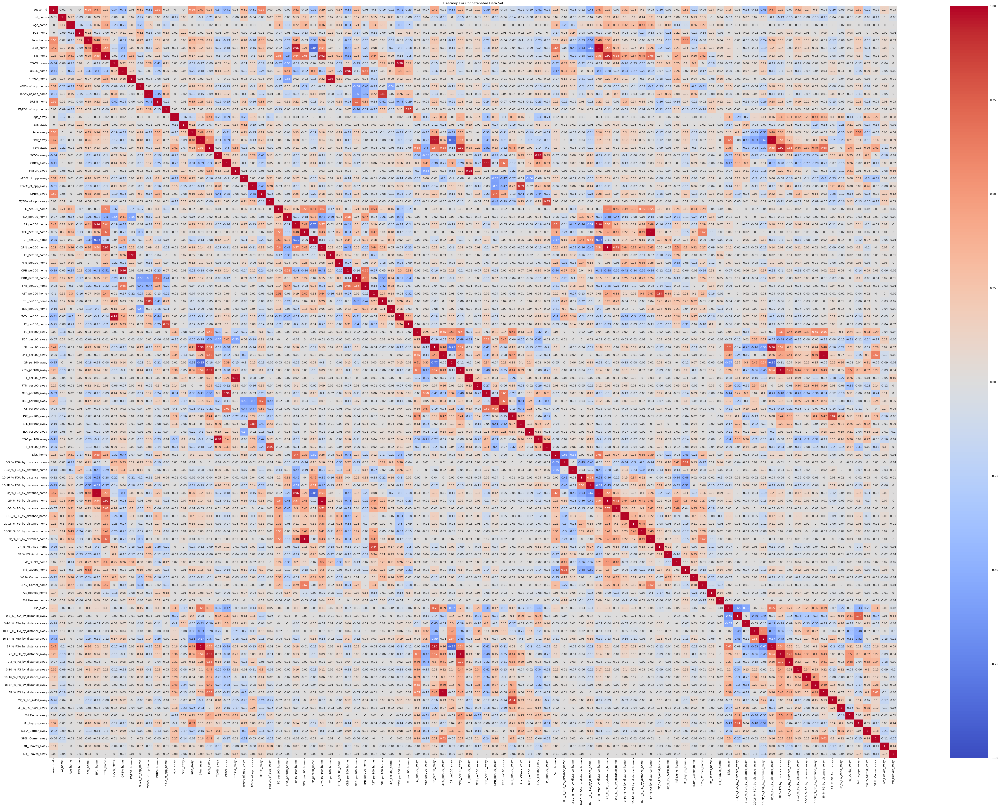

In [56]:
# Correlation Heatmap for concatenated data set
plt.figure(figsize = (70,50))
sns.heatmap(baseline_df.corr().round(2), vmin = -1, vmax = 1, cmap = "coolwarm", annot = True)

plt.title('Heatmap For Concatenated Data Set')

plt.show()

### Prediction Model Using Team Stats

To start, all the features in the `baseline_df` data frame will be used for training and testing a logistic model. Once that performance is measured as a baseline, a Lasso regression will be done with the purpose to try to attempt to reduce the number of features while trying to maintain performance. If this can be done successfully, the most key predictive features will remain and can provide insight on how which features influence game outcomes the most. 

The first step in the process is to establish the features and the target variable to be used for training and testing. Once this is done, the data can be split for modeling training and testing. An important thing to remember is that the target variable is imbalanced in its class distribution as previously shown when looking at the `Game Schedule` data set. This will be treated by up-sampling the losing games since they are underrepresented in the data set. To streamline the modeling process, a pipeline for logistic and lasso regression can be constructed.

In [57]:
# Features .. Eliminate non numeric columns
X = baseline_df.drop(columns = ["game_date", "team_abbreviation_home", "team_abbreviation_away", "team_name_home", "team_name_away", "home_team_id", "away_team_id", "wl_home"])

# Target Variable
y = baseline_df["wl_home"]


In [58]:
X.head()

,season_id,Age_home,SOS_home,Pace_home,3PAr_home,TS%_home,TOV%_home,ORB%_home,FT/FGA_home,eFG%_of_opp_home,TOV%_of_opp_home,DRB%_home,FT/FGA_of_opp_home,Age_away,SOS_away,Pace_away,3PAr_away,TS%_away,TOV%_away,ORB%_away,FT/FGA_away,eFG%_of_opp_away,TOV%_of_opp_away,DRB%_away,FT/FGA_of_opp_away,FG_per100_home,FGA_per100_home,3P_per100_home,3P%_per100_home,2P_per100_home,2P%_per100_home,FT_per100_home,FT%_per100_home,ORB_per100_home,DRB_per100_home,TRB_per100_home,AST_per100_home,STL_per100_home,BLK_per100_home,TOV_per100_home,PF_per100_home,FG_per100_away,FGA_per100_away,3P_per100_away,3P%_per100_away,2P_per100_away,2P%_per100_away,FT_per100_away,FT%_per100_away,ORB_per100_away,DRB_per100_away,TRB_per100_away,AST_per100_away,STL_per100_away,BLK_per100_away,TOV_per100_away,PF_per100_away,Dist._home,0-3_%_FGA_by_distance_home,3-10_%_FGA_by_distance_home,10-16_%_FGA_by_distance_home,16-3P_%_FGA_by_distance_home,3P_%_FGA_by_distance_home,2P_%_FG_by_distance_home,0-3_%_FG_by_distance_home,3-10_%_FG_by_distance_home,10-16_%_FG_by_distance_home,16-3P_%_FG_by_distance_home,3P_%_FG_by_distance_home,2P_%_FG_Ast'd_home,3P_%_FG_Ast'd_home,Md_Dunks_home,Md_Layups_home,%3PA_Corner_home,3P%_ Corner_home,Att_Heaves_home,Md_Heaves_home,Dist._away,0-3_%_FGA_by_distance_away,3-10_%_FGA_by_distance_away,10-16_%_FGA_by_distance_away,16-3P_%_FGA_by_distance_away,3P_%_FGA_by_distance_away,2P_%_FG_by_distance_away,0-3_%_FG_by_distance_away,3-10_%_FG_by_distance_away,10-16_%_FG_by_distance_away,16-3P_%_FG_by_distance_away,3P_%_FG_by_distance_away,2P_%_FG_Ast'd_away,3P_%_FG_Ast'd_away,Md_Dunks_away,Md_Layups_away,%3PA_Corner_away,3P%_ Corner_away,Att_Heaves_away,Md_Heaves_away
0,2013,24.1,-0.19,92.3,0.229,0.514,13.0,28.1,0.200,0.523,14.4,72.6,0.225,25.4,-0.25,92.2,0.223,0.512,14.2,24.6,0.191,0.483,13.7,74.6,0.206,39.5,91.0,7.2,0.346,32.2,0.460,18.2,0.756,13.2,31.1,44.3,22.3,8.5,4.4,15.1,22.9,38.2,87.8,7.1,0.365,31.0,0.455,16.8,0.733,11.6,34.8,46.4,23.3,7.8,4.9,16.2,22.0,12.4,0.294,0.174,0.116,0.188,0.229,0.460,0.584,0.352,0.385,0.411,0.346,0.509,0.821,338,804,0.211,0.338,12.0,1.0,13.1,0.238,0.177,0.145,0.216,0.223,0.455,0.623,0.393,0.371,0.377,0.365,0.543,0.901,296,675,0.330,0.457,8.0,0.0
1,2013,30.7,0.32,94.4,0.303,0.548,13.9,27.0,0.239,0.496,11.9,74.3,0.163,29.5,0.36,94.1,0.236,0.544,13.0,21.8,0.192,0.492,13.3,73.1,0.227,39.1,85.4,9.2,0.355,29.9,0.503,20.4,0.692,12.1,35.1,47.3,23.4,7.4,5.5,15.8,18.9,40.6,88.0,7.7,0.372,32.9,0.489,16.9,0.793,9.8,34.1,43.9,24.3,8.3,5.8,14.6,21.7,13.3,0.281,0.170,0.089,0.158,0.303,0.503,0.649,0.396,0.424,0.402,0.355,0.518,0.859,356,853,0.257,0.375,19.0,0.0,13.0,0.242,0.179,0.160,0.182,0.236,0.489,0.627,0.432,0.412,0.431,0.372,0.538,0.860,196,813,0.232,0.363,18.0,0.0
2,2013,30.3,-0.84,90.7,0.285,0.588,13.7,22.2,0.224,0.487,14.8,73.0,0.200,29.1,-0.40,91.7,0.215,0.542,14.1,20.1,0.204,0.482,14.2,73.3,0.216,41.9,84.5,9.5,0.396,32.4,0.536,18.9,0.754,9.0,33.2,42.2,25.2,9.5,5.9,15.2,20.4,39.6,85.2,6.6,0.358,33.0,0.494,17.4,0.776,8.6,33.4,42.0,24.3,8.8,4.8,15.6,22.6,13.2,0.297,0.127,0.099,0.192,0.285,0.536,0.704,0.401,0.387,0.441,0.396,0.522,0.866,392,910,0.384,0.433,6.0,0.0,12.9,0.287,0.130,0.128,0.239,0.215,0.494,0.623,0.357,0.446,0.439,0.358,0.555,0.914,258,880,0.339,0.399,22.0,0.0
3,2013,26.3,0.38,90.9,0.206,0.533,13.8,28.8,0.214,0.501,14.0,73.2,0.226,29.5,0.36,94.1,0.236,0.544,13.0,21.8,0.192,0.492,13.3,73.1,0.227,40.4,89.1,6.7,0.366,33.7,0.477,19.1,0.764,13.1,32.6,45.8,24.7,9.2,6.8,16.1,23.2,40.6,88.0,7.7,0.372,32.9,0.489,16.9,0.793,9.8,34.1,43.9,24.3,8.3,5.8,14.6,21.7,12.5,0.274,0.192,0.105,0.224,0.206,0.477,0.662,0.377,0.375,0.383,0.366,0.554,0.893,318,851,0.219,0.378,16.0,0.0,13.0,0.242,0.179,0.160,0.182,0.236,0.489,0.627,0.432,0.412,0.431,0.372,0.538,0.860,196,813,0.232,0.363,18.0,0.0
4,2013,24.4,0.65,91.4,0.284,0.536,13.9,25.3,0.194,0.512,12.5,73.3,0.189,30.7,0.32,94.4,0.303,0.548,13.9,27.0,0.239,0.496,11.9,74.3,0.163,39.8,88.8,8.9,0.353,30.9,0.486,17.2,0.776,11.6,32.7,44.3,23.6,7.1,4.7,15.9,20.1,39.1,85.4,9.2,0.355,29

There are now 97 features that will be used for model training and evaluation.

In [59]:
# Number of features 
len(X.columns)

97

#### Training/Testing Data

In [60]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .30, stratify = y, random_state = 30)


In [61]:
# Implement over-sampling to deal with class imbalance
smote = BorderlineSMOTE(random_state = 30)

X_train, y_train = smote.fit_resample(X_train, y_train)

#### Pipelines

In [62]:
# Initialize pipline for logistic regression
team_log_reg_pipeline = Pipeline([
                            ('scaler',MinMaxScaler()),
                            ('model',LogisticRegression())
])

In [63]:
# Initialize pipline for lasso regression
team_lasso_pipeline = Pipeline([
                     ('scaler',MinMaxScaler()),
                     ('model',Lasso())
])

#### Logistic Regression Model (All Features)

In [64]:
# Set `max_iter` to 1000
team_log_reg_pipeline.set_params(model__max_iter = 1000)
team_log_reg_pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model', LogisticRegression(max_iter=1000))])

In [65]:
scores = cross_val_score(team_log_reg_pipeline, X_train, y_train, cv = 5)

scores.mean()

0.6792490118577076

In [66]:
print(classification_report(y_test, team_log_reg_pipeline.predict(X_test)))

              precision    recall  f1-score   support

           0       0.58      0.66      0.62       760
           1       0.74      0.67      0.70      1085

    accuracy                           0.67      1845
   macro avg       0.66      0.66      0.66      1845
weighted avg       0.67      0.67      0.67      1845



After running logistic regression with all 97 features, we get a classification training accuracy of 68% using 5-fold cross-validation, and testing accuracy of 67%. With an f1-score of 61% when it comes to classifying loses and 71% when classifying wins. Now that a baseline performance has been established, we can now make an effort to improve performance by using lasso regression to try and reduce the dimensionality and take care of any potential effects of multi-collinearity. We first will have to do a grid search to find the optimal `alpha` parameter for lasso regression under the `neg_mean_squared_error` metric since the objective is to minimize the mean squared error. Once the optimal `alpha` parameter is found, we can fit the lasso model to the training data and any features that is deems to be insignificant will be pushed to zero, producing a reduced set of features to pass into another round of logistic regression. 

#### Lasso Regression (Feature Selection)

In [67]:
# Set parameter dictionary for grid searching
team_lasso_parameters = [{
                    'model__alpha': np.arange(.000001,1,.001),
                    'model__max_iter': [2000]
                    }]

# Initialize grid search 
team_lasso_grid_search = GridSearchCV(team_lasso_pipeline, team_lasso_parameters,
                      cv = 5, scoring="neg_mean_squared_error",verbose=1)

In [68]:
# Fit lasso regression grid search to with training data
team_lasso_grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.780e+02, tolerance: 1.010e-01

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.693e+02, tolerance: 1.009e-01

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.599e+02, tolerance: 1.011e-01

/Users/trey/anaconda3/lib/python3.10/site-p

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                       ('model', Lasso())]),
             param_grid=[{'model__alpha': array([1.00000e-06, 1.00100e-03, 2.00100e-03, 3.00100e-03, 4.00100e-03,
       5.00100e-03, 6.00100e-03, 7.00100e-03, 8.00100e-03, 9.00100e-03,
       1.00010e-02, 1.10010e-02, 1.20010e-02, 1.30010e-02, 1.40010e-02,
       1.50010e-02, 1.60010e-02, 1.70010e-02, 1.80010e-...
       9.75001e-01, 9.76001e-01, 9.77001e-01, 9.78001e-01, 9.79001e-01,
       9.80001e-01, 9.81001e-01, 9.82001e-01, 9.83001e-01, 9.84001e-01,
       9.85001e-01, 9.86001e-01, 9.87001e-01, 9.88001e-01, 9.89001e-01,
       9.90001e-01, 9.91001e-01, 9.92001e-01, 9.93001e-01, 9.94001e-01,
       9.95001e-01, 9.96001e-01, 9.97001e-01, 9.98001e-01, 9.99001e-01]),
                          'model__max_iter': [2000]}],
             scoring='neg_mean_squared_error', verbose=1)

In [69]:
# Show best alpha value
print(team_lasso_grid_search.best_params_)


{'model__alpha': 0.001001, 'model__max_iter': 2000}


In [70]:
# Set best alpha into lasso pipeline and retrain that lasso model
team_lasso_pipeline.set_params(**team_lasso_grid_search.best_params_)
team_lasso_pipeline.fit(X_train, y_train)


Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model', Lasso(alpha=0.001001, max_iter=2000))])

In [71]:
# Get beta coeffients from model
coefficient = team_lasso_pipeline.named_steps['model'].coef_

In [72]:
# Get features that correspond to coeffients greater than 0 .. These surviving features will be the new reduced feature set going forwawrd
importance = np.abs(coefficient)
new_features = np.array(X_train.columns)[importance > 0]

new_features

array(['season_id', 'Age_home', 'TS%_home', 'TOV%_home',
       'eFG%_of_opp_home', 'TOV%_of_opp_home', 'DRB%_home',
       'FT/FGA_of_opp_home', 'Age_away', 'TS%_away', 'TOV%_away',
       'ORB%_away', 'eFG%_of_opp_away', 'TOV%_of_opp_away', 'DRB%_away',
       'FT/FGA_of_opp_away', 'FG_per100_home', '3P_per100_home',
       'FT_per100_home', 'BLK_per100_home', 'FG_per100_away',
       '3P_per100_away', 'TRB_per100_away', 'AST_per100_away',
       '%3PA_Corner_home', '3P%_ Corner_home', 'Att_Heaves_home',
       'Md_Heaves_home', '0-3_%_FG_by_distance_away',
       '16-3P_%_FG_by_distance_away', 'Att_Heaves_away', 'Md_Heaves_away'],
      dtype=object)

In [73]:
len(new_features)

32

In [74]:
# These features were determined to be dropped since their coefficient was pushed to zero
dropped_features = np.array(X_train.columns)[importance == 0]

dropped_features

array(['SOS_home', 'Pace_home', '3PAr_home', 'ORB%_home', 'FT/FGA_home',
       'SOS_away', 'Pace_away', '3PAr_away', 'FT/FGA_away',
       'FGA_per100_home', '3P%_per100_home', '2P_per100_home',
       '2P%_per100_home', 'FT%_per100_home', 'ORB_per100_home',
       'DRB_per100_home', 'TRB_per100_home', 'AST_per100_home',
       'STL_per100_home', 'TOV_per100_home', 'PF_per100_home',
       'FGA_per100_away', '3P%_per100_away', '2P_per100_away',
       '2P%_per100_away', 'FT_per100_away', 'FT%_per100_away',
       'ORB_per100_away', 'DRB_per100_away', 'STL_per100_away',
       'BLK_per100_away', 'TOV_per100_away', 'PF_per100_away',
       'Dist._home', '0-3_%_FGA_by_distance_home',
       '3-10_%_FGA_by_distance_home', '10-16_%_FGA_by_distance_home',
       '16-3P_%_FGA_by_distance_home', '3P_%_FGA_by_distance_home',
       '2P_%_FG_by_distance_home', '0-3_%_FG_by_distance_home',
       '3-10_%_FG_by_distance_home', '10-16_%_FG_by_distance_home',
       '16-3P_%_FG_by_distance_home', '

In [75]:
len(dropped_features)

65

Now only 54 features remain, and 43 have been dropped from training.

#### Logistic Regression Model (Reduced Features)

We can now perform logistic regression with the reduced feature set and see if the performance is altered in comparison to the model with the full feature set. 

In [76]:
# Set reduced feature list to be the new training and testing data 
X_train_reduced = X_train[[new_features][0]]

X_test_reduced = X_test[[new_features][0]]

In [77]:
X_train_reduced.head()

,season_id,Age_home,TS%_home,TOV%_home,eFG%_of_opp_home,TOV%_of_opp_home,DRB%_home,FT/FGA_of_opp_home,Age_away,TS%_away,TOV%_away,ORB%_away,eFG%_of_opp_away,TOV%_of_opp_away,DRB%_away,FT/FGA_of_opp_away,FG_per100_home,3P_per100_home,FT_per100_home,BLK_per100_home,FG_per100_away,3P_per100_away,TRB_per100_away,AST_per100_away,%3PA_Corner_home,3P%_ Corner_home,Att_Heaves_home,Md_Heaves_home,0-3_%_FG_by_distance_away,16-3P_%_FG_by_distance_away,Att_Heaves_away,Md_Heaves_away
0,2016,26.0,0.545,11.7,0.496,12.5,79.8,0.191,27.8,0.553,14.2,25.7,0.516,14.7,72.8,0.219,38.4,11.0,19.4,5.5,38.4,10.9,43.8,22.6,0.171,0.409,9.0,1.0,0.651,0.379,21.0,0.0
1,2017,25.0,0.538,13.4,0.525,13.1,76.4,0.264,24.7,0.540,13.2,27.9,0.511,12.5,79.0,0.218,39.5,7.4,20.2,4.8,40.1,8.6,47.4,21.3,0.269,0.329,20.0,0.0,0.614,0.379,19.0,2.0
2,2015,29.8,0.555,13.1,0.484,13.3,77.3,0.190,29.9,0.550,11.9,23.6,0.503,14.7,72.2,0.204,41.1,8.7,17.5,5.7,41.3,9.3,44.0,23.4,0.288,0.423,10.0,0.0,0.659,0.417,10.0,1.0
3,2017,28.2,0.597,13.2,0.486,13.5,74.9,0.198,27.9,0.556,13.7,21.0,0.528,12.9,76.3,0.227,43.0,11.9,17.7,6.7,39.5,9.4,42.8,23.5,0.208,0.409,30.0,1.0,0.642,0.402,18.0,0.0
4,2013,28.6,0.568,14.0,0.480,13.7,74.9,0.179,30.7,0.548,13.9,27.0,0.496,11.9,74.3,0.163,41.1,8.5,17.5,5.7,39.1,9.2,47.3,23.4,0.350,0.412,12.0,0.0,0.649,0.402,19.0,0.0


In [78]:
X_train_reduced.shape

(5060, 32)

In [79]:
# Fit logistic regression model with reduced training data set
team_log_reg_pipeline.fit(X_train_reduced, y_train)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model', LogisticRegression(max_iter=1000))])

In [80]:
scores = cross_val_score(team_log_reg_pipeline, X_train, y_train, cv = 5)

scores.mean()

0.6792490118577076

In [81]:
print(classification_report(y_test, team_log_reg_pipeline.predict(X_test_reduced)))

              precision    recall  f1-score   support

           0       0.59      0.66      0.62       760
           1       0.74      0.68      0.71      1085

    accuracy                           0.67      1845
   macro avg       0.66      0.67      0.66      1845
weighted avg       0.68      0.67      0.67      1845



The model with 97 features produced an overall testing accuracy of 67% and an f1-score of 62% for classifying loses and 70% For classifying wins. With reducing the features to 54 features using lasso regression we achieve identical performance.

Since the goal is to achieve maximum accuracy, with there being no particular need to optimize for reducing false positives over false negative or vice verse, we can verify if altering the decision threshold for classifying could produce better overall accuracy for the logistic model. Instead of getting classification predictions from the model, we can get the probabilities for being in each class. Now instead of a win being decided if a probably for being in the win class is 50% or greater, this threshold can be changed and with that new threshold the model performance can be measured.

In [82]:
def custom_scoring(estimator, X, y):
    # Predict probabilities for the positive class
    
    global probabilities
    probabilities = estimator.predict_proba(X)[:, 1]
    
    # Adjust the predicted labels based on the threshold
    predictions = (probabilities >= threshold).astype(int)
    
    # Calculate accuracy
    accuracy = (predictions == y).mean()
    return accuracy

In [83]:
# Define threshold range
decision_thresh = np.arange(.3, .7, .01)
accuracy = []

for i,j in enumerate(decision_thresh):
    
    threshold = j
    
    print(f"Performing cross validation with decision threshold {j.round(3)}")
    scores = cross_val_score(team_log_reg_pipeline, X_train_reduced, y_train, cv = 5, scoring = custom_scoring)

    accuracy.append(scores.mean())

Performing cross validation with decision threshold 0.3
Performing cross validation with decision threshold 0.31
Performing cross validation with decision threshold 0.32
Performing cross validation with decision threshold 0.33
Performing cross validation with decision threshold 0.34
Performing cross validation with decision threshold 0.35
Performing cross validation with decision threshold 0.36
Performing cross validation with decision threshold 0.37
Performing cross validation with decision threshold 0.38
Performing cross validation with decision threshold 0.39
Performing cross validation with decision threshold 0.4
Performing cross validation with decision threshold 0.41
Performing cross validation with decision threshold 0.42
Performing cross validation with decision threshold 0.43
Performing cross validation with decision threshold 0.44
Performing cross validation with decision threshold 0.45
Performing cross validation with decision threshold 0.46
Performing cross validation with 

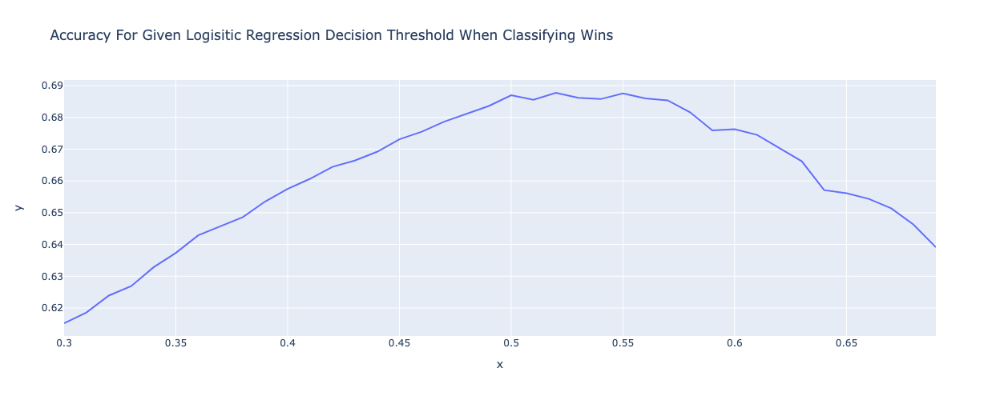

In [84]:
fig = px.line(x = decision_thresh, y = accuracy, title='Accuracy For Given Logisitic Regression Decision Threshold When Classifying Wins ', height = 500, width = 1300)
fig.show()

In [85]:
print(f"Model training accuracy peaks at {max(accuracy).round(2)}% when the decision threshrold for classifying games outcomes as wins is set to {decision_thresh[accuracy.index(max(accuracy))].round(2)}")

Model training accuracy peaks at 0.69% when the decision threshrold for classifying games outcomes as wins is set to 0.52


In [86]:
predict_win = [1 if prob > decision_thresh[accuracy.index(max(accuracy))] else 0 for prob in probabilities]
print(classification_report(y_test, team_log_reg_pipeline.predict(X_test_reduced)))

              precision    recall  f1-score   support

           0       0.59      0.66      0.62       760
           1       0.74      0.68      0.71      1085

    accuracy                           0.67      1845
   macro avg       0.66      0.67      0.66      1845
weighted avg       0.68      0.67      0.67      1845



After altering the decision threshold for classifying wins to .53 from the default .50, the overall model accuracy slightly increased from 67% to 68%. This was done at the expense of decreasing the f1-score for classifying loses, but increasing the f1-score for classifying wins.

#### Odds Ratio

Now that we have a logistic regression model fully configured, we can visualize how each feature contributes to the outcome classification of games.

In [87]:
# Get coefficients from logistic regression
coefficients = team_log_reg_pipeline.named_steps['model'].coef_


In [88]:
# Create data frame displaying each features coefficient and odds ratio
odds_ratio = pd.DataFrame({"Coefficient": coefficients[0], 
              "odds_ratio": np.exp(coefficients[0])}, index = X_train_reduced.columns).sort_values(by = "odds_ratio", ascending = False)

In [89]:
odds_ratio

,Coefficient,odds_ratio
FG_per100_home,2.140135,8.500584
eFG%_of_opp_away,1.313230,3.718165
FT_per100_home,1.101237,3.007884
TS%_home,0.928639,2.531062
TOV%_away,0.886743,2.427212
TOV%_of_opp_home,0.850422,2.340633
3P_per100_home,0.536864,1.710634
%3PA_Corner_home,0.402263,1.495205
Att_Heaves_home,0.360120,1.433501
DRB%_home,0.327779,1.387882


The top influencing feature that contributes to win predictions is `eFG%_of_opp_away`. Keeping all over features constant, one unit increase in `eFG%_of_opp_away` increases the odds of winning by 1.49 times. The odds for all the remaining features are outlined visually below.

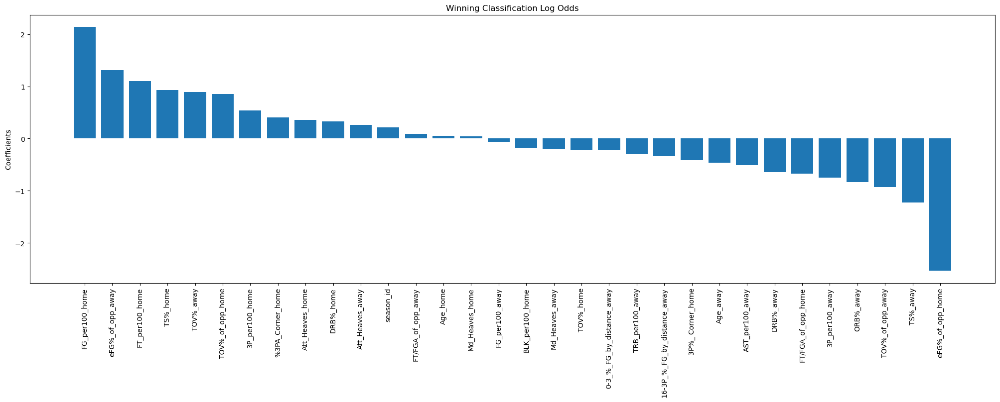

In [90]:
# Log odds plot
plt.figure(figsize = (25,7))
plt.bar(odds_ratio.index, odds_ratio["Coefficient"])

plt.title("Winning Classification Log Odds")
plt.ylabel("Coefficients")
plt.xticks(rotation=90)

plt.show()

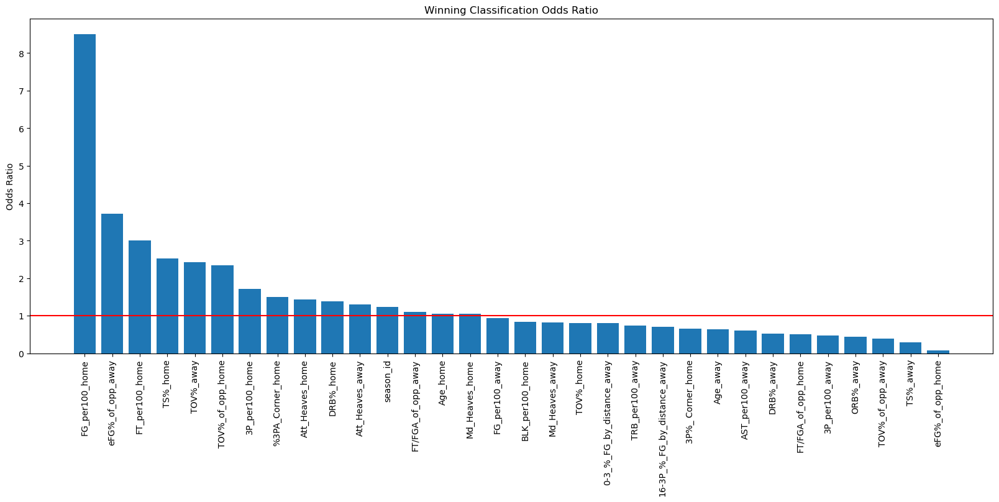

In [91]:
# Odds ratio plot
plt.figure(figsize = (20,7))


plt.bar(odds_ratio.index, odds_ratio["odds_ratio"])
plt.axhline(1, color = "red")

plt.title("Winning Classification Odds Ratio")
plt.ylabel("Odds Ratio")
plt.xticks(rotation=90)

plt.show()

# Player Statistics

At this point in the analysis, we will shift away from focusing on overall team statistics and focus more on aggregating individual player statistics with the goal of achieving a more detailed game to game statistical comparison between teams. This new approach will have the advantage of being less vulnerable to outcomes misclassifications that are due to important players missing from particular games. This is because with this approach, we will be able to compare team match-ups with players that are available to play, just like in reality where final playing rosters have to submitted before the game starts. The processing of this player statistical data will be similar to how it was done previously with the team statistical data. We will consider similar data sets that related to team performance as before, but now they will relate to individual player performance. The three data sets that relate to player performance that will initially be explored are `Advanced Player Stats`, `Player Per 100 Possession Stats`, and `ESPN Player Rating` data set. 

## Player Box Score Data Set

Since this approach requires getting information regarding which players played in any given game, a `player boxscore` data set is needed because it contains information about which players played in a game.

In [176]:
# Import player boxscore data set
player_boxscore = pd.read_csv("data/NBA Player Box Score Stats(1950 - 2022).csv")

# Condense data to contain seasons 2012-2018
player_boxscore = player_boxscore.loc[(player_boxscore["Season"] >= 2012) & (player_boxscore["Season"] <= 2018)]

player_boxscore.head()

,Unnamed: 0,Season,Game_ID,PLAYER_NAME,Team,GAME_DATE,MATCHUP,WL,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS,VIDEO_AVAILABLE
1011858,956887,2012,21100086,AJ Price,IND,"JAN 04, 2012",IND @ MIA,L,5,0,0.0,0.000,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1.0,0
1011859,956888,2012,21100068,AJ Price,IND,"JAN 02, 2012",IND @ NJN,W,3,1,2.0,0.500,1.0,2.0,0.5,0,0.0,0.0,0.0,1.0,1.0,2.0,0.0,0.0,0.0,0.0,3,-3.0,0
1011860,956886,2012,21100102,AJ Price,IND,"JAN 06, 2012",IND @ BOS,W,14,0,1.0,0.000,0.0,0.0,0.0,2,2.0,1.0,0.0,2.0,2.0,2.0,0.0,0.0,1.0,1.0,2,6.0,0
1011861,956885,2012,21100111,AJ Price,IND,"JAN 07, 2012",IND vs. CHA,W,14,0,2.0,0.000,0.0,2.0,0.0,0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,0.0,1.0,0.0,0,17.0,0
1011862,956884,2012,21100127,AJ Price,IND,"JAN 09, 2012",IND @ PHI,L,15,1,7.0,0.143,0.0,2.0,0.0,2,2.0,1.0,0.0,2.0,2.0,1.0,2.0,0.0,2.0,2.0,4,2.0,0


In [177]:
# Change date into a numerical format
month = player_boxscore["GAME_DATE"].str[:3]

month.unique()

month_mapping = {"JAN": "01",
                 "FEB": "02",
                 "MAR": "03",
                 "APR": "04",
                 "OCT": "10",
                 "NOV": "11",
                 "DEC": "12",
                }

month = month.replace(month_mapping)

In [178]:
# Get numerical value for day
day = player_boxscore["GAME_DATE"].str[4:6]

In [179]:
# Get numerical value for year
year = player_boxscore["GAME_DATE"].str[7:12]

In [180]:
# Reformat the data
player_boxscore["game_date"] = year + "-" + month + "-" + day

In [181]:
# Drop old date from data frame
game_column = player_boxscore.pop("game_date")

game_column

player_boxscore.drop(columns = "GAME_DATE", inplace = True)

In [182]:
# Move new create date into third column
player_boxscore.insert(2, 'Game_Date', game_column)

In [183]:
# Make new data a pandas Datetime data type
player_boxscore["Game_Date"] = pd.to_datetime(player_boxscore["Game_Date"])

In [184]:
# Replace names to that that are found more commonly in another way
player_boxscore["PLAYER_NAME"] = player_boxscore["PLAYER_NAME"].str.replace(".", "")\
.str.replace(r'( Sr| Jr| III| II| IV)', '', regex = True)\
.str.replace("Jeffery Taylor", "Jeff Taylor")\
.str.replace("Vitor Faverani", "Vitor Luiz Faverani")\
.str.replace("Vincent Edwards", "Vince Edwards")\
.str.replace("'", "")


player_boxscore["Team"] = player_boxscore["Team"].replace({"PHX": "PHO",
                                                           "CHA": "CHO",
                                                           "BKN": "BRK"
                                                            })

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/3599490373.py:2: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [185]:
# Make letters all lower case
player_boxscore["PLAYER_NAME"] = player_boxscore["PLAYER_NAME"].apply(str.lower)

In [186]:
player_boxscore.head()

,Unnamed: 0,Season,Game_Date,Game_ID,PLAYER_NAME,Team,MATCHUP,WL,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS,VIDEO_AVAILABLE
1011858,956887,2012,2012-01-04,21100086,aj price,IND,IND @ MIA,L,5,0,0.0,0.000,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1.0,0
1011859,956888,2012,2012-01-02,21100068,aj price,IND,IND @ NJN,W,3,1,2.0,0.500,1.0,2.0,0.5,0,0.0,0.0,0.0,1.0,1.0,2.0,0.0,0.0,0.0,0.0,3,-3.0,0
1011860,956886,2012,2012-01-06,21100102,aj price,IND,IND @ BOS,W,14,0,1.0,0.000,0.0,0.0,0.0,2,2.0,1.0,0.0,2.0,2.0,2.0,0.0,0.0,1.0,1.0,2,6.0,0
1011861,956885,2012,2012-01-07,21100111,aj price,IND,IND vs. CHA,W,14,0,2.0,0.000,0.0,2.0,0.0,0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,0.0,1.0,0.0,0,17.0,0
1011862,956884,2012,2012-01-09,21100127,aj price,IND,IND @ PHI,L,15,1,7.0,0.143,0.0,2.0,0.0,2,2.0,1.0,0.0,2.0,2.0,1.0,2.0,0.0,2.0,2.0,4,2.0,0


## ESPN RPM

Real Plus-Minus registers the net change in score while a player is on the court.

In [187]:
# Import ESPN player rating Data set  
espn_rpm = pd.read_csv("data/espn_player_rpm_years2012-2018.csv") 

In [188]:
espn_rpm.head()

,Unnamed: 0,RK,NAME,TEAM,GP,MPG,ORPM,DRPM,RPM,WINS,Season
0,0,1,"LeBron James, SF",MIA,62,37.5,5.49,1.39,6.88,14.30,2012
1,1,2,"Chris Paul, PG",LAC,60,36.4,4.65,2.02,6.67,12.80,2012
2,2,3,"Dwight Howard, C",ORL,54,38.3,1.65,4.21,5.86,11.10,2012
3,3,4,"Ryan Anderson, PF",ORL,61,32.2,3.71,1.74,5.45,10.00,2012
4,4,5,"Blake Griffin, PF",LAC,66,36.2,2.46,2.70,5.16,11.67,2012


Rk -- Rank
<br>
NAME -- Player name and position
<br>
Team -- Team player plays for.
<br>
GP -- Number of games played
<br>
MPG -- Average Minutes played per game
<br>
ORPM -- Offensive contribution while on the court
<br>
DRPM -- Defensive contribution while on the court
<br>
RPM -- Player total contribution while on the court
<br>
WINS -- Player total contribution while on the court





In [189]:
# Separate player name from position
for i in range(0, espn_rpm.shape[0]):

    espn_rpm["NAME"][i] = espn_rpm["NAME"][i].split(",")[0]
 

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/3655898411.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [190]:
# Remove special characters from names 
espn_rpm["NAME"] = espn_rpm["NAME"].str.replace(".", "")\
.str.replace("ý", "y")\
.str.replace("ã", "a")\
.str.replace("č", "c")\
.str.replace("ū", "u")\
.str.replace("ć", "c")\
.str.replace("İ", "I")\
.str.replace("á", "a")\
.str.replace("é", "e")\
.str.replace("ó", "o")\
.str.replace("é", "e")\
.str.replace("ü", "u")\
.str.replace("ğ", "g")\
.str.replace("Jr", '')\
.str.replace("Sr", '')\
.str.replace("í", "i")\
.str.replace("Ö", "O")\
.str.replace("ş", "s")\
.str.replace("ı", "i")\
.str.replace("ņ", "n")\
.str.replace("š", "s")\
.str.replace("ê", "e")\
.str.replace("ue Holiday", "Jrue Holiday")\
.str.replace("ë", "e")\
.str.replace("ç", "c")\
.str.replace("ö", "o")\
.str.replace("ģ", "g")\
.str.replace("ž", "z")\
.str.replace("Š", "S")\
.str.replace("è", "e")\
.str.replace("Ž", "Z")\
.str.replace("ā", "a")\
.str.replace("ß", "ss")\
.str.replace("Á", "A")\
.str.replace("'", "")\
.str.replace(r'( Sr| Jr| III| II| IV)', '', regex = True)



espn_rpm["NAME"] = espn_rpm["NAME"].str.strip()

espn_rpm["NAME"] = espn_rpm["NAME"].apply(str.lower)


/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/193489734.py:2: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [191]:
espn_rpm.head()

,Unnamed: 0,RK,NAME,TEAM,GP,MPG,ORPM,DRPM,RPM,WINS,Season
0,0,1,lebron james,MIA,62,37.5,5.49,1.39,6.88,14.30,2012
1,1,2,chris paul,LAC,60,36.4,4.65,2.02,6.67,12.80,2012
2,2,3,dwight howard,ORL,54,38.3,1.65,4.21,5.86,11.10,2012
3,3,4,ryan anderson,ORL,61,32.2,3.71,1.74,5.45,10.00,2012
4,4,5,blake griffin,LAC,66,36.2,2.46,2.70,5.16,11.67,2012


## Advanced Stats Dataset

In [192]:
# Import player advanced stats dataset 
adv_stats = pd.read_csv("data/NBA_Advanced_Stats_2002-2022.csv")

In [193]:
# Initial look at data frame
adv_stats.head()

,Unnamed: 0,year-name,Pos,Age,Tm,G,MP,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP,year
0,0,2003-Tariq Abdul-Wahad,SG,28,DAL,14,204,12.4,0.470,0.017,0.103,7.6,14.0,10.8,15.4,1.5,1.1,10.3,15.0,0.2,0.2,0.4,0.104,-1.6,0.2,-1.4,0.0,2003
1,1,2003-Shareef Abdur-Rahim,PF,26,ATL,81,3087,19.9,0.566,0.051,0.457,6.7,17.8,12.5,14.7,1.5,0.9,13.0,24.2,7.4,2.3,9.7,0.151,2.3,-0.7,1.6,2.8,2003
2,2,2003-Courtney Alexander,PG,25,NOH,66,1360,9.3,0.459,0.113,0.289,3.3,6.8,5.0,9.8,1.2,0.3,10.7,21.3,0.1,1.0,1.1,0.040,-3.3,-1.2,-4.5,-0.9,2003
3,3,2003-Malik Allen,PF,24,MIA,80,2318,9.9,0.455,0.005,0.153,6.5,14.9,10.6,4.4,0.9,2.6,13.2,19.7,-1.7,2.6,0.9,0.018,-3.9,-0.4,-4.4,-1.4,2003
4,4,2003-Ray Allen,SG,27,TOT,76,2880,21.3,0.565,0.391,0.253,3.8,11.8,7.8,21.6,1.9,0.4,11.6,27.8,7.6,1.5,9.1,0.152,4.7,-1.0,3.6,4.1,2003


Rk -- Rank
<br>
Pos -- Position
<br>
Age -- Player's age on February 1 of the season
<br>
Tm -- Team
<br>
G -- Games
<br>
MP -- Minutes Played
<br>
PER -- Player Efficiency Rating
<br>
A measure of per-minute production standardized such that the league average is 15.
<br>
TS% -- True Shooting Percentage
<br>
A measure of shooting efficiency that takes into account 2-point field goals, 3-point field goals, and free throws.
<br>
3PAr -- 3-Point Attempt Rate
Percentage of FG Attempts from 3-Point Range
<br>
FTr -- Free Throw Attempt Rate
Number of FT Attempts Per FG Attempt
<br>
ORB% -- Offensive Rebound Percentage
An estimate of the percentage of available offensive rebounds a player grabbed while they were on the floor.
<br>
DRB% -- Defensive Rebound Percentage
An estimate of the percentage of available defensive rebounds a player grabbed while they were on the floor.
<br>
TRB% -- Total Rebound Percentage
An estimate of the percentage of available rebounds a player grabbed while they were on the floor.
<br>
AST% -- Assist Percentage
An estimate of the percentage of teammate field goals a player assisted while they were on the floor.
<br>
STL% -- Steal Percentage
An estimate of the percentage of opponent possessions that end with a steal by the player while they were on the floor.
<br>
BLK% -- Block Percentage
An estimate of the percentage of opponent two-point field goal attempts blocked by the player while they were on the floor.
<br>
TOV% -- Turnover Percentage
An estimate of turnovers committed per 100 plays.
<br>
USG% -- Usage Percentage
An estimate of the percentage of team plays used by a player while they were on the floor.
<br>
OWS -- Offensive Win Shares
An estimate of the number of wins contributed by a player due to offense.
<br>
DWS -- Defensive Win Shares
An estimate of the number of wins contributed by a player due to defense.
<br>
WS -- Win Shares
An estimate of the number of wins contributed by a player.
<br>
WS/48 -- Win Shares Per 48 Minutes
An estimate of the number of wins contributed by a player per 48 minutes (league average is approximately .100)
<br>
OBPM -- Offensive Box Plus/Minus
A box score estimate of the offensive points per 100 possessions a player contributed above a league-average player, translated to an average team.
<br>
DBPM -- Defensive Box Plus/Minus
A box score estimate of the defensive points per 100 possessions a player contributed above a league-average player, translated to an average team.
<br>
BPM -- Box Plus/Minus
A box score estimate of the points per 100 possessions a player contributed above a league-average player, translated to an average team.
<br>
VORP -- Value over Replacement Player
A box score estimate of the points per 100 TEAM possessions that a player contributed above a replacement-level (-2.0) player, translated to an average team and prorated to an 82-game season.

Multiply by 2.70 to convert to wins over replacement.

In [194]:
# Separate the year from player name
adv_stats["PLAYER_NAME"] = adv_stats["year-name"].str.slice(5)
adv_stats = adv_stats.drop(columns = ["year-name"])

# Remove Unnamed column
adv_stats = adv_stats.drop(adv_stats.columns[0],axis = 1)

In [195]:
# Remove all special characters from player names
adv_stats["PLAYER_NAME"] = adv_stats["PLAYER_NAME"].str.replace(".", "")\
.str.replace("ý", "y")\
.str.replace("ã", "a")\
.str.replace("č", "c")\
.str.replace("ū", "u")\
.str.replace("ć", "c")\
.str.replace("İ", "I")\
.str.replace("á", "a")\
.str.replace("é", "e")\
.str.replace("ó", "o")\
.str.replace("é", "e")\
.str.replace("ü", "u")\
.str.replace("ğ", "g")\
.str.replace("Jr", '')\
.str.replace("Sr", '')\
.str.replace("í", "i")\
.str.replace("Ö", "O")\
.str.replace("ş", "s")\
.str.replace("ı", "i")\
.str.replace("ņ", "n")\
.str.replace("š", "s")\
.str.replace("ê", "e")\
.str.replace("ue Holiday", "Jrue Holiday")\
.str.replace("ë", "e")\
.str.replace("ç", "c")\
.str.replace("ö", "o")\
.str.replace("ģ", "g")\
.str.replace("ž", "z")\
.str.replace("Š", "S")\
.str.replace("è", "e")\
.str.replace("Ž", "Z")\
.str.replace("ā", "a")\
.str.replace("ß", "ss")\
.str.replace("Á", "A")\
.str.replace("'", "")\
.str.replace(r'( Sr| Jr| III| II| IV)', '', regex = True)



adv_stats["PLAYER_NAME"] = adv_stats["PLAYER_NAME"].str.strip()


/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/587103995.py:2: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [196]:
# Make all player characters lower case 
adv_stats["PLAYER_NAME"] = adv_stats["PLAYER_NAME"].apply(str.lower)

In [197]:
# Correct team abbreviations 
adv_stats["Tm"] = adv_stats["Tm"].replace({"PHX": "PHO",
                                           "CHA": "CHO",
                                           "BKN": "BRK"
                                            })

In [198]:
missing_players = []

In [199]:
# Cleaned data set
adv_stats.head()

,Pos,Age,Tm,G,MP,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP,year,PLAYER_NAME
0,SG,28,DAL,14,204,12.4,0.470,0.017,0.103,7.6,14.0,10.8,15.4,1.5,1.1,10.3,15.0,0.2,0.2,0.4,0.104,-1.6,0.2,-1.4,0.0,2003,tariq abdul-wahad
1,PF,26,ATL,81,3087,19.9,0.566,0.051,0.457,6.7,17.8,12.5,14.7,1.5,0.9,13.0,24.2,7.4,2.3,9.7,0.151,2.3,-0.7,1.6,2.8,2003,shareef abdur-rahim
2,PG,25,NOH,66,1360,9.3,0.459,0.113,0.289,3.3,6.8,5.0,9.8,1.2,0.3,10.7,21.3,0.1,1.0,1.1,0.040,-3.3,-1.2,-4.5,-0.9,2003,courtney alexander
3,PF,24,MIA,80,2318,9.9,0.455,0.005,0.153,6.5,14.9,10.6,4.4,0.9,2.6,13.2,19.7,-1.7,2.6,0.9,0.018,-3.9,-0.4,-4.4,-1.4,2003,malik allen
4,SG,27,TOT,76,2880,21.3,0.565,0.391,0.253,3.8,11.8,7.8,21.6,1.9,0.4,11.6,27.8,7.6,1.5,9.1,0.152,4.7,-1.0,3.6,4.1,2003,ray allen


/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/1661096431.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



Text(0.5, 1.0, 'Correlation Heatmap for Advanced Stats')

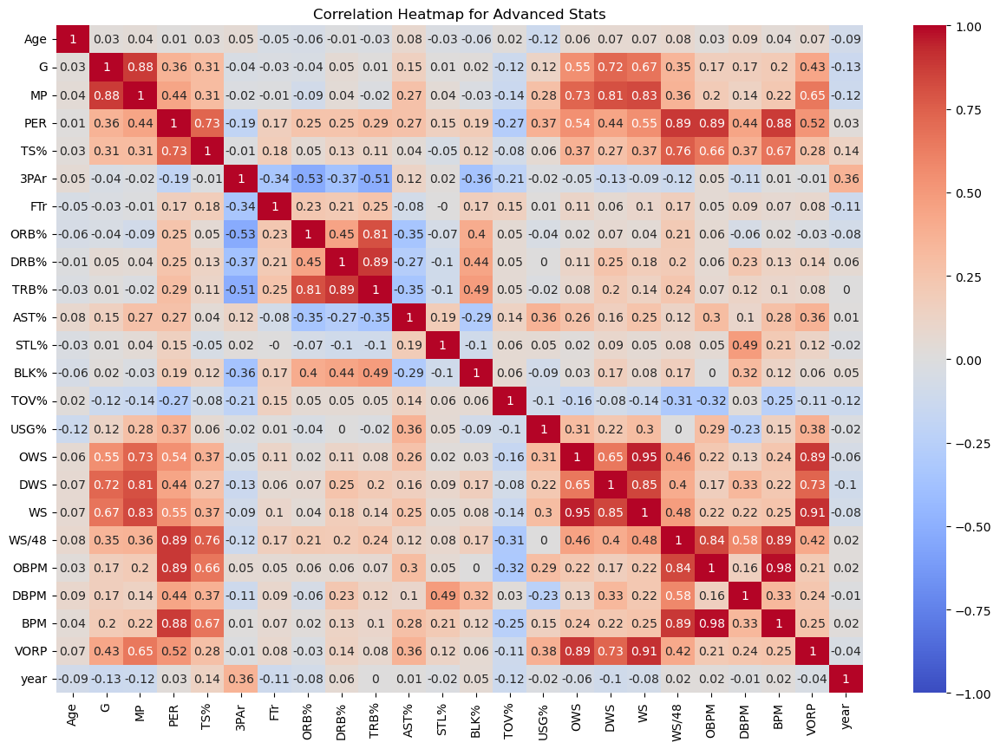

In [200]:
# Correlation heatmap 
plt.figure(figsize = (15,10))
sns.heatmap(adv_stats.corr().round(2), vmin = -1, vmax = 1, cmap = "coolwarm", annot = True)

plt.title("Correlation Heatmap for Advanced Stats")

In [201]:
#adv_stats = adv_stats.drop(columns = ["BPM", "TRB%", "WS", "G", "VORP", "WS/48", "OWS", "DWS", "PER", "MP", "OBPM", "DBPM"] )
adv_stats = adv_stats.drop(columns = ["BPM", "TRB%", "WS", "G"] )

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/2635663164.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



Text(0.5, 1.0, 'Correlation Heatmap for Advanced Stats With Reduced Features')

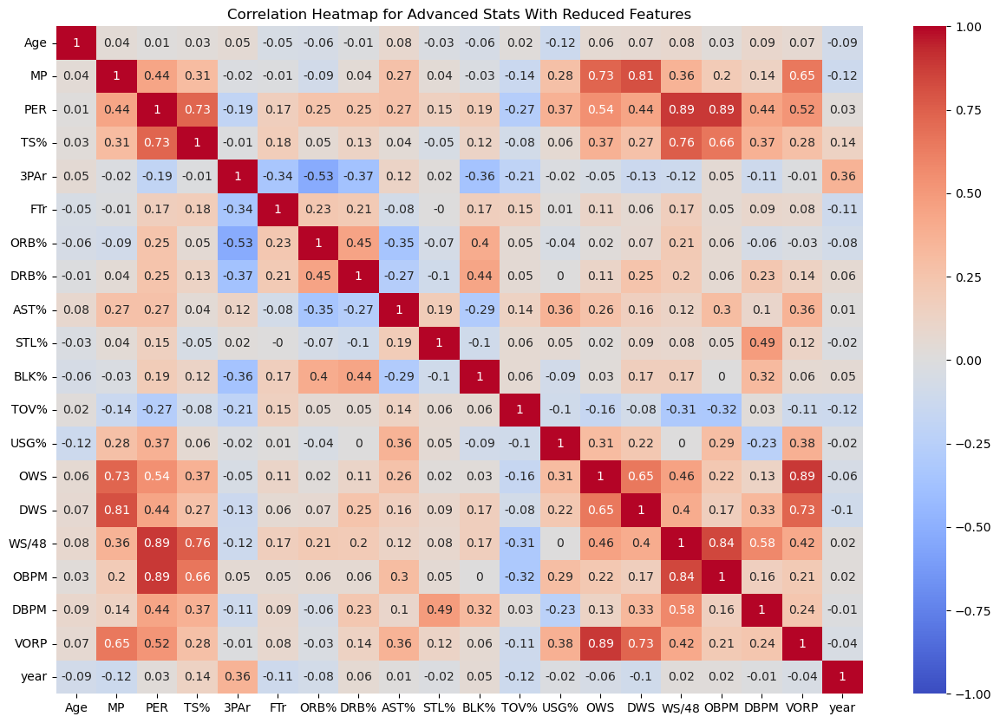

In [202]:
# Correlation heatmap 
plt.figure(figsize = (15,10))
sns.heatmap(adv_stats.corr().round(2), vmin = -1, vmax = 1, cmap = "coolwarm", annot = True)
plt.title("Correlation Heatmap for Advanced Stats With Reduced Features")

In [203]:
adv_stats.head()

,Pos,Age,Tm,MP,PER,TS%,3PAr,FTr,ORB%,DRB%,AST%,STL%,BLK%,TOV%,USG%,OWS,DWS,WS/48,OBPM,DBPM,VORP,year,PLAYER_NAME
0,SG,28,DAL,204,12.4,0.470,0.017,0.103,7.6,14.0,15.4,1.5,1.1,10.3,15.0,0.2,0.2,0.104,-1.6,0.2,0.0,2003,tariq abdul-wahad
1,PF,26,ATL,3087,19.9,0.566,0.051,0.457,6.7,17.8,14.7,1.5,0.9,13.0,24.2,7.4,2.3,0.151,2.3,-0.7,2.8,2003,shareef abdur-rahim
2,PG,25,NOH,1360,9.3,0.459,0.113,0.289,3.3,6.8,9.8,1.2,0.3,10.7,21.3,0.1,1.0,0.040,-3.3,-1.2,-0.9,2003,courtney alexander
3,PF,24,MIA,2318,9.9,0.455,0.005,0.153,6.5,14.9,4.4,0.9,2.6,13.2,19.7,-1.7,2.6,0.018,-3.9,-0.4,-1.4,2003,malik allen
4,SG,27,TOT,2880,21.3,0.565,0.391,0.253,3.8,11.8,21.6,1.9,0.4,11.6,27.8,7.6,1.5,0.152,4.7,-1.0,4.1,2003,ray allen


In [204]:
## Player Total Stats Dataset

tot_stats= pd.read_csv("/Users/trey/Desktop/NBA/Nba Data/csv/box_score_totals_2012-2018.csv")

tot_stats["Player"] = tot_stats["Player"].str.replace(".", "")\
.str.replace("ý", "y")\
.str.replace("ã", "a")\
.str.replace("č", "c")\
.str.replace("ū", "u")\
.str.replace("ć", "c")\
.str.replace("İ", "I")\
.str.replace("á", "a")\
.str.replace("é", "e")\
.str.replace("ó", "o")\
.str.replace("é", "e")\
.str.replace("ü", "u")\
.str.replace("ğ", "g")\
.str.replace("Jr", '')\
.str.replace("Sr", '')\
.str.replace("í", "i")\
.str.replace("Ö", "O")\
.str.replace("ş", "s")\
.str.replace("ı", "i")\
.str.replace("ņ", "n")\
.str.replace("š", "s")\
.str.replace("ê", "e")\
.str.replace("ue Holiday", "Jrue Holiday")\
.str.replace("ë", "e")\
.str.replace("ç", "c")\
.str.replace("ö", "o")\
.str.replace("ģ", "g")\
.str.replace("ž", "z")\
.str.replace("Š", "S")\
.str.replace("è", "e")\
.str.replace("Ž", "Z")\
.str.replace("ā", "a")\
.str.replace("ß", "ss")\
.str.replace("Á", "A")\
.str.replace("'", "")\
.str.replace(r'( Sr| Jr| III| II| IV)', '', regex = True)



tot_stats["Player"] = tot_stats["Player"].str.strip()

tot_stats["Player"] = tot_stats["Player"].apply(str.lower)


tot_stats.tail()

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/424312634.py:5: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



,Player,Rk,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Season
4843,tyler zeller,537,C,28,BRK,42,33,703,125,229,0.546,10,26,0.385,115,203,0.567,0.568,40,60,0.667,63,131,194,28,8,21,35,78,300,2018
4844,tyler zeller,537,C,28,MIL,24,1,406,62,105,0.590,0,2,0.000,62,103,0.602,0.590,17,19,0.895,47,64,111,19,7,14,12,48,141,2018
4845,paul zipser,538,SF,23,CHI,54,12,824,81,234,0.346,37,110,0.336,44,124,0.355,0.425,19,25,0.760,13,118,131,46,20,15,43,86,218,2018
4846,ante zizic,539,C,21,CLE,32,2,214,49,67,0.731,0,0,NaN,49,67,0.731,0.731,21,29,0.724,24,36,60,5,2,13,11,30,119,2018
4847,ivica zubac,540,C,20,LAL,43,0,410,61,122,0.500,0,1,0.000,61,121,0.504,0.500,39,51,0.765,45,78,123,25,8,15,26,47,161,2018


## Player Per 100 Stats Dataset

In [205]:
# Import data set
player_per_100_stats= pd.read_csv("data/player_per_100_2012-2018.csv")

In [206]:
player_per_100_stats.head()

,Player,Rk,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,ORtg,DRtg,Season
0,Jeff Adrien,1,PF,24,GSW,23,0,196,5.9,13.9,0.426,0.0,0.0,0.000,5.9,13.9,0.426,2.8,4.9,0.579,5.9,9.0,15.0,2.6,1.0,1.3,2.3,7.2,14.7,102,110,2011
1,Arron Afflalo,2,SG,25,DEN,69,69,2324,6.7,13.5,0.498,2.3,5.4,0.423,4.5,8.2,0.546,3.0,3.5,0.847,1.0,4.5,5.4,3.6,0.7,0.7,1.5,3.3,18.7,123,111,2011
2,Maurice Ager,3,SG,26,MIN,4,0,29,10.3,18.9,0.545,5.1,6.9,0.750,5.1,12.0,0.429,0.0,0.0,0.000,0.0,3.4,3.4,1.7,1.7,0.0,6.9,6.9,25.7,94,114,2011
3,Alexis Ajinça,4,C,22,TOT,34,2,340,9.0,20.3,0.444,1.8,5.2,0.353,7.2,15.1,0.475,2.0,2.7,0.722,2.6,9.3,11.9,1.5,1.7,2.9,2.7,11.1,21.8,98,107,2011
4,Alexis Ajinça,4,C,22,DAL,10,2,75,8.4,22.4,0.375,2.1,4.9,0.429,6.3,17.5,0.360,1.4,2.1,0.667,3.5,8.4,11.9,1.4,2.1,3.5,0.7,9.1,20.3,97,100,2011


Rk -- Rank
<br>
Pos -- Position
<br>
Age -- Player's age on February 1 of the season
<br>
Tm -- Team
<br>
G -- Games
<br>
GS -- Games Started
<br>
MP -- Minutes Played
<br>
FG -- Field Goals Per 100 Team Possessions
<br>
FGA -- Field Goal Attempts Per 100 Team Possessions
<br>
FG% -- Field Goal Percentage
<br>
3P -- 3-Point Field Goals Per 100 Team Possesssions
<br>
3PA -- 3-Point Field Goal Attempts Per 100 Team Possessions
<br>
3P% -- 3-Point Field Goal Percentage
<br>
2P -- 2-Point Field Goals Per 100 Team Possessions
<br>
2PA -- 2-Point Field Goal Attempts Per 100 Team Possessions
<br>
2P% -- 2-Point Field Goal Percentage
<br>
FT -- Free Throws Per 100 Team Possessions
<br>
FTA -- Free Throw Attempts Per 100 Team Possessions
<br>
FT% -- Free Throw Percentage
<br>
ORB -- Offensive Rebounds Per 100 Team Possessions
<br>
DRB -- Defensive Rebounds Per 100 Team Possessions
<br>
TRB -- Total Rebounds Per 100 Team Possessions
<br>
AST -- Assists Per 100 Team Possessions
<br>
STL -- Steals Per 100 Team Possessions
<br>
BLK -- Blocks Per 100 Team Possessions
<br>
TOV -- Turnovers Per 100 Team Possessions
<br>
PF -- Personal Fouls Per 100 Team Possessions
<br>
PTS -- Points Per 100 Team Possessions
<br>
ORtg -- Offensive Rating
<br>
An estimate of points produced (players) or scored (teams) per 100 possessions
<br>
DRtg -- Defensive Rating

An estimate of points allowed per 100 possessions

In [207]:
# Remove special characters from names
player_per_100_stats["Player"] = player_per_100_stats["Player"].str.replace(".", "")\
.str.replace("ý", "y")\
.str.replace("ã", "a")\
.str.replace("č", "c")\
.str.replace("ū", "u")\
.str.replace("ć", "c")\
.str.replace("İ", "I")\
.str.replace("á", "a")\
.str.replace("é", "e")\
.str.replace("ó", "o")\
.str.replace("é", "e")\
.str.replace("ü", "u")\
.str.replace("ğ", "g")\
.str.replace("Jr", '')\
.str.replace("Sr", '')\
.str.replace("í", "i")\
.str.replace("Ö", "O")\
.str.replace("ş", "s")\
.str.replace("ı", "i")\
.str.replace("ņ", "n")\
.str.replace("š", "s")\
.str.replace("ê", "e")\
.str.replace("ue Holiday", "Jrue Holiday")\
.str.replace("ë", "e")\
.str.replace("ç", "c")\
.str.replace("ö", "o")\
.str.replace("ģ", "g")\
.str.replace("ž", "z")\
.str.replace("Š", "S")\
.str.replace("è", "e")\
.str.replace("Ž", "Z")\
.str.replace("ā", "a")\
.str.replace("ß", "ss")\
.str.replace("Á", "A")\
.str.replace("'", "")\
.str.replace(r'( Sr| Jr| III| II| IV)', '', regex = True)



player_per_100_stats["Player"] = player_per_100_stats["Player"].str.strip()

player_per_100_stats["Player"] = player_per_100_stats["Player"].apply(str.lower)

player_per_100_stats = player_per_100_stats.dropna(axis = 1, how = "all")

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/4192927500.py:2: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [208]:
player_per_100_stats.head()

,Player,Rk,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,ORtg,DRtg,Season
0,jeff adrien,1,PF,24,GSW,23,0,196,5.9,13.9,0.426,0.0,0.0,0.000,5.9,13.9,0.426,2.8,4.9,0.579,5.9,9.0,15.0,2.6,1.0,1.3,2.3,7.2,14.7,102,110,2011
1,arron afflalo,2,SG,25,DEN,69,69,2324,6.7,13.5,0.498,2.3,5.4,0.423,4.5,8.2,0.546,3.0,3.5,0.847,1.0,4.5,5.4,3.6,0.7,0.7,1.5,3.3,18.7,123,111,2011
2,maurice ager,3,SG,26,MIN,4,0,29,10.3,18.9,0.545,5.1,6.9,0.750,5.1,12.0,0.429,0.0,0.0,0.000,0.0,3.4,3.4,1.7,1.7,0.0,6.9,6.9,25.7,94,114,2011
3,alexis ajinca,4,C,22,TOT,34,2,340,9.0,20.3,0.444,1.8,5.2,0.353,7.2,15.1,0.475,2.0,2.7,0.722,2.6,9.3,11.9,1.5,1.7,2.9,2.7,11.1,21.8,98,107,2011
4,alexis ajinca,4,C,22,DAL,10,2,75,8.4,22.4,0.375,2.1,4.9,0.429,6.3,17.5,0.360,1.4,2.1,0.667,3.5,8.4,11.9,1.4,2.1,3.5,0.7,9.1,20.3,97,100,2011


In [209]:
# Fill empty cells with 0
player_per_100_stats = player_per_100_stats.fillna(0)

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/2307799230.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

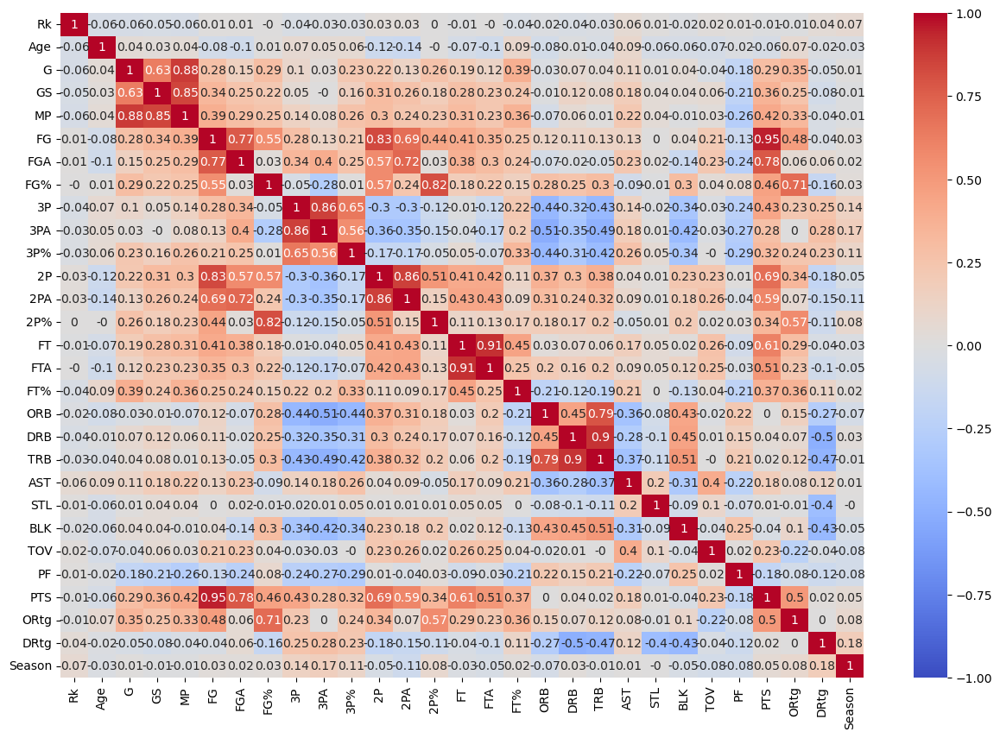

In [210]:
# Correlation Heatmap
plt.figure(figsize = (15,10))
sns.heatmap(player_per_100_stats.corr().round(2), vmin = -1, cmap = "coolwarm", annot = True)

In [211]:
player_per_100_stats = player_per_100_stats.drop(columns = ["Rk", "G", "GS", "MP", "PTS", "TRB", "FG%", "3PA", "2PA", "FTA", "ORtg", "DRtg"])
#player_per_100_stats = player_per_100_stats.drop(columns = ["Rk", "G", "GS", "MP"])

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/2216809387.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

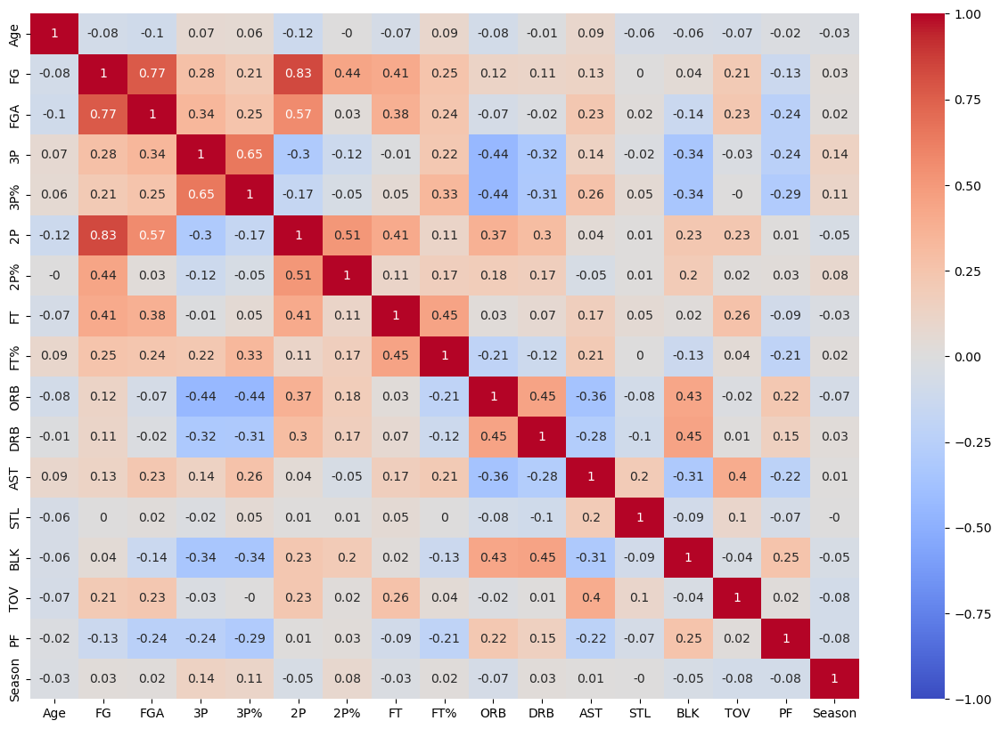

In [212]:
plt.figure(figsize = (15,10))
sns.heatmap(player_per_100_stats.corr().round(2), vmin = -1, cmap = "coolwarm", annot = True)

In [213]:
player_per_100_stats.head()

,Player,Pos,Age,Tm,FG,FGA,3P,3P%,2P,2P%,FT,FT%,ORB,DRB,AST,STL,BLK,TOV,PF,Season
0,jeff adrien,PF,24,GSW,5.9,13.9,0.0,0.000,5.9,0.426,2.8,0.579,5.9,9.0,2.6,1.0,1.3,2.3,7.2,2011
1,arron afflalo,SG,25,DEN,6.7,13.5,2.3,0.423,4.5,0.546,3.0,0.847,1.0,4.5,3.6,0.7,0.7,1.5,3.3,2011
2,maurice ager,SG,26,MIN,10.3,18.9,5.1,0.750,5.1,0.429,0.0,0.000,0.0,3.4,1.7,1.7,0.0,6.9,6.9,2011
3,alexis ajinca,C,22,TOT,9.0,20.3,1.8,0.353,7.2,0.475,2.0,0.722,2.6,9.3,1.5,1.7,2.9,2.7,11.1,2011
4,alexis ajinca,C,22,DAL,8.4,22.4,2.1,0.429,6.3,0.360,1.4,0.667,3.5,8.4,1.4,2.1,3.5,0.7,9.1,2011


In [214]:
per_100_add_features = [col for col in player_per_100_stats.columns if "%" not in col and player_per_100_stats[col].dtype != "object"]
per_100_add_features.remove("Season")

In [215]:
adv_stats_add_features = [col for col in adv_stats.columns if "%" not in col and adv_stats[col].dtype != "object"]
adv_stats_add_features.remove("year")
adv_stats_add_features.remove("Age")
adv_stats_add_features

['MP', 'PER', '3PAr', 'FTr', 'OWS', 'DWS', 'WS/48', 'OBPM', 'DBPM', 'VORP']

In [216]:
adv_stats_percentage_features = [col for col in adv_stats.columns if "%" in col]
adv_stats_percentage_features.remove("USG%")

In [217]:
player_game_stats = per_100_add_features + adv_stats_add_features + adv_stats_percentage_features

In [218]:
games_players

,season_id,team_abbreviation_home,team_name_home,team_abbreviation_away,team_name_away,game_date,wl_home,home_team_id,away_team_id,home_ESPN_ORPM,away_ESPN_ORPM,home_ESPN_DRPM,away_ESPN_DRPM,home_ESPN_WINS,away_ESPN_WINS,home_Age,away_Age,home_FG,away_FG,home_FGA,away_FGA,home_3P,away_3P,home_2P,away_2P,home_FT,away_FT,home_ORB,away_ORB,home_DRB,away_DRB,home_AST,away_AST,home_STL,away_STL,home_BLK,away_BLK,home_TOV,away_TOV,home_PF,away_PF,home_MP,away_MP,home_PER,away_PER,home_3PAr,away_3PAr,home_FTr,away_FTr,home_OWS,away_OWS,home_DWS,away_DWS,home_WS/48,away_WS/48,home_OBPM,away_OBPM,home_DBPM,away_DBPM,home_VORP,away_VORP,home_TS%,away_TS%,home_ORB%,away_ORB%,home_DRB%,away_DRB%,home_AST%,away_AST%,home_STL%,away_STL%,home_BLK%,away_BLK%,home_TOV%,away_TOV%
0,2013,CLE,Cleveland Cavaliers,WAS,Washington Wizards,2012-10-30,W,Cleveland Cavaliers-2013,Washington Wizards-2013,3.49,-3.91,-4.66,0.25,17.52,16.18,168,222,58.9,68.6,136.8,160.8,14.1,19.0,44.8,49.6,27.3,28.0,18.5,17.7,44.6,57.0,31.0,45.0,13.1,12.4,4.6,6.2,20.6,28.2,30.0,35.8,12093,10474,106.4,92.0,2.019,2.154,1.849,1.732,12.5,7.4,7.3,13.6,0.576,0.627,4.5,-4.9,-6.0,2.6,4.7,5.7,0.773728,0.691869,7.5825,5.7789,21.4552,18.6697,24.0582,21.0235,2.8196,1.9046,1.5183,1.5775,17.6450,17.4931
1,2013,LAL,Los Angeles Lakers,DAL,Dallas Mavericks,2012-10-30,L,Los Angeles Lakers-2013,Dallas Mavericks-2013,7.88,2.87,-3.65,-3.98,34.14,20.93,225,200,60.5,57.1,126.4,119.6,9.6,10.5,50.6,46.6,32.4,21.5,24.5,15.8,54.9,48.3,31.7,31.5,9.3,12.8,9.6,9.9,22.6,17.8,27.4,29.4,13641,13417,121.4,112.4,1.502,1.633,2.666,1.646,22.7,17.3,14.1,12.8,0.901,0.781,7.4,3.3,-1.3,2.2,11.8,9.1,0.824734,0.740984,11.2753,6.5630,24.8489,19.6803,23.9493,19.0566,2.0207,2.4252,2.8713,2.8260,19.8517,15.9580
2,2013,MIA,Miami Heat,BOS,Boston Celtics,2012-10-30,W,Miami Heat-2013,Boston Celtics-2013,8.19,-2.15,3.35,4.05,45.64,27.93,217,212,62.0,57.8,126.4,124.1,16.9,9.6,45.1,48.2,28.1,25.6,10.4,10.0,42.2,47.7,35.2,40.8,13.9,12.6,7.8,6.5,20.2,22.3,26.0,26.7,14403,14576,125.4,108.2,2.808,1.511,1.858,1.745,35.4,13.4,18.5,19.3,1.125,0.749,14.5,1.6,2.1,3.9,19.6,10.2,0.869442,0.791125,5.8605,4.7281,20.9817,22.8446,27.5030,28.6836,3.0665,2.6284,2.6322,2.0457,18.1872,20.1684
3,2013,PHO,Phoenix Suns,GSW,Golden State Warriors,2012-10-31,L,Phoenix Suns-2013,Golden State Warriors-2013,-2.93,4.64,-4.04,-4.50,17.23,30.14,187,188,56.9,64.8,126.3,129.8,7.8,10.2,49.4,54.5,22.2,26.2,19.2,15.2,47.9,47.1,32.1,37.0,11.9,8.3,7.6,6.0,21.8,25.3,30.0,35.5,14112,13862,99.5,112.3,1.283,1.341,1.649,1.840,10.8,24.1,10.6,14.2,0.465,0.831,-4.6,4.1,-2.5,3.5,4.3,12.6,0.718801,0.860746,8.0270,6.5440,21.8875,20.1045,21.2088,26.7797,2.3411,1.7870,2.2190,1.5610,18.8074,22.2969
4,2013,PHI,Philadelphia 76ers,DEN,Denver Nuggets,2012-10-31,W,Philadelphia 76ers-2013,Denver Nuggets-2013,0.92,9.14,1.36,-3.20,26.88,33.08,180,189,60.1,61.5,137.7,126.6,13.4,8.5,46.7,52.9,19.7,24.7,13.6,18.6,48.1,44.0,35.0,36.9,12.2,13.7,7.0,11.0,18.9,21.5,25.2,31.5,14810,13775,104.9,118.0,1.945,1.296,1.345,1.981,9.8,22.0,16.3,14.7,0.603,0.922,-1.0,5.9,1.2,2.8,7.6,11.8,0.753728,0.771999,5.9003,7.9709,21.8923,18.7441,24.4276,21.7634,2.5585,2.8274,2.1494,3.2446,16.4253,18.4030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6144,2017,ORL,Orlando Magic,DET,Detroit Pistons,2017-04-12,W,Orlando Magic-2017,Detroit Pistons-2017,1.97,0.81,-7.63,2.85,13.51,17.77,218,178,75.3,62.4,172.8,131.3,22.4,10.2,52.6,52.1,25.1,22.7,12.0,22.0,55.3,60.2,36.6,27.0,16.9,10.9,7.1,6.9,22.2,14.2,33.1,23.8,11553,12164,96.1,120.8,2.406,1.743,1.477,1.607,6.0,12.4,9.9,15.8,0.389,0.916,-6.8,4.3,-2.5,4.0,3.9,8.2,0.766537,0.757454,5.1944,10.1283,22.2036,28.6180,22.7649,16.0744,2.5980,2.1624,1.8611,2.4578,16.9785,12.4825
6145,2017,GSW,Golden State Warriors,LAL,Los Ang

## Player Stats Aggregation

In this section, the top 7 players for each team are found for each game and the individual player stats

In [219]:
# Instantiate stats columns in data set
columns = ["ESPN_ORPM", "ESPN_DRPM", "ESPN_WINS"]

for i in columns:
    
    games_players["home_" + i] = 0
    games_players["away_" + i] = 0


for i in player_game_stats:
    
    games_players["home_" + i] = 0
    games_players["away_" + i] = 0


/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/3917490768.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/3917490768.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/3917490768.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the 

In [220]:
for i in range(0, games_players.shape[0]):

#for i in range(0, 10):
    # *******************************
    # GAME BY GAME ACTIVE ROSTER
    # _____________________________
    
    # GET ACTIVE ROSTER FOR HOME TEAM

    home_roster = player_boxscore[(player_boxscore["Game_Date"] == games_players["game_date"][i]) & (player_boxscore["Team"] == games_players["team_abbreviation_home"][i])]

    home_roster = home_roster.sort_values(by = "MIN", ascending = False)["PLAYER_NAME"]
    
    home_roster = home_roster.head(7)

    
   # GET ACTIVE ROSTER FOR AWAY TEAM

    away_roster = player_boxscore[(player_boxscore["Game_Date"] == games_players["game_date"][i]) & (player_boxscore["Team"] == games_players["team_abbreviation_away"][i])]

    away_roster = away_roster.sort_values(by = "MIN", ascending = False)["PLAYER_NAME"]
    
    away_roster = away_roster.head(7)
    
    # *******************************
    # ACTIVE ROSTER ADVANCED STATS
    # _____________________________

    
    # Get home team advance stats for each player in active roster

    home_adv_stats = adv_stats[(adv_stats["PLAYER_NAME"].isin(home_roster)) & (adv_stats["year"] == games_players["season_id"][i]) & (adv_stats["Tm"] == games_players["team_abbreviation_home"][i])]
    #home_tot_stats = tot_stats[(tot_stats["Player"].isin(home_roster)) & (tot_stats["Season"] == games_players["season_id"][i]) & (tot_stats["Tm"] == games_players["team_abbreviation_home"][i])]
    
    home_espn_rpm_roster = espn_rpm[(espn_rpm["NAME"].isin(home_roster)) & (espn_rpm["Season"] == games_players["season_id"][i])]
    #display(home_adv_stats.head(15))
    #display(home_tot_stats.head(15))
    
    
    home_player_per_100_roster = player_per_100_stats[(player_per_100_stats["Player"].isin(home_roster)) & (player_per_100_stats["Season"] == games_players["season_id"][i])]
    
    
    #---------------------------------------------------------------------------------------------------------------------------------------------------------------- 
    # ONLY RUN TO CHECK PLAYER NAME DISCREPANCIES BETWEEN 'PLAYER BOXSCORE' AND 'ADVANCED STATS' DATASETS
    
    # Verify all home players are present for advanced stats .. returns players that did not transfer from active home roster 
    home_roster = home_roster.sort_values() 
    home_adv_stats["PLAYER_NAME"] = home_adv_stats["PLAYER_NAME"].sort_values()
    
    #home_tot_stats["Player"] = home_tot_stats["Player"].sort_values()
    '''
    if len(list(set(home_roster) - set(home_adv_stats["PLAYER_NAME"]))) != 0:

        missing_players.append(list(set(home_roster) - set(home_adv_stats["PLAYER_NAME"])))
        #print("Home")
        #print(missing_players)
        
    else:
        pass
    '''
      
    #----------------------------------------------------------------------------------------------------------------------------------------------------------------
    
    # Get away team advance stats for each player in active roster

    away_adv_stats = adv_stats[(adv_stats["PLAYER_NAME"].isin(away_roster)) & (adv_stats["year"] == games_players["season_id"][i]) & (adv_stats["Tm"] == games_players["team_abbreviation_away"][i])]
    
    away_espn_rpm_roster = espn_rpm[(espn_rpm["NAME"].isin(away_roster)) & (espn_rpm["Season"] == games_players["season_id"][i])]
    #display(away_adv_stats.head(15))

    away_player_per_100_roster = player_per_100_stats[(player_per_100_stats["Player"].isin(away_roster)) & (player_per_100_stats["Season"] == games_players["season_id"][i])]
    
    #----------------------------------------------------------------------------------------------------------------------------------------------------------------
    # ONLY RUN TO CHECK PLAYER NAME DISCREPANCIES BETWEEN 'PLAYER BOXSCORE' AND 'ADVANCED STATS' DATASETS
    
    
    # Verify all away players are present for advanced stats .. returns players that did not transfer from active away roster

    away_roster = away_roster.sort_values() 
    away_adv_stats["PLAYER_NAME"] = away_adv_stats["PLAYER_NAME"].sort_values()

    # ONLY RUN TO CHECK PLAYER NAME DISCREPANCIES BETWEEN 'PLAYER BOXSCORE' AND 'ADVANCED STATS' DATASETS
    '''
    if len(list(set(away_roster) - set(away_adv_stats["PLAYER_NAME"]))) != 0:

        missing_players.append(list(set(away_roster) - set(away_adv_stats["PLAYER_NAME"])))
        #print("Away")
        #print(missing_players)

    else:
        pass
    '''
    
    #----------------------------------------------------------------------------------------------------------------------------------------------------------------
#print(missing_players)

    
    
    games_players["home_ESPN_ORPM"][i] = home_espn_rpm_roster["ORPM"].sum()
    games_players["home_ESPN_DRPM"][i] = home_espn_rpm_roster["DRPM"].sum()
    games_players["home_ESPN_WINS"][i] = home_espn_rpm_roster["WINS"].sum()
    
    games_players["away_ESPN_ORPM"][i] = away_espn_rpm_roster["ORPM"].sum()
    games_players["away_ESPN_DRPM"][i] = away_espn_rpm_roster["DRPM"].sum()
    games_players["away_ESPN_WINS"][i] = away_espn_rpm_roster["WINS"].sum()
    
    
    for j in adv_stats_add_features:
        games_players[f"home_{j}"][i] = home_adv_stats[j].sum()
        games_players[f"away_{j}"][i] = away_adv_stats[j].sum()
        
    for j in per_100_add_features:
        games_players[f"home_{j}"][i] = home_player_per_100_roster[j].sum()
        games_players[f"away_{j}"][i] = away_player_per_100_roster[j].sum()
    
    for j in adv_stats_percentage_features:
        games_players[f"home_{j}"][i] = (home_adv_stats[j] * (home_adv_stats["USG%"]/100)).sum()
        games_players[f"away_{j}"][i] = (away_adv_stats[j] * (away_adv_stats["USG%"]/100)).sum()
        
    
    
    
    
    games_players.reset_index(drop=True, inplace = True)

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/1292275882.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/1292275882.py:80: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/5g/2c9yfhyn5x90_3bhb753w1wh0000gn/T/ipykernel_80068/1292275882.py:99: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

In [221]:
games_players = games_players[games_players["season_id"] <= 2017]

In [222]:
# Output new data frame with 
games_players

,season_id,team_abbreviation_home,team_name_home,team_abbreviation_away,team_name_away,game_date,wl_home,home_team_id,away_team_id,home_ESPN_ORPM,away_ESPN_ORPM,home_ESPN_DRPM,away_ESPN_DRPM,home_ESPN_WINS,away_ESPN_WINS,home_Age,away_Age,home_FG,away_FG,home_FGA,away_FGA,home_3P,away_3P,home_2P,away_2P,home_FT,away_FT,home_ORB,away_ORB,home_DRB,away_DRB,home_AST,away_AST,home_STL,away_STL,home_BLK,away_BLK,home_TOV,away_TOV,home_PF,away_PF,home_MP,away_MP,home_PER,away_PER,home_3PAr,away_3PAr,home_FTr,away_FTr,home_OWS,away_OWS,home_DWS,away_DWS,home_WS/48,away_WS/48,home_OBPM,away_OBPM,home_DBPM,away_DBPM,home_VORP,away_VORP,home_TS%,away_TS%,home_ORB%,away_ORB%,home_DRB%,away_DRB%,home_AST%,away_AST%,home_STL%,away_STL%,home_BLK%,away_BLK%,home_TOV%,away_TOV%
0,2013,CLE,Cleveland Cavaliers,WAS,Washington Wizards,2012-10-30,W,Cleveland Cavaliers-2013,Washington Wizards-2013,3.49,-3.91,-4.66,0.25,17.52,16.18,168,222,58.9,68.6,136.8,160.8,14.1,19.0,44.8,49.6,27.3,28.0,18.5,17.7,44.6,57.0,31.0,45.0,13.1,12.4,4.6,6.2,20.6,28.2,30.0,35.8,12093,10474,106.4,92.0,2.019,2.154,1.849,1.732,12.5,7.4,7.3,13.6,0.576,0.627,4.5,-4.9,-6.0,2.6,4.7,5.7,0.773728,0.691869,7.5825,5.7789,21.4552,18.6697,24.0582,21.0235,2.8196,1.9046,1.5183,1.5775,17.6450,17.4931
1,2013,LAL,Los Angeles Lakers,DAL,Dallas Mavericks,2012-10-30,L,Los Angeles Lakers-2013,Dallas Mavericks-2013,7.88,2.87,-3.65,-3.98,34.14,20.93,225,200,60.5,57.1,126.4,119.6,9.6,10.5,50.6,46.6,32.4,21.5,24.5,15.8,54.9,48.3,31.7,31.5,9.3,12.8,9.6,9.9,22.6,17.8,27.4,29.4,13641,13417,121.4,112.4,1.502,1.633,2.666,1.646,22.7,17.3,14.1,12.8,0.901,0.781,7.4,3.3,-1.3,2.2,11.8,9.1,0.824734,0.740984,11.2753,6.5630,24.8489,19.6803,23.9493,19.0566,2.0207,2.4252,2.8713,2.8260,19.8517,15.9580
2,2013,MIA,Miami Heat,BOS,Boston Celtics,2012-10-30,W,Miami Heat-2013,Boston Celtics-2013,8.19,-2.15,3.35,4.05,45.64,27.93,217,212,62.0,57.8,126.4,124.1,16.9,9.6,45.1,48.2,28.1,25.6,10.4,10.0,42.2,47.7,35.2,40.8,13.9,12.6,7.8,6.5,20.2,22.3,26.0,26.7,14403,14576,125.4,108.2,2.808,1.511,1.858,1.745,35.4,13.4,18.5,19.3,1.125,0.749,14.5,1.6,2.1,3.9,19.6,10.2,0.869442,0.791125,5.8605,4.7281,20.9817,22.8446,27.5030,28.6836,3.0665,2.6284,2.6322,2.0457,18.1872,20.1684
3,2013,PHO,Phoenix Suns,GSW,Golden State Warriors,2012-10-31,L,Phoenix Suns-2013,Golden State Warriors-2013,-2.93,4.64,-4.04,-4.50,17.23,30.14,187,188,56.9,64.8,126.3,129.8,7.8,10.2,49.4,54.5,22.2,26.2,19.2,15.2,47.9,47.1,32.1,37.0,11.9,8.3,7.6,6.0,21.8,25.3,30.0,35.5,14112,13862,99.5,112.3,1.283,1.341,1.649,1.840,10.8,24.1,10.6,14.2,0.465,0.831,-4.6,4.1,-2.5,3.5,4.3,12.6,0.718801,0.860746,8.0270,6.5440,21.8875,20.1045,21.2088,26.7797,2.3411,1.7870,2.2190,1.5610,18.8074,22.2969
4,2013,PHI,Philadelphia 76ers,DEN,Denver Nuggets,2012-10-31,W,Philadelphia 76ers-2013,Denver Nuggets-2013,0.92,9.14,1.36,-3.20,26.88,33.08,180,189,60.1,61.5,137.7,126.6,13.4,8.5,46.7,52.9,19.7,24.7,13.6,18.6,48.1,44.0,35.0,36.9,12.2,13.7,7.0,11.0,18.9,21.5,25.2,31.5,14810,13775,104.9,118.0,1.945,1.296,1.345,1.981,9.8,22.0,16.3,14.7,0.603,0.922,-1.0,5.9,1.2,2.8,7.6,11.8,0.753728,0.771999,5.9003,7.9709,21.8923,18.7441,24.4276,21.7634,2.5585,2.8274,2.1494,3.2446,16.4253,18.4030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6144,2017,ORL,Orlando Magic,DET,Detroit Pistons,2017-04-12,W,Orlando Magic-2017,Detroit Pistons-2017,1.97,0.81,-7.63,2.85,13.51,17.77,218,178,75.3,62.4,172.8,131.3,22.4,10.2,52.6,52.1,25.1,22.7,12.0,22.0,55.3,60.2,36.6,27.0,16.9,10.9,7.1,6.9,22.2,14.2,33.1,23.8,11553,12164,96.1,120.8,2.406,1.743,1.477,1.607,6.0,12.4,9.9,15.8,0.389,0.916,-6.8,4.3,-2.5,4.0,3.9,8.2,0.766537,0.757454,5.1944,10.1283,22.2036,28.6180,22.7649,16.0744,2.5980,2.1624,1.8611,2.4578,16.9785,12.4825
6145,2017,GSW,Golden State Warriors,LAL,Los Ang

### Prediction Model Using Player Stats

#### Player Data Model Pipeline

In [223]:
# Initialize pipline for logistic regression
player_log_reg_pipeline = Pipeline([
                            ('scaler',MinMaxScaler()),
                            ('model',LogisticRegression())
])

In [224]:
# Initialize pipline for lasso regression
player_lasso_pipeline = Pipeline([
                     ('scaler',MinMaxScaler()),
                     ('model',Lasso())
])

In [225]:
# lasso regression parameters
player_lasso_parameters = [{
                    'model__alpha': np.arange(.00001,1,.001),
                    'model__max_iter': [1500]
                    }]
# Grid search lasso regression with 'negstive mean squared error' for scoring
player_lasso_grid_search = GridSearchCV(player_lasso_pipeline, player_lasso_parameters,
                      cv = 5, scoring="neg_mean_squared_error",verbose=3)

#### Player Model Training/Testing Data

In [226]:
# Establish features and target variables
X = games_players.drop(columns = ["season_id", "game_date", "team_abbreviation_home", "team_abbreviation_away", "team_name_home", "team_name_away", "home_team_id", "away_team_id", "wl_home"])

y = games_players["wl_home"]

#one-hot encode target variable
y = y.replace({"W": 1,
          "L": 0})

In [227]:
X.head()

,home_ESPN_ORPM,away_ESPN_ORPM,home_ESPN_DRPM,away_ESPN_DRPM,home_ESPN_WINS,away_ESPN_WINS,home_Age,away_Age,home_FG,away_FG,home_FGA,away_FGA,home_3P,away_3P,home_2P,away_2P,home_FT,away_FT,home_ORB,away_ORB,home_DRB,away_DRB,home_AST,away_AST,home_STL,away_STL,home_BLK,away_BLK,home_TOV,away_TOV,home_PF,away_PF,home_MP,away_MP,home_PER,away_PER,home_3PAr,away_3PAr,home_FTr,away_FTr,home_OWS,away_OWS,home_DWS,away_DWS,home_WS/48,away_WS/48,home_OBPM,away_OBPM,home_DBPM,away_DBPM,home_VORP,away_VORP,home_TS%,away_TS%,home_ORB%,away_ORB%,home_DRB%,away_DRB%,home_AST%,away_AST%,home_STL%,away_STL%,home_BLK%,away_BLK%,home_TOV%,away_TOV%
0,3.49,-3.91,-4.66,0.25,17.52,16.18,168,222,58.9,68.6,136.8,160.8,14.1,19.0,44.8,49.6,27.3,28.0,18.5,17.7,44.6,57.0,31.0,45.0,13.1,12.4,4.6,6.2,20.6,28.2,30.0,35.8,12093,10474,106.4,92.0,2.019,2.154,1.849,1.732,12.5,7.4,7.3,13.6,0.576,0.627,4.5,-4.9,-6.0,2.6,4.7,5.7,0.773728,0.691869,7.5825,5.7789,21.4552,18.6697,24.0582,21.0235,2.8196,1.9046,1.5183,1.5775,17.6450,17.4931
1,7.88,2.87,-3.65,-3.98,34.14,20.93,225,200,60.5,57.1,126.4,119.6,9.6,10.5,50.6,46.6,32.4,21.5,24.5,15.8,54.9,48.3,31.7,31.5,9.3,12.8,9.6,9.9,22.6,17.8,27.4,29.4,13641,13417,121.4,112.4,1.502,1.633,2.666,1.646,22.7,17.3,14.1,12.8,0.901,0.781,7.4,3.3,-1.3,2.2,11.8,9.1,0.824734,0.740984,11.2753,6.5630,24.8489,19.6803,23.9493,19.0566,2.0207,2.4252,2.8713,2.8260,19.8517,15.9580
2,8.19,-2.15,3.35,4.05,45.64,27.93,217,212,62.0,57.8,126.4,124.1,16.9,9.6,45.1,48.2,28.1,25.6,10.4,10.0,42.2,47.7,35.2,40.8,13.9,12.6,7.8,6.5,20.2,22.3,26.0,26.7,14403,14576,125.4,108.2,2.808,1.511,1.858,1.745,35.4,13.4,18.5,19.3,1.125,0.749,14.5,1.6,2.1,3.9,19.6,10.2,0.869442,0.791125,5.8605,4.7281,20.9817,22.8446,27.5030,28.6836,3.0665,2.6284,2.6322,2.0457,18.1872,20.1684
3,-2.93,4.64,-4.04,-4.50,17.23,30.14,187,188,56.9,64.8,126.3,129.8,7.8,10.2,49.4,54.5,22.2,26.2,19.2,15.2,47.9,47.1,32.1,37.0,11.9,8.3,7.6,6.0,21.8,25.3,30.0,35.5,14112,13862,99.5,112.3,1.283,1.341,1.649,1.840,10.8,24.1,10.6,14.2,0.465,0.831,-4.6,4.1,-2.5,3.5,4.3,12.6,0.718801,0.860746,8.0270,6.5440,21.8875,20.1045,21.2088,26.7797,2.3411,1.7870,2.2190,1.5610,18.8074,22.2969
4,0.92,9.14,1.36,-3.20,26.88,33.08,180,189,60.1,61.5,137.7,126.6,13.4,8.5,46.7,52.9,19.7,24.7,13.6,18.6,48.1,44.0,35.0,36.9,12.2,13.7,7.0,11.0,18.9,21.5,25.2,31.5,14810,13775,104.9,118.0,1.945,1.296,1.345,1.981,9.8,22.0,16.3,14.7,0.603,0.922,-1.0,5.9,1.2,2.8,7.6,11.8,0.753728,0.771999,5.9003,7.9709,21.8923,18.7441,24.4276,21.7634,2.5585,2.8274,2.1494,3.2446,16.4253,18.4030


In [228]:
X.shape

(6149, 66)

In [229]:
# train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .30, stratify = y, random_state = 30)

In [230]:
# Impliment upssampling
ros = BorderlineSMOTE(random_state=0)

X_train, y_train = ros.fit_resample(X_train, y_train)

In [231]:
y_train.value_counts()

1    2530
0    2530
Name: wl_home, dtype: int64

#### Player Logistic Regression (All Features)

In [232]:
# Train logistic regression model
player_log_reg_pipeline.fit(X_train, y_train)

# Cross validation Score
scores = cross_val_score(player_log_reg_pipeline, X_train, y_train, cv = 5)

scores.mean()

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



0.6867588932806323

In [233]:
print(classification_report(y_test, player_log_reg_pipeline.predict(X_test)))

              precision    recall  f1-score   support

           0       0.61      0.72      0.66       760
           1       0.78      0.67      0.72      1085

    accuracy                           0.69      1845
   macro avg       0.69      0.70      0.69      1845
weighted avg       0.71      0.69      0.70      1845



#### Player Lasso Regression (Feature Selection)

In [234]:
# Fit lasso regression
player_lasso_grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits
[CV 1/5] END model__alpha=1e-05, model__max_iter=1500;, score=-0.206 total time=   0.1s


/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.479e-01, tolerance: 1.009e-01

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.155e-01, tolerance: 1.011e-01



[CV 2/5] END model__alpha=1e-05, model__max_iter=1500;, score=-0.208 total time=   0.3s
[CV 3/5] END model__alpha=1e-05, model__max_iter=1500;, score=-0.194 total time=   0.2s
[CV 4/5] END model__alpha=1e-05, model__max_iter=1500;, score=-0.205 total time=   0.1s
[CV 5/5] END model__alpha=1e-05, model__max_iter=1500;, score=-0.262 total time=   0.1s
[CV 1/5] END model__alpha=0.00101, model__max_iter=1500;, score=-0.205 total time=   0.0s
[CV 2/5] END model__alpha=0.00101, model__max_iter=1500;, score=-0.206 total time=   0.0s
[CV 3/5] END model__alpha=0.00101, model__max_iter=1500;, score=-0.194 total time=   0.0s
[CV 4/5] END model__alpha=0.00101, model__max_iter=1500;, score=-0.202 total time=   0.0s
[CV 5/5] END model__alpha=0.00101, model__max_iter=1500;, score=-0.266 total time=   0.0s
[CV 1/5] END model__alpha=0.00201, model__max_iter=1500;, score=-0.206 total time=   0.0s
[CV 2/5] END model__alpha=0.00201, model__max_iter=1500;, score=-0.206 total time=   0.0s
[CV 3/5] END model

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                       ('model', Lasso())]),
             param_grid=[{'model__alpha': array([1.0000e-05, 1.0100e-03, 2.0100e-03, 3.0100e-03, 4.0100e-03,
       5.0100e-03, 6.0100e-03, 7.0100e-03, 8.0100e-03, 9.0100e-03,
       1.0010e-02, 1.1010e-02, 1.2010e-02, 1.3010e-02, 1.4010e-02,
       1.5010e-02, 1.6010e-02, 1.7010e-02, 1.8010e-02, 1.9010e-02,
       2.001...
       9.7001e-01, 9.7101e-01, 9.7201e-01, 9.7301e-01, 9.7401e-01,
       9.7501e-01, 9.7601e-01, 9.7701e-01, 9.7801e-01, 9.7901e-01,
       9.8001e-01, 9.8101e-01, 9.8201e-01, 9.8301e-01, 9.8401e-01,
       9.8501e-01, 9.8601e-01, 9.8701e-01, 9.8801e-01, 9.8901e-01,
       9.9001e-01, 9.9101e-01, 9.9201e-01, 9.9301e-01, 9.9401e-01,
       9.9501e-01, 9.9601e-01, 9.9701e-01, 9.9801e-01, 9.9901e-01]),
                          'model__max_iter': [1500]}],
             scoring='neg_mean_squared_error', verbose=3)

In [235]:
# Get best parameters and pass those parameters into another lasso regression for best feature selection
print(player_lasso_grid_search.best_params_)

coefficients = player_lasso_grid_search.best_estimator_.named_steps['model'].coef_

importance = np.abs(coefficients)


{'model__alpha': 0.00101, 'model__max_iter': 1500}


In [236]:
player_lasso_pipeline.set_params(**player_lasso_grid_search.best_params_)
player_lasso_pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model', Lasso(alpha=0.00101, max_iter=1500))])

In [237]:
coefficient = player_lasso_pipeline.named_steps['model'].coef_

In [238]:
importance = np.abs(coefficient)

In [239]:
# Features that were not eliminated by lasso
new_features = np.array(X_train.columns)[importance > 0]

new_features

array(['away_ESPN_ORPM', 'home_ESPN_DRPM', 'away_ESPN_DRPM',
       'home_ESPN_WINS', 'away_ESPN_WINS', 'home_Age', 'away_2P',
       'home_AST', 'away_PF', 'home_MP', 'away_3PAr', 'home_WS/48',
       'away_WS/48', 'home_OBPM', 'away_OBPM', 'home_DBPM', 'home_VORP',
       'away_VORP', 'home_ORB%', 'away_ORB%'], dtype=object)

#### Logistic Regression Model (Reduced Features)

In [240]:
# Set new feature list 
X_train_reduced = X_train[[new_features][0]]

X_test_reduced = X_test[[new_features][0]]

In [241]:
X_train_reduced.shape

(5060, 20)

In [242]:
# Fit logistic regression
player_log_reg_pipeline.fit(X_train_reduced, y_train)

Pipeline(steps=[('scaler', MinMaxScaler()), ('model', LogisticRegression())])

In [243]:
# Define threshold range
decision_thresh = np.arange(.3, .7, .01)
accuracy = []

for i,j in enumerate(decision_thresh):
    
    threshold = j
    
    print(f"Performing cross validation with decision threshold {j.round(3)}")
    scores = cross_val_score(player_log_reg_pipeline, X_train_reduced, y_train, cv = 20, scoring = custom_scoring)

    accuracy.append(scores.mean())

Performing cross validation with decision threshold 0.3
Performing cross validation with decision threshold 0.31
Performing cross validation with decision threshold 0.32
Performing cross validation with decision threshold 0.33
Performing cross validation with decision threshold 0.34
Performing cross validation with decision threshold 0.35
Performing cross validation with decision threshold 0.36
Performing cross validation with decision threshold 0.37
Performing cross validation with decision threshold 0.38
Performing cross validation with decision threshold 0.39
Performing cross validation with decision threshold 0.4
Performing cross validation with decision threshold 0.41
Performing cross validation with decision threshold 0.42
Performing cross validation with decision threshold 0.43
Performing cross validation with decision threshold 0.44
Performing cross validation with decision threshold 0.45
Performing cross validation with decision threshold 0.46
Performing cross validation with 

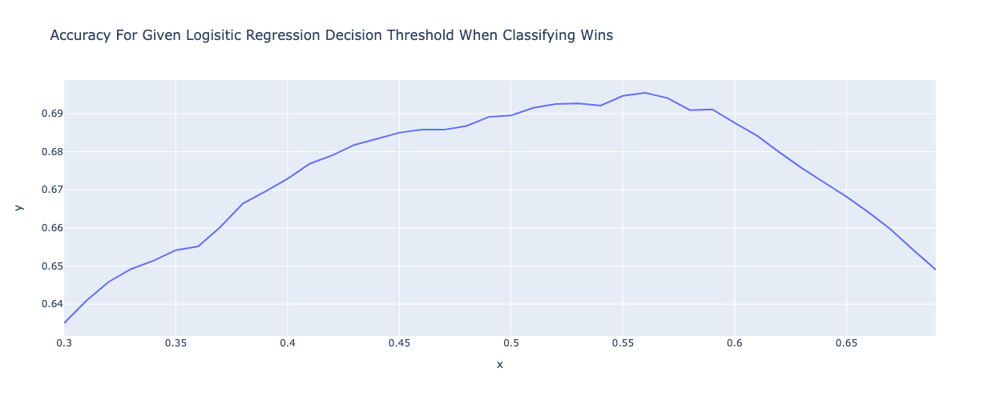

In [244]:
# Plot Accuracy For Given Logisitic Regression Decision Threshold When Classifying Wins
fig = px.line(x = decision_thresh, y = accuracy, title='Accuracy For Given Logisitic Regression Decision Threshold When Classifying Wins ', height = 500, width = 1300)
fig.show()

In [245]:
print(f"Model training accuracy peaks at {max(accuracy).round(3)}% when the decision threshrold for classifying games outcomes as wins is set to {decision_thresh[accuracy.index(max(accuracy))].round(2)}")

Model training accuracy peaks at 0.695% when the decision threshrold for classifying games outcomes as wins is set to 0.56


In [246]:

predict_win = [1 if prob > decision_thresh[accuracy.index(max(accuracy))] else 0 for prob in probabilities]
print(classification_report(y_test, player_log_reg_pipeline.predict(X_test_reduced)))

              precision    recall  f1-score   support

           0       0.61      0.71      0.66       760
           1       0.77      0.69      0.73      1085

    accuracy                           0.70      1845
   macro avg       0.69      0.70      0.69      1845
weighted avg       0.71      0.70      0.70      1845



In [247]:
# Make data frame with coefficients and log odds
player_odds_ratio = pd.DataFrame(
                                {"coefficients": player_log_reg_pipeline.named_steps['model'].coef_[0],
                                 "log_odds": np.exp(player_log_reg_pipeline.named_steps['model'].coef_[0])},
                                 index = X_train_reduced.columns
                                ).sort_values(by = "coefficients", ascending = False)

In [248]:
player_odds_ratio

,coefficients,log_odds
home_OBPM,1.746762,5.736002
home_DBPM,1.204741,3.335896
away_PF,1.028984,2.798221
home_WS/48,1.028123,2.795814
home_ESPN_WINS,0.941127,2.562868
home_ESPN_DRPM,0.905987,2.474373
home_Age,0.751915,2.121058
home_VORP,0.675305,1.964631
away_ORB%,0.567282,1.763467
away_2P,0.259012,1.295649


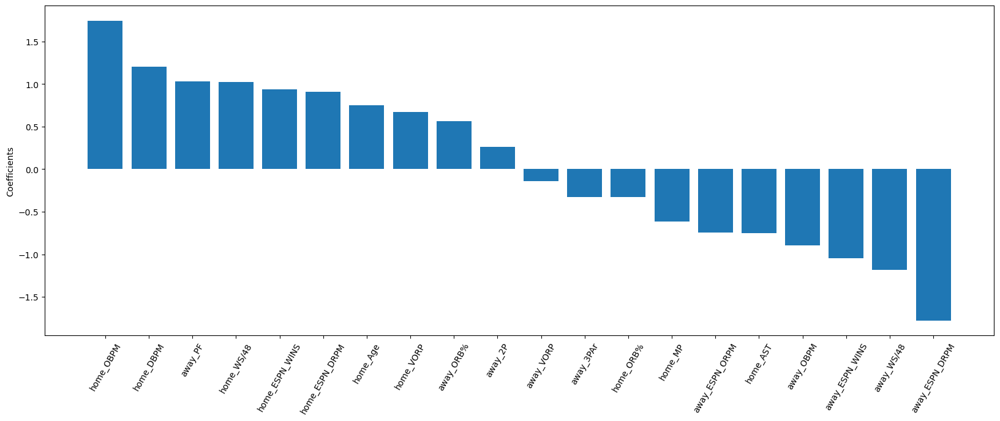

In [249]:
# Plot logistic coefficients
plt.figure(figsize = (20,7))
plt.bar(player_odds_ratio.index, player_odds_ratio["coefficients"])

plt.ylabel("Coefficients")
plt.xticks(rotation=60)

plt.show()

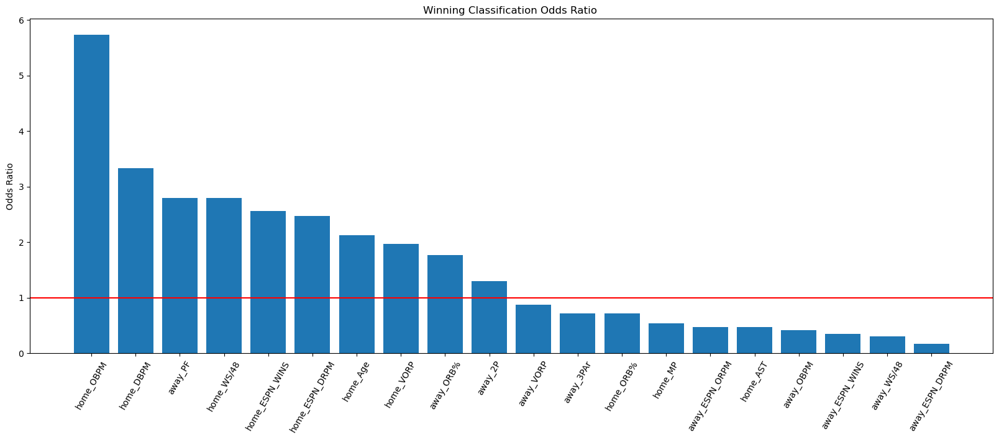

In [250]:
# plot Odds Ratio
plt.figure(figsize = (20,7))

plt.bar(player_odds_ratio.index, player_odds_ratio["log_odds"])
plt.axhline(1, color = "red")

plt.title("Winning Classification Odds Ratio ")
plt.ylabel("Odds Ratio")
plt.xticks(rotation=60)

plt.show()

# Hyperparameter Optimization

In [167]:
# Parameter dictionary for logistic regression
parameter_dict = [{
                    
                                "model__C": [.0001, .001, .01, .1, 1, 10, 100], 
                                "model__penalty": ["l1", "l2", None],
                                "model__solver": ["lbfgs", "liblinear", "saga"]
                                                    
                    }]
               
            

# Gridsearch logistic regression parameters
player_log_reg_grid_search = GridSearchCV(player_log_reg_pipeline, parameter_dict,
                      cv = 5, verbose=3)

In [168]:
# Grid search for best logistic regression coefficients
player_log_reg_grid_search.fit(X_train_reduced, y_train)

Fitting 5 folds for each of 63 candidates, totalling 315 fits
[CV 1/5] END model__C=0.0001, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 2/5] END model__C=0.0001, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 3/5] END model__C=0.0001, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 4/5] END model__C=0.0001, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 5/5] END model__C=0.0001, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 1/5] END model__C=0.0001, model__penalty=l1, model__solver=liblinear;, score=0.500 total time=   0.0s
[CV 2/5] END model__C=0.0001, model__penalty=l1, model__solver=liblinear;, score=0.500 total time=   0.0s
[CV 3/5] END model__C=0.0001, model__penalty=l1, model__solver=liblinear;, score=0.500 total time=   0.0s
[CV 4/5] END model__C=0.0001, model__penalty=l1, model__solver=liblinear;, score=0.500 total time=   0.0s
[CV 5/5] END m

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIO

[CV 3/5] END model__C=0.0001, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 4/5] END model__C=0.0001, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 5/5] END model__C=0.0001, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 1/5] END model__C=0.0001, model__penalty=None, model__solver=saga;, score=0.682 total time=   0.0s
[CV 2/5] END model__C=0.0001, model__penalty=None, model__solver=saga;, score=0.690 total time=   0.0s
[CV 3/5] END model__C=0.0001, model__penalty=None, model__solver=saga;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=0.0001, model__penalty=None, model__solver=saga;, score=0.708 total time=   0.0s


/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters



[CV 5/5] END model__C=0.0001, model__penalty=None, model__solver=saga;, score=0.673 total time=   0.0s
[CV 1/5] END model__C=0.001, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 2/5] END model__C=0.001, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 3/5] END model__C=0.001, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 4/5] END model__C=0.001, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 5/5] END model__C=0.001, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 1/5] END model__C=0.001, model__penalty=l1, model__solver=liblinear;, score=0.500 total time=   0.0s
[CV 2/5] END model__C=0.001, model__penalty=l1, model__solver=liblinear;, score=0.500 total time=   0.0s
[CV 3/5] END model__C=0.001, model__penalty=l1, model__solver=liblinear;, score=0.500 total time=   0.0s
[CV 4/5] END model__C=0.001, model__penalty=l1, model__solver=liblinear;, score=0.500 t

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIO

[CV 4/5] END model__C=0.001, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 5/5] END model__C=0.001, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 1/5] END model__C=0.001, model__penalty=None, model__solver=saga;, score=0.682 total time=   0.0s
[CV 2/5] END model__C=0.001, model__penalty=None, model__solver=saga;, score=0.690 total time=   0.0s
[CV 3/5] END model__C=0.001, model__penalty=None, model__solver=saga;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=0.001, model__penalty=None, model__solver=saga;, score=0.708 total time=   0.0s


/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters



[CV 5/5] END model__C=0.001, model__penalty=None, model__solver=saga;, score=0.673 total time=   0.0s
[CV 1/5] END model__C=0.01, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 2/5] END model__C=0.01, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 3/5] END model__C=0.01, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 4/5] END model__C=0.01, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 5/5] END model__C=0.01, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 1/5] END model__C=0.01, model__penalty=l1, model__solver=liblinear;, score=0.672 total time=   0.0s
[CV 2/5] END model__C=0.01, model__penalty=l1, model__solver=liblinear;, score=0.672 total time=   0.0s
[CV 3/5] END model__C=0.01, model__penalty=l1, model__solver=liblinear;, score=0.692 total time=   0.0s
[CV 4/5] END model__C=0.01, model__penalty=l1, model__solver=liblinear;, score=0.683 total time=

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIO

[CV 2/5] END model__C=0.01, model__penalty=None, model__solver=lbfgs;, score=0.689 total time=   0.0s
[CV 3/5] END model__C=0.01, model__penalty=None, model__solver=lbfgs;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=0.01, model__penalty=None, model__solver=lbfgs;, score=0.708 total time=   0.1s
[CV 5/5] END model__C=0.01, model__penalty=None, model__solver=lbfgs;, score=0.674 total time=   0.1s
[CV 1/5] END model__C=0.01, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 2/5] END model__C=0.01, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 3/5] END model__C=0.01, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 4/5] END model__C=0.01, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 5/5] END model__C=0.01, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s


/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_rati

[CV 1/5] END model__C=0.01, model__penalty=None, model__solver=saga;, score=0.682 total time=   0.0s
[CV 2/5] END model__C=0.01, model__penalty=None, model__solver=saga;, score=0.690 total time=   0.0s
[CV 3/5] END model__C=0.01, model__penalty=None, model__solver=saga;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=0.01, model__penalty=None, model__solver=saga;, score=0.708 total time=   0.0s
[CV 5/5] END model__C=0.01, model__penalty=None, model__solver=saga;, score=0.673 total time=   0.0s
[CV 1/5] END model__C=0.1, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 2/5] END model__C=0.1, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 3/5] END model__C=0.1, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 4/5] END model__C=0.1, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s


/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters



[CV 5/5] END model__C=0.1, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 1/5] END model__C=0.1, model__penalty=l1, model__solver=liblinear;, score=0.692 total time=   0.1s
[CV 2/5] END model__C=0.1, model__penalty=l1, model__solver=liblinear;, score=0.689 total time=   0.1s
[CV 3/5] END model__C=0.1, model__penalty=l1, model__solver=liblinear;, score=0.692 total time=   0.1s
[CV 4/5] END model__C=0.1, model__penalty=l1, model__solver=liblinear;, score=0.695 total time=   0.0s
[CV 5/5] END model__C=0.1, model__penalty=l1, model__solver=liblinear;, score=0.668 total time=   0.0s
[CV 1/5] END model__C=0.1, model__penalty=l1, model__solver=saga;, score=0.681 total time=   0.0s
[CV 2/5] END model__C=0.1, model__penalty=l1, model__solver=saga;, score=0.693 total time=   0.0s
[CV 3/5] END model__C=0.1, model__penalty=l1, model__solver=saga;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=0.1, model__penalty=l1, model__solver=saga;, score=0.699 total time=   0

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIO

[CV 1/5] END model__C=0.1, model__penalty=None, model__solver=lbfgs;, score=0.682 total time=   0.0s
[CV 2/5] END model__C=0.1, model__penalty=None, model__solver=lbfgs;, score=0.689 total time=   0.0s
[CV 3/5] END model__C=0.1, model__penalty=None, model__solver=lbfgs;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=0.1, model__penalty=None, model__solver=lbfgs;, score=0.708 total time=   0.0s
[CV 5/5] END model__C=0.1, model__penalty=None, model__solver=lbfgs;, score=0.674 total time=   0.0s
[CV 1/5] END model__C=0.1, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 2/5] END model__C=0.1, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 3/5] END model__C=0.1, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 4/5] END model__C=0.1, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 5/5] END model__C=0.1, model__penalty=None, model__solver=liblinear;, score=nan

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters



[CV 2/5] END model__C=0.1, model__penalty=None, model__solver=saga;, score=0.690 total time=   0.0s
[CV 3/5] END model__C=0.1, model__penalty=None, model__solver=saga;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=0.1, model__penalty=None, model__solver=saga;, score=0.708 total time=   0.0s
[CV 5/5] END model__C=0.1, model__penalty=None, model__solver=saga;, score=0.673 total time=   0.0s
[CV 1/5] END model__C=1, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 2/5] END model__C=1, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 3/5] END model__C=1, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 4/5] END model__C=1, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 5/5] END model__C=1, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 1/5] END model__C=1, model__penalty=l1, model__solver=liblinear;, score=0.680 total time=   0.2s
[CV 2/5] END model__C=1,

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 3/5] END model__C=1, model__penalty=None, model__solver=lbfgs;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=1, model__penalty=None, model__solver=lbfgs;, score=0.708 total time=   0.0s
[CV 5/5] END model__C=1, model__penalty=None, model__solver=lbfgs;, score=0.674 total time=   0.0s
[CV 1/5] END model__C=1, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 2/5] END model__C=1, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 3/5] END model__C=1, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 4/5] END model__C=1, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 5/5] END model__C=1, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 1/5] END model__C=1, model__penalty=None, model__solver=saga;, score=0.682 total time=   0.0s
[CV 2/5] END model__C=1, model__penalty=None, model__solver=saga;, score=0.690 total time=   0.0s
[C

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 1/5] END model__C=10, model__penalty=l2, model__solver=lbfgs;, score=0.682 total time=   0.0s
[CV 2/5] END model__C=10, model__penalty=l2, model__solver=lbfgs;, score=0.693 total time=   0.0s
[CV 3/5] END model__C=10, model__penalty=l2, model__solver=lbfgs;, score=0.689 total time=   0.0s
[CV 4/5] END model__C=10, model__penalty=l2, model__solver=lbfgs;, score=0.708 total time=   0.0s
[CV 5/5] END model__C=10, model__penalty=l2, model__solver=lbfgs;, score=0.674 total time=   0.0s
[CV 1/5] END model__C=10, model__penalty=l2, model__solver=liblinear;, score=0.682 total time=   0.0s
[CV 2/5] END model__C=10, model__penalty=l2, model__solver=liblinear;, score=0.693 total time=   0.0s
[CV 3/5] END model__C=10, model__penalty=l2, model__solver=liblinear;, score=0.689 total time=   0.0s
[CV 4/5] END model__C=10, model__penalty=l2, model__solver=liblinear;, score=0.708 total time=   0.0s
[CV 5/5] END model__C=10, model__penalty=l2, model__solver=liblinear;, score=0.674 total time=   0.0s


/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIO

[CV 5/5] END model__C=10, model__penalty=None, model__solver=lbfgs;, score=0.674 total time=   0.0s
[CV 1/5] END model__C=10, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 2/5] END model__C=10, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 3/5] END model__C=10, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 4/5] END model__C=10, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 5/5] END model__C=10, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 1/5] END model__C=10, model__penalty=None, model__solver=saga;, score=0.682 total time=   0.0s
[CV 2/5] END model__C=10, model__penalty=None, model__solver=saga;, score=0.690 total time=   0.0s
[CV 3/5] END model__C=10, model__penalty=None, model__solver=saga;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=10, model__penalty=None, model__solver=saga;, score=0.708 total time=  

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_rati

[CV 5/5] END model__C=10, model__penalty=None, model__solver=saga;, score=0.673 total time=   0.0s
[CV 1/5] END model__C=100, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 2/5] END model__C=100, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 3/5] END model__C=100, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 4/5] END model__C=100, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 5/5] END model__C=100, model__penalty=l1, model__solver=lbfgs;, score=nan total time=   0.0s
[CV 1/5] END model__C=100, model__penalty=l1, model__solver=liblinear;, score=0.682 total time=   0.2s
[CV 2/5] END model__C=100, model__penalty=l1, model__solver=liblinear;, score=0.690 total time=   0.2s
[CV 3/5] END model__C=100, model__penalty=l1, model__solver=liblinear;, score=0.693 total time=   0.2s
[CV 4/5] END model__C=100, model__penalty=l1, model__solver=liblinear;, score=0.708 total time=   0.2s
[CV 

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV 5/5] END model__C=100, model__penalty=l2, model__solver=lbfgs;, score=0.673 total time=   0.0s
[CV 1/5] END model__C=100, model__penalty=l2, model__solver=liblinear;, score=0.682 total time=   0.0s
[CV 2/5] END model__C=100, model__penalty=l2, model__solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/5] END model__C=100, model__penalty=l2, model__solver=liblinear;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=100, model__penalty=l2, model__solver=liblinear;, score=0.708 total time=   0.0s
[CV 5/5] END model__C=100, model__penalty=l2, model__solver=liblinear;, score=0.672 total time=   0.0s
[CV 1/5] END model__C=100, model__penalty=l2, model__solver=saga;, score=0.682 total time=   0.0s
[CV 2/5] END model__C=100, model__penalty=l2, model__solver=saga;, score=0.690 total time=   0.0s
[CV 3/5] END model__C=100, model__penalty=l2, model__solver=saga;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=100, model__penalty=l2, model__solver=saga;, score=0.708 total time=  

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIO

[CV 5/5] END model__C=100, model__penalty=None, model__solver=lbfgs;, score=0.674 total time=   0.0s
[CV 1/5] END model__C=100, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 2/5] END model__C=100, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 3/5] END model__C=100, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 4/5] END model__C=100, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 5/5] END model__C=100, model__penalty=None, model__solver=liblinear;, score=nan total time=   0.0s
[CV 1/5] END model__C=100, model__penalty=None, model__solver=saga;, score=0.682 total time=   0.0s
[CV 2/5] END model__C=100, model__penalty=None, model__solver=saga;, score=0.690 total time=   0.0s
[CV 3/5] END model__C=100, model__penalty=None, model__solver=saga;, score=0.693 total time=   0.0s
[CV 4/5] END model__C=100, model__penalty=None, model__solver=saga;, score=0.708 tot

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning:

Setting penalty=None will ignore the C and l1_ratio parameters

/Users/trey/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning:


70 fits failed out of a total of 315.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='rai

[CV 5/5] END model__C=100, model__penalty=None, model__solver=saga;, score=0.673 total time=   0.0s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                       ('model', LogisticRegression())]),
             param_grid=[{'model__C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                          'model__penalty': ['l1', 'l2', None],
                          'model__solver': ['lbfgs', 'liblinear', 'saga']}],
             verbose=3)

In [169]:
print(player_log_reg_grid_search.best_params_)

{'model__C': 10, 'model__penalty': 'l1', 'model__solver': 'liblinear'}


In [170]:
player_log_reg_pipeline.set_params(**player_log_reg_grid_search.best_params_)
player_log_reg_pipeline.fit(X_train_reduced, y_train)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model',
                 LogisticRegression(C=10, penalty='l1', solver='liblinear'))])

In [171]:
# Get training cross validation score
scores = cross_val_score(player_log_reg_pipeline, X_train_reduced, y_train, cv = 5)

scores.mean()

0.6895256916996046

In [172]:
print(classification_report(y_test, player_log_reg_pipeline.predict(X_test_reduced)))

              precision    recall  f1-score   support

           0       0.61      0.71      0.65       760
           1       0.77      0.68      0.72      1085

    accuracy                           0.69      1845
   macro avg       0.69      0.70      0.69      1845
weighted avg       0.70      0.69      0.70      1845



In [173]:

log_reg = LogisticRegression(C = 10, penalty = "l1", solver = "liblinear", max_iter = 2000)

log_reg.fit(X_train_reduced, y_train)


print(classification_report(y_test, player_log_reg_pipeline.predict(X_test_reduced)))

              precision    recall  f1-score   support

           0       0.61      0.71      0.65       760
           1       0.77      0.68      0.72      1085

    accuracy                           0.69      1845
   macro avg       0.69      0.70      0.69      1845
weighted avg       0.70      0.69      0.70      1845

